<font color='purple'> В Блоке 3.2.4 (т.е. там где  раньше был расчет LTV) я создал таблицу **orders_for_ltv** чтобы правильно посчитать LTV для каждого источника. Полная таблица со значениями LTV, CAC и ROI можно запустить в ячейке которая чуть выше. По итогу могу сказать, что теперь значения ROI выглядят адекватно и по ним даже можно сделеть кое-какие выводы).
Выводы:
- Как и ожидалось **1** источник окупился и для дальнейших денежных вливаний он подходит лучше других. Полученные данные похожи на данные, которые мы получили анализируя ROI по когортам.
- **5** и **9** источники тоже нам выгодны, однако, как мы выяснили ранее, срок их окупаемости больше чем у первого источника. 
- теперь сравним **2** и **4** источники. По расчету ROI за 6 месяцев, мы видим что значение меньше 1. Значит источники не окупаются. Однако ранее мы выяснили, что источник 2 окупается на 5 месяц при анализе по когортам. Я считаю, что источник 2 может приносить прибыль и поэтому его финансирование нельзя прекращать. 

Что же касается источников **4, 10, 3**, думаю про ниж нужно забыть. Эти источники не приносят необходимого дохода, а значит не выгодны компании.
</font>

# Аналитика в Яндекс.Афише

## Описание проекта

Вас пригласили на стажировку в отдел аналитики Яндекс.Афиши. У вас в распоряжении есть данные от Яндекс.Афиши с июня 2017 по конец мая 2018 года:

    -лог сервера с данными о посещениях сайта Яндекс.Афиши
    -выгрузка всех заказов за этот период
    -статистика рекламных расходов

Первое задание: помочь маркетологам оптимизировать маркетинговые затраты.

**Продукт**

    -Сколько людей пользуются в день, неделю, месяц?
    -Сколько сессий в день?
    -Сколько длится одна сессия?
    -Как часто люди возвращаются?

**Продажи**

    -Когда люди начинают покупать?
    -Сколько раз покупают за период?
    -Какой средний чек?
    -Сколько денег приносят? (LTV)

**Маркетинг**

    -Сколько денег потратили? Всего / на каждый источник / по времени
    -Сколько стоило привлечение одного покупателя из каждого источника?
    -На сколько окупились расходы? (ROI)
    -Отобразите на графиках, как эти метрики отличаются по устройствам и по рекламным источникам? Как они меняются во времени?

**Рекомендации**

    -Порекомендуйте маркетологам, куда и сколько им стоит вкладывать денег?
    -Какие источники/платформы вы бы порекомендовали?
    -Объясните свой выбор: на какие метрики вы ориентируетесь? Почему? Какие выводы вы сделали, узнав значение метрик?

# 1. Анализ предоставленных данных


## 1.1 Импортируем библиотеки, выводим табличные данные, знакомимся с данными

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
from scipy import stats as st
import numpy as np
import statsmodels.stats.api as sms

In [3]:
visits = pd.read_csv('/datasets/visits_log.csv')  
orders = pd.read_csv('/datasets/orders_log.csv')
costs = pd.read_csv('/datasets/costs.csv')

In [4]:
visits

,Device,End Ts,Source Id,Start Ts,Uid
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168
...,...,...,...,...,...
359395,desktop,2017-07-29 19:07:19,2,2017-07-29 19:07:00,18363291481961487539
359396,touch,2018-01-25 17:38:19,1,2018-01-25 17:38:00,18370831553019119586
359397,desktop,2018-03-03 10:12:19,4,2018-03-03 10:12:00,18387297585500748294
359398,desktop,2017-11-02 10:12:19,5,2017-11-02 10:12:00,18388616944624776485


Таблица visits. Значения наименования столбцов:

    1) Device - категория устройства пользователя
    2) Source Id - идентификатор рекламного источника, из которого пришел пользователь
    3) Start Ts - дата и время начала сессии
    4) End Ts - дата и время окончания сессии
    5) Uid - уникальный идентификатор пользователя

In [5]:
orders

,Buy Ts,Revenue,Uid
0,2017-06-01 00:10:00,17.00,10329302124590727494
1,2017-06-01 00:25:00,0.55,11627257723692907447
2,2017-06-01 00:27:00,0.37,17903680561304213844
3,2017-06-01 00:29:00,0.55,16109239769442553005
4,2017-06-01 07:58:00,0.37,14200605875248379450
...,...,...,...
50410,2018-05-31 23:50:00,4.64,12296626599487328624
50411,2018-05-31 23:50:00,5.80,11369640365507475976
50412,2018-05-31 23:54:00,0.30,1786462140797698849
50413,2018-05-31 23:56:00,3.67,3993697860786194247


Таблица orders. Значения наименования столбцов:

    1) Buy Ts — дата и время заказа
    2) Revenue — выручка Яндекс.Афиши с этого заказа
    3) Uid — уникальный id пользователя, который сделал заказ

In [6]:
costs

,source_id,dt,costs
0,1,2017-06-01,75.20
1,1,2017-06-02,62.25
2,1,2017-06-03,36.53
3,1,2017-06-04,55.00
4,1,2017-06-05,57.08
...,...,...,...
2537,10,2018-05-27,9.92
2538,10,2018-05-28,21.26
2539,10,2018-05-29,11.32
2540,10,2018-05-30,33.15


Таблица costs. Значения наименования столбцов:

    1) source_id — идентификатор рекламного источника
    2) dt — дата
    3) costs — затраты на этот рекламный источник в этот день

Ознакомимся с типами данных.

In [7]:
visits.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 359400 entries, 0 to 359399
Data columns (total 5 columns):
Device       359400 non-null object
End Ts       359400 non-null object
Source Id    359400 non-null int64
Start Ts     359400 non-null object
Uid          359400 non-null uint64
dtypes: int64(1), object(3), uint64(1)
memory usage: 13.7+ MB


In [8]:
orders.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50415 entries, 0 to 50414
Data columns (total 3 columns):
Buy Ts     50415 non-null object
Revenue    50415 non-null float64
Uid        50415 non-null uint64
dtypes: float64(1), object(1), uint64(1)
memory usage: 1.2+ MB


In [9]:
costs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2542 entries, 0 to 2541
Data columns (total 3 columns):
source_id    2542 non-null int64
dt           2542 non-null object
costs        2542 non-null float64
dtypes: float64(1), int64(1), object(1)
memory usage: 59.7+ KB


### Общий вывод

    1) Для таблиц visits, orders, costs необходимо переименование заголовков столбцов. Верхний регистр и пробелы в названиях не лучший вариант 
    2) visits - при визульном выводе таблицы, видно что начало сессии равно ее окончанию. Нужно проверить данную таблицу на предмет таких срабатываний, посмотреть есть ли что-то общее в них (возможно устройство или uid) 
    3) Общее для всех таблиц - стобцы с сессиями необходимо перевести из object в форматы даты.

# 2. Предобработка данных


## 2.1 Работа с названиями столбцов и типами данных

In [10]:
visits.columns = ['device', 'session_end', 'source_id', 'session_start', 'uid']
visits.columns

Index(['device', 'session_end', 'source_id', 'session_start', 'uid'], dtype='object')

In [11]:
orders.columns = ['activity_date', 'revenue', 'uid']
orders.columns

Index(['activity_date', 'revenue', 'uid'], dtype='object')

In [12]:
visits['session_end'] = pd.to_datetime(visits['session_end'])
visits['session_start'] = pd.to_datetime(visits['session_start'])
orders['activity_date'] = pd.to_datetime(orders['activity_date'])
costs['dt'] = pd.to_datetime(costs['dt'])

Теперь проверим все таблицы на предмет внесенных изменений

In [13]:
visits.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 359400 entries, 0 to 359399
Data columns (total 5 columns):
device           359400 non-null object
session_end      359400 non-null datetime64[ns]
source_id        359400 non-null int64
session_start    359400 non-null datetime64[ns]
uid              359400 non-null uint64
dtypes: datetime64[ns](2), int64(1), object(1), uint64(1)
memory usage: 13.7+ MB


In [14]:
orders.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50415 entries, 0 to 50414
Data columns (total 3 columns):
activity_date    50415 non-null datetime64[ns]
revenue          50415 non-null float64
uid              50415 non-null uint64
dtypes: datetime64[ns](1), float64(1), uint64(1)
memory usage: 1.2 MB


In [15]:
costs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2542 entries, 0 to 2541
Data columns (total 3 columns):
source_id    2542 non-null int64
dt           2542 non-null datetime64[ns]
costs        2542 non-null float64
dtypes: datetime64[ns](1), float64(1), int64(1)
memory usage: 59.7 KB


In [16]:
visits_for_ltv = visits.copy()

In [17]:
orders_for_ltv = orders.copy()

In [18]:
orders_for_ltv.columns = ['order_date', 'revenue', 'uid']

Наименования столбцов изменены, столбцы с датами имеют тип datetime. Нас это устраивает.

## 2.2 Работа с длительностью сессий таблицы visits

In [19]:
visits['false_session'] = visits['session_end'] - visits['session_start']

In [20]:
visits.head()

,device,session_end,source_id,session_start,uid,false_session
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,00:18:00
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,00:28:00
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527,00:00:00
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,00:24:00
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168,00:00:00


In [21]:
false_visits = visits[visits['false_session']<='00:00:00']
false_visits.count()# Посчитаем количество сессий длительность которых меньше или равна 0.

device           35796
session_end      35796
source_id        35796
session_start    35796
uid              35796
false_session    35796
dtype: int64

Как видим, 35 796 сессий получились нулевыми или меньше нуля. Мы не можем считать такую сессию пеерходом на страницу. Возможно что пользователь случайно кликнул на баннер. Думаю, что использовать "нулевые" сессии в анализе нет смысла, потому что наша задача исследовать активность пользователей Афиши. Нам было бы гораздо интеерснее поглядеть на пользователей, которые проводят некоторое количество времени на сайте. Поэтому в следующем шаге отбросим "нулевые" сесии и продолжим анализ

In [22]:
visits = visits[visits['false_session']>'00:00:00']

In [23]:
visits.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 323604 entries, 0 to 359399
Data columns (total 6 columns):
device           323604 non-null object
session_end      323604 non-null datetime64[ns]
source_id        323604 non-null int64
session_start    323604 non-null datetime64[ns]
uid              323604 non-null uint64
false_session    323604 non-null timedelta64[ns]
dtypes: datetime64[ns](2), int64(1), object(1), timedelta64[ns](1), uint64(1)
memory usage: 17.3+ MB


In [24]:
old_visits = visits.copy()

In [25]:
old_orders = orders.copy()

# 3. Исследовательский анализ


## 3.1 Продукт

Воспользуемся методом describe() и поглядим на содержащиеся в столбце false_session данные

In [26]:
visits['false_session'].describe()

count                    323604
mean     0 days 00:11:54.169515
std      0 days 00:17:06.349417
min             0 days 00:00:19
25%             0 days 00:02:00
50%             0 days 00:06:00
75%             0 days 00:15:00
max             0 days 11:51:00
Name: false_session, dtype: object

Видим очень продолжительную сессию - 11:51:00. Пока что оставим эти данные в существующем виде

Сколько людей пользуются в день, неделю, месяц?

In [27]:
visits['session_year']  = visits['session_start'].dt.year
visits['session_month'] = visits['session_start'].dt.month
visits['session_week']  = visits['session_start'].dt.week
visits['session_date'] = visits['session_start'].dt.date
visits

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stabl

,device,session_end,source_id,session_start,uid,false_session,session_year,session_month,session_week,session_date
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,00:18:00,2017,12,51,2017-12-20
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,00:28:00,2018,2,8,2018-02-19
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,00:24:00,2018,5,20,2018-05-20
5,desktop,2017-09-03 21:36:00,5,2017-09-03 21:35:00,16007536194108375387,00:01:00,2017,9,35,2017-09-03
6,desktop,2018-01-30 12:09:00,1,2018-01-30 11:13:00,6661610529277171451,00:56:00,2018,1,5,2018-01-30
...,...,...,...,...,...,...,...,...,...,...
359395,desktop,2017-07-29 19:07:19,2,2017-07-29 19:07:00,18363291481961487539,00:00:19,2017,7,30,2017-07-29
359396,touch,2018-01-25 17:38:19,1,2018-01-25 17:38:00,18370831553019119586,00:00:19,2018,1,4,2018-01-25
359397,desktop,2018-03-03 10:12:19,4,2018-03-03 10:12:00,18387297585500748294,00:00:19,2018,3,9,2018-03-03
359398,desktop,2017-11-02 10:12:19,5,2017-11-02 10:12:00,18388616944624776485,00:00:19,2017,11,44,2017-11-02


### 3.1.1 Считаем дневное (DAU), недельное (WAU) и месячное (MAU) посещение ресурса

In [28]:
dau_total = visits.groupby('session_date').agg({'uid': 'nunique'}).mean()
wau_total = visits.groupby(['session_year', 'session_week']).agg({'uid': 'nunique'}).mean()
mau_total = visits.groupby(['session_year', 'session_month']).agg({'uid': 'nunique'}).mean()

Средние значения уникальных пользователей в день, неделю и месяц:

In [29]:
dau_total

uid    817.582418
dtype: float64

In [30]:
wau_total

uid    5148.283019
dtype: float64

In [31]:
mau_total

uid    20955.666667
dtype: float64

### 3.1.2 Считаем количество сессий в день

In [32]:
sessions_per_user = visits.groupby(['session_date']).agg({'uid': ['count','nunique']})
sessions_per_user.columns = ['n_sessions', 'n_users']
sessions_per_user['sess_per_user'] = sessions_per_user['n_sessions'] / sessions_per_user['n_users']

In [33]:
sessions_per_user

,n_sessions,n_users,sess_per_user
session_date,,,
2017-06-01,599,547,1.095064
2017-06-02,596,549,1.085610
2017-06-03,429,400,1.072500
2017-06-04,447,416,1.074519
2017-06-05,807,738,1.093496
...,...,...,...
2018-05-27,582,537,1.083799
2018-05-28,1041,936,1.112179
2018-05-29,942,863,1.091541


In [34]:
sessions_per_user['sess_per_user'].mean()

1.0820031270674522

### 3.1.3 Считаем продолжительность одной сессии

In [35]:
visits['false_session'] = visits['false_session'].dt.seconds

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



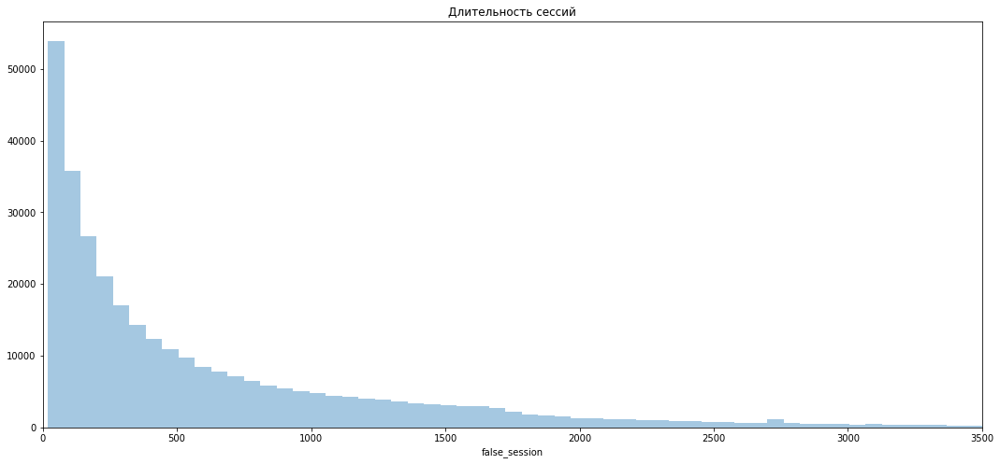

In [36]:
plt.figure(figsize=(18,8))
plt.title('Длительность сессий')
sns.distplot(visits['false_session'], kde=False, bins=700)
plt.xlim(0, 3500);

Распределение не похоже на нормальное, рассчитаем моду (значение в выборке, которое встречается чаще всего)

In [37]:
visits_duration_mode = visits['false_session'].mode()

In [38]:
sticky_factor_week = dau_total/wau_total
sticky_factor_month = dau_total/mau_total

In [39]:
visits

,device,session_end,source_id,session_start,uid,false_session,session_year,session_month,session_week,session_date
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,1080,2017,12,51,2017-12-20
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,1680,2018,2,8,2018-02-19
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,1440,2018,5,20,2018-05-20
5,desktop,2017-09-03 21:36:00,5,2017-09-03 21:35:00,16007536194108375387,60,2017,9,35,2017-09-03
6,desktop,2018-01-30 12:09:00,1,2018-01-30 11:13:00,6661610529277171451,3360,2018,1,5,2018-01-30
...,...,...,...,...,...,...,...,...,...,...
359395,desktop,2017-07-29 19:07:19,2,2017-07-29 19:07:00,18363291481961487539,19,2017,7,30,2017-07-29
359396,touch,2018-01-25 17:38:19,1,2018-01-25 17:38:00,18370831553019119586,19,2018,1,4,2018-01-25
359397,desktop,2018-03-03 10:12:19,4,2018-03-03 10:12:00,18387297585500748294,19,2018,3,9,2018-03-03
359398,desktop,2017-11-02 10:12:19,5,2017-11-02 10:12:00,18388616944624776485,19,2017,11,44,2017-11-02


In [40]:
visits_duration_mode

0    60
dtype: int64

Как часто люди возвращаются?

### 3.1.4 Считаем как часто люди возвращаются

Смотрим абсолютный показатель по месяцам. Как изменяется количество пользователей внутри одной когорты, так мы увидим сколько людей продолжают пользоваться приложением в следующем месяце из когорты

In [41]:
visits.head(5)

,device,session_end,source_id,session_start,uid,false_session,session_year,session_month,session_week,session_date
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,1080,2017,12,51,2017-12-20
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,1680,2018,2,8,2018-02-19
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,1440,2018,5,20,2018-05-20
5,desktop,2017-09-03 21:36:00,5,2017-09-03 21:35:00,16007536194108375387,60,2017,9,35,2017-09-03
6,desktop,2018-01-30 12:09:00,1,2018-01-30 11:13:00,6661610529277171451,3360,2018,1,5,2018-01-30


In [42]:
visits_absolute = visits.copy() #создадим копию таблицы

Формируем когорты по месяцам и неделям, создаем столбец с датой первой сессии для каждого пользователя, от значения которого будем формировать когорты

In [43]:
first_order_date_by_customers = visits_absolute.groupby('uid')['session_date'].min() #Выделяем клиентов по первой дате их появления, использования приложения.
first_order_date_by_customers.name = 'first_session_date'
first_order_date_by_customers

uid
11863502262781          2018-03-01
49537067089222          2018-02-06
297729379853735         2017-06-07
313578113262317         2017-09-18
325320750514679         2017-09-30
                           ...    
18446316582013423015    2018-02-26
18446403737806311543    2017-11-30
18446556406699109058    2018-01-01
18446621818809592527    2017-12-27
18446676030785672386    2017-10-04
Name: first_session_date, Length: 207051, dtype: object

In [44]:
visits_absolute = visits_absolute.join(first_order_date_by_customers,on='uid')

In [45]:
visits_absolute['first_session_month'] = visits_absolute['first_session_date'].astype('datetime64[M]')
visits_absolute['session_month'] = visits_absolute['session_date'].astype('datetime64[M]')
visits_absolute['first_session_week'] = visits_absolute['first_session_date'].astype('datetime64[W]')
visits_absolute['session_week'] = visits_absolute['session_date'].astype('datetime64[W]')
visits_absolute

,device,session_end,source_id,session_start,uid,false_session,session_year,session_month,session_week,session_date,first_session_date,first_session_month,first_session_week
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,1080,2017,2017-12-01,2017-12-14,2017-12-20,2017-12-20,2017-12-01,2017-12-14
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,1680,2018,2018-02-01,2018-02-15,2018-02-19,2018-02-19,2018-02-01,2018-02-15
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,1440,2018,2018-05-01,2018-05-17,2018-05-20,2018-03-09,2018-03-01,2018-03-08
5,desktop,2017-09-03 21:36:00,5,2017-09-03 21:35:00,16007536194108375387,60,2017,2017-09-01,2017-08-31,2017-09-03,2017-09-03,2017-09-01,2017-08-31
6,desktop,2018-01-30 12:09:00,1,2018-01-30 11:13:00,6661610529277171451,3360,2018,2018-01-01,2018-01-25,2018-01-30,2017-06-29,2017-06-01,2017-06-29
...,...,...,...,...,...,...,...,...,...,...,...,...,...
359395,desktop,2017-07-29 19:07:19,2,2017-07-29 19:07:00,18363291481961487539,19,2017,2017-07-01,2017-07-27,2017-07-29,2017-07-29,2017-07-01,2017-07-27
359396,touch,2018-01-25 17:38:19,1,2018-01-25 17:38:00,18370831553019119586,19,2018,2018-01-01,2018-01-25,2018-01-25,2018-01-25,2018-01-01,2018-01-25
359397,desktop,2018-03-03 10:12:19,4,2018-03-03 10:12:00,18387297585500748294,19,2018,2018-03-01,2018-03-01,2018-03-03,2018-03-03,2018-03-01,2018-03-01
359398,desktop,2017-11-02 10:12:19,5,2017-11-02 10:12:00,18388616944624776485,19,2017,2017-11-01,2017-11-02,2017-11-02,2017-11-02,2017-11-01,2017-11-02


In [46]:
visits_absolute['session_month'] = visits_absolute['session_month'].dt.strftime('%Y-%m')
visits_absolute['first_session_month'] = visits_absolute['first_session_month'].dt.strftime('%Y-%m')
# visits_absolute['session_week'] = visits_absolute['session_week'].dt.strftime('%Y-%m-%w')
# visits_absolute['first_session_week'] = visits_absolute['first_session_week'].dt.strftime('%Y-%m-%w')
visits_absolute.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 323604 entries, 0 to 359399
Data columns (total 13 columns):
device                 323604 non-null object
session_end            323604 non-null datetime64[ns]
source_id              323604 non-null int64
session_start          323604 non-null datetime64[ns]
uid                    323604 non-null uint64
false_session          323604 non-null int64
session_year           323604 non-null int64
session_month          323604 non-null object
session_week           323604 non-null datetime64[ns]
session_date           323604 non-null object
first_session_date     323604 non-null object
first_session_month    323604 non-null object
first_session_week     323604 non-null datetime64[ns]
dtypes: datetime64[ns](4), int64(3), object(5), uint64(1)
memory usage: 34.6+ MB


In [47]:
visits_group_by_month = visits_absolute.groupby(['first_session_month','session_month']).agg({'uid':'nunique'}) 
visits_group_by_month

uid
first_session_month session_month       
2017-06             2017-06        11885
                    2017-07          900
                    2017-08          606
                    2017-09          710
                    2017-10          777
...                                  ...
2018-03             2018-04          766
                    2018-05          480
2018-04             2018-04        14215
                    2018-05          675
2018-05             2018-05        13828

[78 rows x 1 columns]

In [48]:
visits_group_by_week = visits_absolute.groupby(['first_session_week','session_week']).agg({'uid':'nunique'})
visits_group_by_week

uid
first_session_week session_week      
2017-06-01         2017-06-01    3665
                   2017-06-08     247
                   2017-06-15     143
                   2017-06-22     115
                   2017-06-29     128
...                               ...
2018-05-17         2018-05-24     118
                   2018-05-31      25
2018-05-24         2018-05-24    3483
                   2018-05-31     113
2018-05-31         2018-05-31    1317

[1430 rows x 1 columns]

Выводим показания повторного использования приложения клиентами одной когорты по месяцам в виде таблицы:

In [49]:
new_customer_by_month = visits_absolute.pivot_table(index='first_session_month',
    columns='session_month',
    values='uid',
    aggfunc='nunique')
new_customer_by_month

session_month,2017-06,2017-07,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,2018-03,2018-04,2018-05
first_session_month,,,,,,,,,,,,
2017-06,11885.0,900.0,606.0,710.0,777.0,802.0,686.0,667.0,606.0,591.0,453.0,522.0
2017-07,NaN,11825.0,645.0,596.0,658.0,670.0,550.0,521.0,521.0,448.0,323.0,320.0
2017-08,NaN,NaN,9214.0,686.0,557.0,557.0,442.0,382.0,334.0,347.0,250.0,228.0
2017-09,NaN,NaN,NaN,15125.0,1264.0,1025.0,746.0,576.0,559.0,535.0,346.0,344.0
2017-10,NaN,NaN,NaN,NaN,23538.0,1839.0,1196.0,890.0,792.0,734.0,489.0,466.0
2017-11,NaN,NaN,NaN,NaN,NaN,24852.0,1943.0,1062.0,940.0,810.0,540.0,512.0
2017-12,NaN,NaN,NaN,NaN,NaN,NaN,23030.0,1259.0,841.0,695.0,448.0,408.0
2018-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,20573.0,1189.0,778.0,501.0,396.0
2018-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,20173.0,1141.0,490.0,387.0


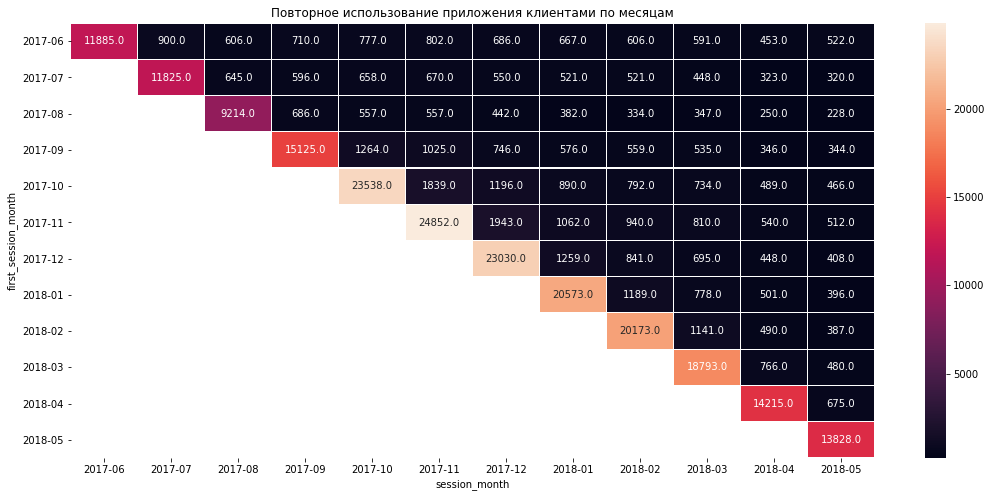

In [50]:
plt.figure(figsize=(18,8))
plt.title('Повторное использование приложения клиентами по месяцам')
sns.heatmap(new_customer_by_month , annot=True, fmt='.1f', linewidths=0.1, linecolor='white');

Выводим показания повторного использования приложения клиентами одной когорты по неделям в виде таблицы:

In [51]:
new_customer_by_week = visits_absolute.pivot_table(index='first_session_week',
    columns='session_week',
    values='uid',
    aggfunc='nunique')
new_customer_by_week

session_week,2017-06-01,2017-06-08,2017-06-15,2017-06-22,2017-06-29,2017-07-06,2017-07-13,2017-07-20,2017-07-27,2017-08-03,...,2018-03-29,2018-04-05,2018-04-12,2018-04-19,2018-04-26,2018-05-03,2018-05-10,2018-05-17,2018-05-24,2018-05-31
first_session_week,,,,,,,,,,,,,,,,,,,,,
2017-06-01,3665.0,247.0,143.0,115.0,128.0,113.0,131.0,83.0,87.0,67.0,...,65.0,74.0,81.0,80.0,63.0,78.0,82.0,90.0,89.0,28.0
2017-06-08,NaN,2716.0,110.0,70.0,53.0,59.0,63.0,49.0,47.0,42.0,...,32.0,33.0,36.0,37.0,29.0,29.0,31.0,57.0,40.0,11.0
2017-06-15,NaN,NaN,2277.0,79.0,53.0,49.0,57.0,33.0,30.0,27.0,...,20.0,26.0,27.0,22.0,21.0,20.0,23.0,19.0,23.0,8.0
2017-06-22,NaN,NaN,NaN,2492.0,69.0,62.0,61.0,44.0,34.0,30.0,...,17.0,20.0,18.0,20.0,14.0,15.0,19.0,29.0,26.0,6.0
2017-06-29,NaN,NaN,NaN,NaN,2424.0,106.0,58.0,31.0,38.0,26.0,...,14.0,22.0,18.0,26.0,14.0,16.0,15.0,13.0,24.0,7.0
2017-07-06,NaN,NaN,NaN,NaN,NaN,2786.0,143.0,59.0,56.0,38.0,...,24.0,25.0,30.0,30.0,19.0,20.0,23.0,23.0,37.0,10.0
2017-07-13,NaN,NaN,NaN,NaN,NaN,NaN,3803.0,129.0,71.0,60.0,...,22.0,29.0,36.0,33.0,21.0,19.0,24.0,33.0,34.0,10.0
2017-07-20,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2254.0,63.0,34.0,...,10.0,13.0,24.0,13.0,18.0,7.0,20.0,13.0,17.0,4.0
2017-07-27,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1813.0,76.0,...,8.0,15.0,11.0,16.0,16.0,16.0,18.0,13.0,10.0,4.0


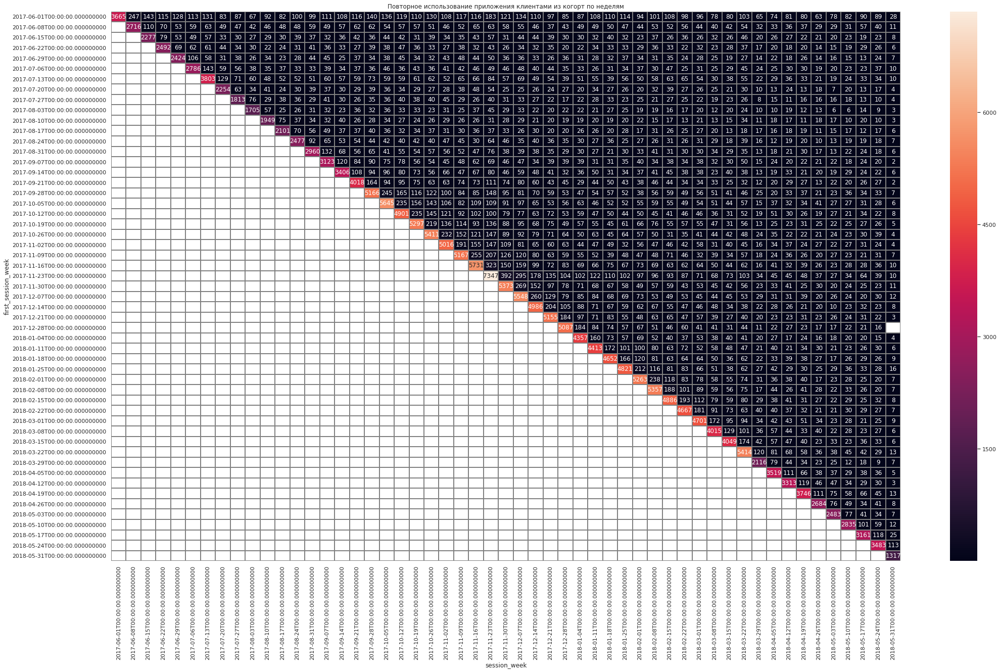

In [52]:
sns.set(style='white')
plt.figure(figsize=(35, 20))
plt.title('Повторное использование приложения клиентами из когорт по неделям')
sns.heatmap(new_customer_by_week, annot=True, fmt='.0f', linewidths=1, linecolor='gray');

Аналогично можно вывести сколько "платежных клиентов" совершают операции в последующих месяцах (постоянные пользователи), но уже по таблице orders

In [53]:
orders_absolute = orders.copy()

In [54]:
first_order_date_by_customers = orders_absolute.groupby('uid')['activity_date'].min()
first_order_date_by_customers.name = 'first_order_date'
orders_absolute = orders_absolute.join(first_order_date_by_customers,on='uid')
orders_absolute['first_order_month'] = orders_absolute['first_order_date'].astype('datetime64[M]')
orders_absolute['order_month'] = orders_absolute['activity_date'].astype('datetime64[M]')
orders_absolute.pivot_table(index='first_order_month',
    columns='order_month',
    values='uid',
    aggfunc='nunique')

order_month,2017-06-01,2017-07-01,2017-08-01,2017-09-01,2017-10-01,2017-11-01,2017-12-01,2018-01-01,2018-02-01,2018-03-01,2018-04-01,2018-05-01,2018-06-01
first_order_month,,,,,,,,,,,,,
2017-06-01,2023.0,61.0,50.0,54.0,88.0,67.0,62.0,47.0,58.0,45.0,45.0,53.0,NaN
2017-07-01,NaN,1923.0,52.0,57.0,64.0,49.0,38.0,36.0,39.0,42.0,22.0,26.0,NaN
2017-08-01,NaN,NaN,1370.0,58.0,53.0,44.0,40.0,32.0,30.0,44.0,19.0,31.0,NaN
2017-09-01,NaN,NaN,NaN,2581.0,130.0,100.0,74.0,52.0,64.0,66.0,37.0,43.0,NaN
2017-10-01,NaN,NaN,NaN,NaN,4340.0,206.0,123.0,92.0,93.0,72.0,56.0,67.0,NaN
2017-11-01,NaN,NaN,NaN,NaN,NaN,4081.0,222.0,120.0,106.0,81.0,48.0,62.0,NaN
2017-12-01,NaN,NaN,NaN,NaN,NaN,NaN,4383.0,146.0,103.0,97.0,50.0,63.0,NaN
2018-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3373.0,114.0,83.0,43.0,45.0,NaN
2018-02-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3651.0,118.0,58.0,39.0,NaN


Рассчитаем Retention rate, чтобы понять коэффициент узнать % вернувшихся (повторно авторизовавшихся) по когортам (неделя):

In [55]:
visits['session_date'] = pd.to_datetime(visits['session_date'])
first_activity_date = visits.groupby(['uid'])['session_date'].min()
first_activity_date.name = 'first_activity_date'
visits = visits.join(first_activity_date,on='uid')
visits['activity_week'] = pd.to_datetime(visits['session_date'], unit='d') - pd.to_timedelta(visits['session_date'].dt.dayofweek, unit='d')
visits['first_activity_week'] = pd.to_datetime(visits['first_activity_date'], unit='d') - pd.to_timedelta(visits['first_activity_date'].dt.dayofweek, unit='d')

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [56]:
visits['cohort_lifetime'] = visits['activity_week'] - visits['first_activity_week']
visits['cohort_lifetime'] = visits['cohort_lifetime'] / np.timedelta64(1,'W')
visits['cohort_lifetime'] = visits['cohort_lifetime'].astype(int)

In [57]:
cohorts = visits.groupby(['first_activity_week','cohort_lifetime']).agg({'uid':'nunique'}).reset_index()
initial_users_count = cohorts[cohorts['cohort_lifetime'] == 0][['first_activity_week','uid']]
initial_users_count = initial_users_count.rename(columns={'uid':'cohort_users'})
cohorts = cohorts.merge(initial_users_count,on='first_activity_week')
cohorts['retention'] = cohorts['uid']/cohorts['cohort_users']
retention_pivot = cohorts.pivot_table(index='first_activity_week',columns='cohort_lifetime',values='retention',aggfunc='sum')
retention_pivot

cohort_lifetime,0,1,2,3,4,5,6,7,8,9,...,43,44,45,46,47,48,49,50,51,52
first_activity_week,,,,,,,,,,,,,,,,,,,,,
2017-05-29,1.0,0.091410,0.049009,0.034141,0.044053,0.039648,0.037445,0.035242,0.029185,0.023678,...,0.028084,0.019824,0.027533,0.028634,0.029736,0.022026,0.023128,0.028634,0.031388,0.022577
2017-06-05,1.0,0.036503,0.026599,0.022637,0.022071,0.022071,0.021505,0.017544,0.014148,0.016412,...,0.015280,0.013582,0.015846,0.013016,0.011885,0.012733,0.019525,0.017261,0.012733,NaN
2017-06-12,1.0,0.038763,0.026568,0.021341,0.022648,0.017857,0.015679,0.016115,0.012195,0.018728,...,0.013066,0.011324,0.011324,0.010017,0.010889,0.009146,0.013066,0.007404,NaN,NaN
2017-06-19,1.0,0.033190,0.026293,0.023276,0.023276,0.013793,0.012931,0.007328,0.010345,0.012931,...,0.012069,0.008190,0.009483,0.007328,0.008621,0.009914,0.007328,NaN,NaN,NaN
2017-06-26,1.0,0.038272,0.025926,0.018930,0.014403,0.010700,0.011111,0.009465,0.012757,0.013992,...,0.007407,0.004938,0.005761,0.008642,0.010288,0.010288,NaN,NaN,NaN,NaN
2017-07-03,1.0,0.043914,0.030046,0.021572,0.014253,0.013867,0.013097,0.010015,0.012712,0.014638,...,0.003082,0.005393,0.006549,0.005008,0.008860,NaN,NaN,NaN,NaN,NaN
2017-07-10,1.0,0.038294,0.017406,0.013345,0.010734,0.011894,0.011894,0.011314,0.014215,0.012765,...,0.006092,0.008413,0.009574,0.008993,NaN,NaN,NaN,NaN,NaN,NaN
2017-07-17,1.0,0.031135,0.022096,0.014730,0.016404,0.013391,0.014061,0.016070,0.014730,0.015065,...,0.009374,0.006696,0.006361,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-07-24,1.0,0.023870,0.017268,0.019807,0.014220,0.017268,0.019807,0.015236,0.015236,0.012189,...,0.004571,0.005587,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


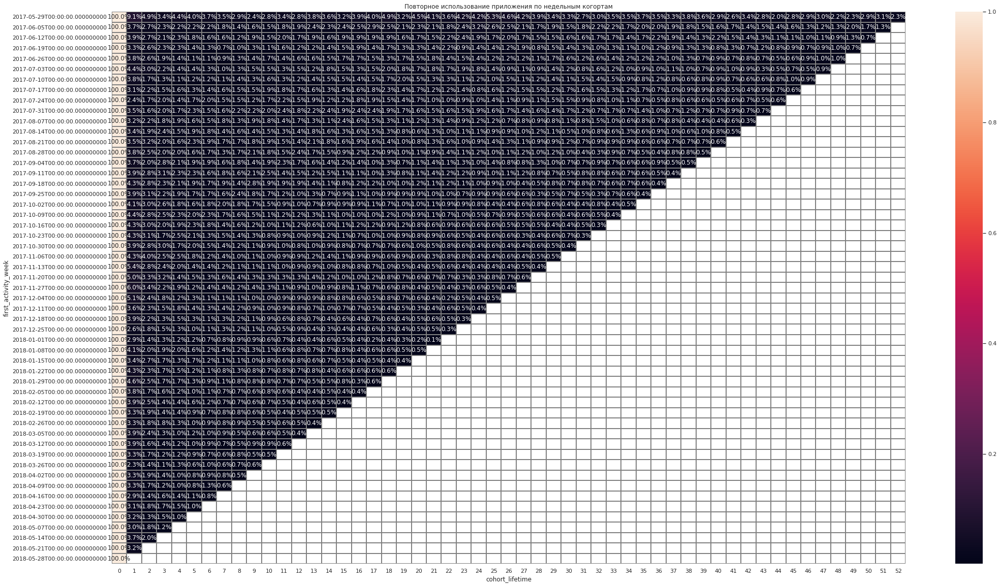

In [58]:
sns.set(style='white')
plt.figure(figsize=(35, 20))
plt.title('Повторное использование приложения по недельным когортам')
sns.heatmap(retention_pivot, annot=True, fmt='.1%', linewidths=1, linecolor='gray');

In [59]:
cohorts['retention'].describe()

count    1431.000000
mean        0.050297
std         0.186522
min         0.001246
25%         0.007842
50%         0.012195
75%         0.017523
max         1.000000
Name: retention, dtype: float64

## Выводы по блоку 3:

In [60]:
print('Среднее дневное посещение ресурса:', int(dau_total))
print('Среднее недельное посещение ресурса:', int(wau_total))
print('Среднее месячное посещение ресурса:', int(mau_total))
print('Процент повторных использований приложения в неделю:', sticky_factor_week.mul(100).astype(int).astype(str).add('%'))
print('Процент повторных использований приложения в месяц:', sticky_factor_month.mul(100).astype(int).astype(str).add('%'))
print('Среднее время одной сессии в секундах:', visits_duration_mode)

Среднее дневное посещение ресурса: 817
Среднее недельное посещение ресурса: 5148
Среднее месячное посещение ресурса: 20955
Процент повторных использований приложения в неделю: uid    15%
dtype: object
Процент повторных использований приложения в месяц: uid    3%
dtype: object
Среднее время одной сессии в секундах: 0    60
dtype: int64


По динамике использования приложения с течением времени: В среднем процент клиентов повторно использующих приложение в неделю в среднем за все время в районе 5%. Динамика имеет сезонность, есть пики когда количество сессий растет под киноновинки, это в летний период (июль) и (октябрь - декабрь). В целом судя по недельной динамике интерес к приложению падает на вторую неделю использования на треть, за календарный год количество постоянных пользователей снижается и остается примерно 0.5-1% от первоначального количества людей в когорте ежемесячно.

## 3.2 Продажи

    3.2.1 Когда люди начинают покупать?
    3.2.2 Сколько раз покупают за период?
    3.2.3 Какой средний чек?
    3.2.4 Сколько денег приносят? (LTV)

In [61]:
first_order_date = orders.groupby('uid')['activity_date'].min() 
first_order_date

uid
313578113262317        2018-01-03 21:51:00
1575281904278712       2017-06-03 10:13:00
2429014661409475       2017-10-11 18:33:00
2464366381792757       2018-01-28 15:54:00
2551852515556206       2017-11-24 10:14:00
                               ...        
18445147675727495770   2017-11-24 09:03:00
18445407535914413204   2017-09-22 23:55:00
18445601152732270159   2018-03-26 22:54:00
18446156210226471712   2018-02-18 19:34:00
18446167067214817906   2017-10-17 10:16:00
Name: activity_date, Length: 36523, dtype: datetime64[ns]

In [62]:
first_order_date.name = 'first_order_day'

Добавим получившиеся данные в основную таблицу orders:

In [63]:
new_orders = orders.join(first_order_date,on='uid')
new_orders

,activity_date,revenue,uid,first_order_day
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-06-01 00:10:00
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-06-01 00:25:00
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-06-01 00:27:00
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-06-01 00:29:00
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-06-01 07:58:00
...,...,...,...,...
50410,2018-05-31 23:50:00,4.64,12296626599487328624,2018-05-31 23:50:00
50411,2018-05-31 23:50:00,5.80,11369640365507475976,2018-05-31 23:50:00
50412,2018-05-31 23:54:00,0.30,1786462140797698849,2018-05-31 23:54:00
50413,2018-05-31 23:56:00,3.67,3993697860786194247,2018-05-31 23:56:00


Данные о первом заказе могут нам понадобятся и в таблице new_visits:

In [64]:
new_visits = visits.join(first_order_date,on='uid')

In [65]:
visits_orders = new_visits[~new_visits['first_order_day'].isna()].reset_index(drop=True)
visits_orders

,device,session_end,source_id,session_start,uid,false_session,session_year,session_month,session_week,session_date,first_activity_date,activity_week,first_activity_week,cohort_lifetime,first_order_day
0,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,1440,2018,5,20,2018-05-20,2018-03-09,2018-05-14,2018-03-05,10,2018-03-09 20:25:00
1,desktop,2017-09-03 21:36:00,5,2017-09-03 21:35:00,16007536194108375387,60,2017,9,35,2017-09-03,2017-09-03,2017-08-28,2017-08-28,0,2017-09-04 12:46:00
2,desktop,2018-02-06 15:50:00,4,2018-02-06 15:45:00,8056418121947262981,300,2018,2,6,2018-02-06,2017-06-04,2018-02-05,2017-05-29,36,2017-06-25 08:54:00
3,touch,2018-02-12 20:30:00,2,2018-02-12 19:24:00,18188358787673499603,3960,2018,2,7,2018-02-12,2018-02-12,2018-02-12,2018-02-12,0,2018-02-12 19:48:00
4,desktop,2017-12-05 10:28:00,4,2017-12-05 10:21:00,2307401184189569202,420,2017,12,49,2017-12-05,2017-09-23,2017-12-04,2017-09-18,11,2017-09-27 09:23:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91736,desktop,2017-07-29 19:07:19,2,2017-07-29 19:07:00,18363291481961487539,19,2017,7,30,2017-07-29,2017-07-29,2017-07-24,2017-07-24,0,2017-07-29 19:07:00
91737,touch,2018-01-25 17:38:19,1,2018-01-25 17:38:00,18370831553019119586,19,2018,1,4,2018-01-25,2018-01-25,2018-01-22,2018-01-22,0,2018-01-25 17:38:00
91738,desktop,2018-03-03 10:12:19,4,2018-03-03 10:12:00,18387297585500748294,19,2018,3,9,2018-03-03,2018-03-03,2018-02-26,2018-02-26,0,2018-03-03 10:12:00
91739,desktop,2017-11-02 10:12:19,5,2017-11-02 10:12:00,18388616944624776485,19,2017,11,44,2017-11-02,2017-11-02,2017-10-30,2017-10-30,0,2017-11-02 10:12:00


Создадим столбец с количеством дней прошедших с первого посещения до покупки:

In [66]:
visits_orders['days_before_order'] = pd.to_datetime(visits_orders['first_order_day']
                                                    ,unit='d') - pd.to_datetime(visits_orders['first_activity_date']
                                                                                , unit='d')
visits_orders

,device,session_end,source_id,session_start,uid,false_session,session_year,session_month,session_week,session_date,first_activity_date,activity_week,first_activity_week,cohort_lifetime,first_order_day,days_before_order
0,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,1440,2018,5,20,2018-05-20,2018-03-09,2018-05-14,2018-03-05,10,2018-03-09 20:25:00,0 days 20:25:00
1,desktop,2017-09-03 21:36:00,5,2017-09-03 21:35:00,16007536194108375387,60,2017,9,35,2017-09-03,2017-09-03,2017-08-28,2017-08-28,0,2017-09-04 12:46:00,1 days 12:46:00
2,desktop,2018-02-06 15:50:00,4,2018-02-06 15:45:00,8056418121947262981,300,2018,2,6,2018-02-06,2017-06-04,2018-02-05,2017-05-29,36,2017-06-25 08:54:00,21 days 08:54:00
3,touch,2018-02-12 20:30:00,2,2018-02-12 19:24:00,18188358787673499603,3960,2018,2,7,2018-02-12,2018-02-12,2018-02-12,2018-02-12,0,2018-02-12 19:48:00,0 days 19:48:00
4,desktop,2017-12-05 10:28:00,4,2017-12-05 10:21:00,2307401184189569202,420,2017,12,49,2017-12-05,2017-09-23,2017-12-04,2017-09-18,11,2017-09-27 09:23:00,4 days 09:23:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91736,desktop,2017-07-29 19:07:19,2,2017-07-29 19:07:00,18363291481961487539,19,2017,7,30,2017-07-29,2017-07-29,2017-07-24,2017-07-24,0,2017-07-29 19:07:00,0 days 19:07:00
91737,touch,2018-01-25 17:38:19,1,2018-01-25 17:38:00,18370831553019119586,19,2018,1,4,2018-01-25,2018-01-25,2018-01-22,2018-01-22,0,2018-01-25 17:38:00,0 days 17:38:00
91738,desktop,2018-03-03 10:12:19,4,2018-03-03 10:12:00,18387297585500748294,19,2018,3,9,2018-03-03,2018-03-03,2018-02-26,2018-02-26,0,2018-03-03 10:12:00,0 days 10:12:00
91739,desktop,2017-11-02 10:12:19,5,2017-11-02 10:12:00,18388616944624776485,19,2017,11,44,2017-11-02,2017-11-02,2017-10-30,2017-10-30,0,2017-11-02 10:12:00,0 days 10:12:00


In [67]:
visits_orders['days_before_order'] = visits_orders['days_before_order'] / np.timedelta64(1,'D')
visits_orders['days_before_order'] = (round(visits_orders['days_before_order'])).astype('int64')
visits_orders = visits_orders[visits_orders['days_before_order']>=0]
visits_orders

,device,session_end,source_id,session_start,uid,false_session,session_year,session_month,session_week,session_date,first_activity_date,activity_week,first_activity_week,cohort_lifetime,first_order_day,days_before_order
0,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,1440,2018,5,20,2018-05-20,2018-03-09,2018-05-14,2018-03-05,10,2018-03-09 20:25:00,1
1,desktop,2017-09-03 21:36:00,5,2017-09-03 21:35:00,16007536194108375387,60,2017,9,35,2017-09-03,2017-09-03,2017-08-28,2017-08-28,0,2017-09-04 12:46:00,2
2,desktop,2018-02-06 15:50:00,4,2018-02-06 15:45:00,8056418121947262981,300,2018,2,6,2018-02-06,2017-06-04,2018-02-05,2017-05-29,36,2017-06-25 08:54:00,21
3,touch,2018-02-12 20:30:00,2,2018-02-12 19:24:00,18188358787673499603,3960,2018,2,7,2018-02-12,2018-02-12,2018-02-12,2018-02-12,0,2018-02-12 19:48:00,1
4,desktop,2017-12-05 10:28:00,4,2017-12-05 10:21:00,2307401184189569202,420,2017,12,49,2017-12-05,2017-09-23,2017-12-04,2017-09-18,11,2017-09-27 09:23:00,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91736,desktop,2017-07-29 19:07:19,2,2017-07-29 19:07:00,18363291481961487539,19,2017,7,30,2017-07-29,2017-07-29,2017-07-24,2017-07-24,0,2017-07-29 19:07:00,1
91737,touch,2018-01-25 17:38:19,1,2018-01-25 17:38:00,18370831553019119586,19,2018,1,4,2018-01-25,2018-01-25,2018-01-22,2018-01-22,0,2018-01-25 17:38:00,1
91738,desktop,2018-03-03 10:12:19,4,2018-03-03 10:12:00,18387297585500748294,19,2018,3,9,2018-03-03,2018-03-03,2018-02-26,2018-02-26,0,2018-03-03 10:12:00,0
91739,desktop,2017-11-02 10:12:19,5,2017-11-02 10:12:00,18388616944624776485,19,2017,11,44,2017-11-02,2017-11-02,2017-10-30,2017-10-30,0,2017-11-02 10:12:00,0


Посмотрим на распредление данных:

In [68]:
visits_orders['days_before_order'].describe()

count    91118.000000
mean        32.679383
std         61.817164
min          0.000000
25%          1.000000
50%          2.000000
75%         33.000000
max        364.000000
Name: days_before_order, dtype: float64

In [69]:
fig3 = px.box(visits_orders, x='days_before_order', orientation='h', width=1000, height=320)
fig3.show()

Можно видеть, что есть большое количество выбросов. Выбросами можно считать покупки совершенные после 83 дней.

**Количество дней до совершения покупки - без выбросов:**

In [70]:
fig4 = px.box(visits_orders, x='days_before_order', orientation='h', width=1000, height=320)
fig4.update_xaxes(range=[0, 85])
fig4.show()

Теперь хорошо видно, что основная масса покупок совершается в промежутке от 0 до 33 дней. Но стоит посмотреть на какой день чаще всего покупали:

In [71]:
visits_orders['days_before_order'].mode()

0    1
dtype: int64

Чаще всего покупали в день первого визита.

3.2.1 Для данного блока используем таблицу orders. Под данным вопросом подразумеваю необходимость обозначить период с наивысшей покупательской активностью для бизнеса, для возможности увеличения прибыли путем дополнительной мотивации (сделать упор на скидках, уменьшить цену билетов - компенсировав это количеством и пр.)

Выделим только те визиты при которых были совершены покупки:

In [72]:
visits

,device,session_end,source_id,session_start,uid,false_session,session_year,session_month,session_week,session_date,first_activity_date,activity_week,first_activity_week,cohort_lifetime
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,1080,2017,12,51,2017-12-20,2017-12-20,2017-12-18,2017-12-18,0
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,1680,2018,2,8,2018-02-19,2018-02-19,2018-02-19,2018-02-19,0
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,1440,2018,5,20,2018-05-20,2018-03-09,2018-05-14,2018-03-05,10
5,desktop,2017-09-03 21:36:00,5,2017-09-03 21:35:00,16007536194108375387,60,2017,9,35,2017-09-03,2017-09-03,2017-08-28,2017-08-28,0
6,desktop,2018-01-30 12:09:00,1,2018-01-30 11:13:00,6661610529277171451,3360,2018,1,5,2018-01-30,2017-06-29,2018-01-29,2017-06-26,31
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
359395,desktop,2017-07-29 19:07:19,2,2017-07-29 19:07:00,18363291481961487539,19,2017,7,30,2017-07-29,2017-07-29,2017-07-24,2017-07-24,0
359396,touch,2018-01-25 17:38:19,1,2018-01-25 17:38:00,18370831553019119586,19,2018,1,4,2018-01-25,2018-01-25,2018-01-22,2018-01-22,0
359397,desktop,2018-03-03 10:12:19,4,2018-03-03 10:12:00,18387297585500748294,19,2018,3,9,2018-03-03,2018-03-03,2018-02-26,2018-02-26,0
359398,desktop,2017-11-02 10:12:19,5,2017-11-02 10:12:00,18388616944624776485,19,2017,11,44,2017-11-02,2017-11-02,2017-10-30,2017-10-30,0


In [73]:
first_order_date_uid = orders.groupby('uid')['activity_date'].min()
first_order_date_uid

uid
313578113262317        2018-01-03 21:51:00
1575281904278712       2017-06-03 10:13:00
2429014661409475       2017-10-11 18:33:00
2464366381792757       2018-01-28 15:54:00
2551852515556206       2017-11-24 10:14:00
                               ...        
18445147675727495770   2017-11-24 09:03:00
18445407535914413204   2017-09-22 23:55:00
18445601152732270159   2018-03-26 22:54:00
18446156210226471712   2018-02-18 19:34:00
18446167067214817906   2017-10-17 10:16:00
Name: activity_date, Length: 36523, dtype: datetime64[ns]

In [74]:
first_order_date_uid.name = 'first_order_date' # меняем название для нового столбца, который приоединим к таблице

In [75]:
orders = orders.join(first_order_date_uid,on='uid') #Присоединяем таблицу по идентификатору
orders

,activity_date,revenue,uid,first_order_date
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-06-01 00:10:00
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-06-01 00:25:00
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-06-01 00:27:00
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-06-01 00:29:00
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-06-01 07:58:00
...,...,...,...,...
50410,2018-05-31 23:50:00,4.64,12296626599487328624,2018-05-31 23:50:00
50411,2018-05-31 23:50:00,5.80,11369640365507475976,2018-05-31 23:50:00
50412,2018-05-31 23:54:00,0.30,1786462140797698849,2018-05-31 23:54:00
50413,2018-05-31 23:56:00,3.67,3993697860786194247,2018-05-31 23:56:00


In [76]:
orders['purchase_month'] = orders['activity_date'].astype('datetime64[M]') #преобразовываем значения столбцов к типу месяц.
orders['first_purchase_month'] = orders['first_order_date'].astype('datetime64[M]')

In [77]:
orders.sort_values(by = 'uid', ascending = False)

,activity_date,revenue,uid,first_order_date,purchase_month,first_purchase_month
13176,2017-10-17 10:16:00,7.94,18446167067214817906,2017-10-17 10:16:00,2017-10-01,2017-10-01
35572,2018-02-18 19:34:00,9.78,18446156210226471712,2018-02-18 19:34:00,2018-02-01,2018-02-01
42213,2018-03-26 22:54:00,4.22,18445601152732270159,2018-03-26 22:54:00,2018-03-01,2018-03-01
9023,2017-09-25 15:56:00,0.12,18445407535914413204,2017-09-22 23:55:00,2017-09-01,2017-09-01
8919,2017-09-24 23:48:00,0.24,18445407535914413204,2017-09-22 23:55:00,2017-09-01,2017-09-01
...,...,...,...,...,...,...
31462,2018-01-28 15:54:00,2.44,2464366381792757,2018-01-28 15:54:00,2018-01-01,2018-01-01
12235,2017-10-11 18:33:00,73.33,2429014661409475,2017-10-11 18:33:00,2017-10-01,2017-10-01
213,2017-06-03 10:13:00,1.22,1575281904278712,2017-06-03 10:13:00,2017-06-01,2017-06-01
252,2017-06-03 17:39:00,1.83,1575281904278712,2017-06-03 10:13:00,2017-06-01,2017-06-01


In [78]:
cohort_stats = orders.groupby('first_purchase_month')['revenue'].sum() #Группируем таблицу, получив сумму дохода по месяцам
cohort_stats

first_purchase_month
2017-06-01    24031.69
2017-07-01    16127.92
2017-08-01    11606.26
2017-09-01    34676.32
2017-10-01    27603.45
2017-11-01    26098.99
2017-12-01    33485.74
2018-01-01    16663.13
2018-02-01    16750.50
2018-03-01    19273.41
2018-04-01    11810.61
2018-05-01    13925.76
2018-06-01        3.42
Name: revenue, dtype: float64

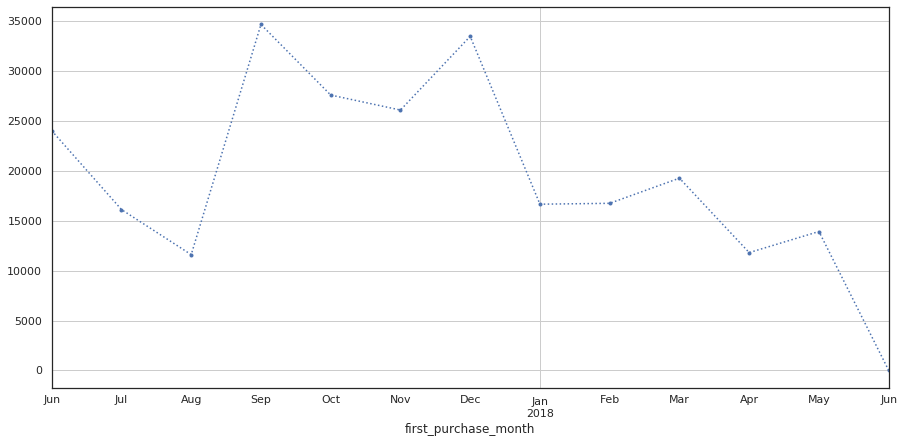

In [79]:
cohort_stats.plot(kind='line',x='first_purchase_month', figsize = (15,7), grid = True, linestyle = ":", marker = ".")

На основании данных делаем вывод о сезонности доходов. Пик использования (приносящего доход) приходится на лето - июнь, осень - сентябрь, зима - декабрь. Связано это в первую очередь с датами выхода киноновинок, а это летние блокбастеры, и стабильный рост во второй половине начиная с сентября вплодь до Нового года. Хуже всего показатели в апреле - мае.

### 3.2.2 Посмотрим сколько раз покупают за определенный период пользователи:

In [80]:
orders.sort_values(by = 'uid', ascending = False)

,activity_date,revenue,uid,first_order_date,purchase_month,first_purchase_month
13176,2017-10-17 10:16:00,7.94,18446167067214817906,2017-10-17 10:16:00,2017-10-01,2017-10-01
35572,2018-02-18 19:34:00,9.78,18446156210226471712,2018-02-18 19:34:00,2018-02-01,2018-02-01
42213,2018-03-26 22:54:00,4.22,18445601152732270159,2018-03-26 22:54:00,2018-03-01,2018-03-01
9023,2017-09-25 15:56:00,0.12,18445407535914413204,2017-09-22 23:55:00,2017-09-01,2017-09-01
8919,2017-09-24 23:48:00,0.24,18445407535914413204,2017-09-22 23:55:00,2017-09-01,2017-09-01
...,...,...,...,...,...,...
31462,2018-01-28 15:54:00,2.44,2464366381792757,2018-01-28 15:54:00,2018-01-01,2018-01-01
12235,2017-10-11 18:33:00,73.33,2429014661409475,2017-10-11 18:33:00,2017-10-01,2017-10-01
213,2017-06-03 10:13:00,1.22,1575281904278712,2017-06-03 10:13:00,2017-06-01,2017-06-01
252,2017-06-03 17:39:00,1.83,1575281904278712,2017-06-03 10:13:00,2017-06-01,2017-06-01


In [81]:
new_orders_grouped_by_cohorts = orders.groupby(['first_purchase_month'
                                            ,'purchase_month']).agg({'uid':['count','nunique']}).reset_index()
new_orders_grouped_by_cohorts

first_purchase_month purchase_month   uid        
                                       count nunique
0            2017-06-01     2017-06-01  2354    2023
1            2017-06-01     2017-07-01   177      61
2            2017-06-01     2017-08-01   174      50
3            2017-06-01     2017-09-01   226      54
4            2017-06-01     2017-10-01   292      88
..                  ...            ...   ...     ...
74           2018-03-01     2018-05-01   176      58
75           2018-04-01     2018-04-01  2495    2276
76           2018-04-01     2018-05-01   195      69
77           2018-05-01     2018-05-01  3249    2988
78           2018-06-01     2018-06-01     1       1

[79 rows x 4 columns]

In [82]:
new_orders_grouped_by_cohorts.columns = ['first_purchase_month', 'purchase_month','orders_number','u_uid']
new_orders_grouped_by_cohorts


,first_purchase_month,purchase_month,orders_number,u_uid
0,2017-06-01,2017-06-01,2354,2023
1,2017-06-01,2017-07-01,177,61
2,2017-06-01,2017-08-01,174,50
3,2017-06-01,2017-09-01,226,54
4,2017-06-01,2017-10-01,292,88
...,...,...,...,...
74,2018-03-01,2018-05-01,176,58
75,2018-04-01,2018-04-01,2495,2276
76,2018-04-01,2018-05-01,195,69
77,2018-05-01,2018-05-01,3249,2988


Найдем количество покупок на человека:

In [83]:
new_orders_grouped_by_cohorts['orders_per_person'] = new_orders_grouped_by_cohorts['orders_number'] / new_orders_grouped_by_cohorts['u_uid']

Пусть будут видны только год и месяц:

In [84]:
new_orders_grouped_by_cohorts['first_purchase_month'] = new_orders_grouped_by_cohorts['first_purchase_month'].dt.strftime('%Y-%m')

In [85]:
new_orders_grouped_by_cohorts['purchase_month'] = new_orders_grouped_by_cohorts['purchase_month'].dt.strftime('%Y-%m')

Сгруппируем данные с помощью пивота для того, чтобы показать количество покупок по когортам:

In [86]:
n_orders_pivot = new_orders_grouped_by_cohorts.pivot_table(index='first_purchase_month',columns='purchase_month',values='orders_per_person')

Покажем тепловую карту

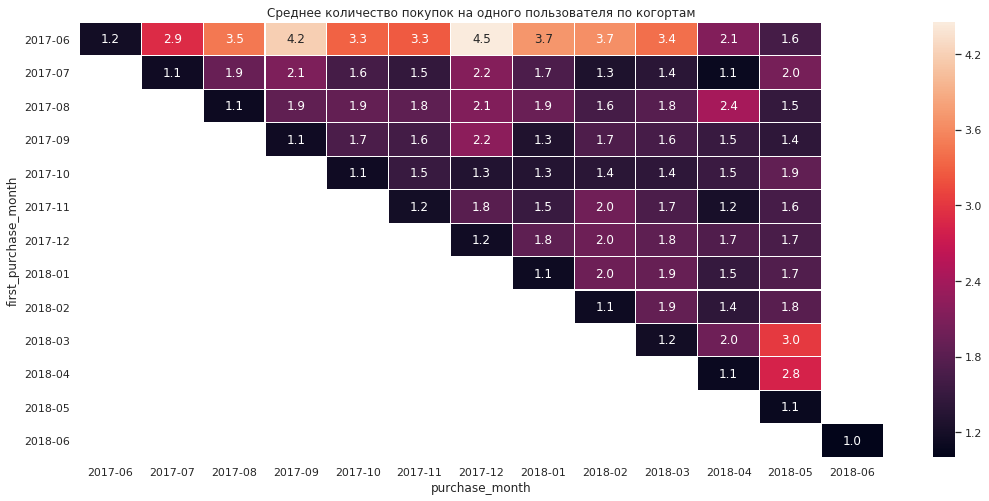

In [87]:
plt.figure(figsize=(18,8))
plt.title('Среднее количество покупок на одного пользователя по когортам')
sns.heatmap(n_orders_pivot , annot=True, fmt='.1f', linewidths=0.1, linecolor='white');

Видно, что во второй месяц количество покупок увеличивается. Это можно объяснить тем, что пользователи сначала тестируют сервис первой покупкой и если все проходит удачно, то пользуются им более активно. Также видно как июньская когорта сильно отличается активностью от остальных (показатели в ней в 2 два раза, кроме последнего месяца).

Можем посмотреть средние показатели когорт по количеству покупок в месяц:

In [88]:
n_orders_pivot.mean(axis=1)

first_purchase_month
2017-06    3.105604
2017-07    1.627655
2017-08    1.808223
2017-09    1.578587
2017-10    1.441281
2017-11    1.575461
2017-12    1.699190
2018-01    1.644767
2018-02    1.557218
2018-03    2.060413
2018-04    1.961154
2018-05    1.087349
2018-06    1.000000
dtype: float64

Видно, что есть наметившаяся тенденция на снижение количество покупок в месяц в новых когортах.

Помимо этого можно посмотреть на фактор сезонности усреднив количество покупок за каждый месяц:

In [89]:
n_orders_pivot.mean(axis=0)

purchase_month
2017-06    1.163618
2017-07    2.019202
2017-08    2.174018
2017-09    2.322225
2017-10    1.931674
2017-11    1.812945
2017-12    2.172674
2018-01    1.804519
2018-02    1.855448
2018-03    1.811097
2018-04    1.603372
2018-05    1.851434
2018-06    1.000000
dtype: float64

**Июль, август, сентябрь и декабрь** показывают **более 2** покупок на пользователя. В остальные месяцы показатели ниже.

In [90]:
mean_count_order = new_orders_grouped_by_cohorts['orders_number'].sum() / new_orders_grouped_by_cohorts['u_uid'].sum()
mean_count_order.round(1)

1.2

### 3.2.3 Посмотрим как изменялся средний чек по когортам в зависимости от времени, прошедшей с момента первой покупки.

Группируем по среднему чеку покупателя (уникальному) в каждый месяц; порядковому месяцу относительно месяца первой покупки.

In [91]:
orders_grouped_by_cohorts = orders.groupby(['first_purchase_month','purchase_month']).agg({'revenue':'sum','uid':'nunique'}).reset_index()
orders_grouped_by_cohorts

,first_purchase_month,purchase_month,revenue,uid
0,2017-06-01,2017-06-01,9557.49,2023
1,2017-06-01,2017-07-01,981.82,61
2,2017-06-01,2017-08-01,885.34,50
3,2017-06-01,2017-09-01,1931.30,54
4,2017-06-01,2017-10-01,2068.58,88
...,...,...,...,...
74,2018-03-01,2018-05-01,1114.87,58
75,2018-04-01,2018-04-01,10600.69,2276
76,2018-04-01,2018-05-01,1209.92,69
77,2018-05-01,2018-05-01,13925.76,2988


Находим средний чек покупателя.

In [92]:
orders_grouped_by_cohorts['revenue_per_user'] = orders_grouped_by_cohorts['revenue'] / orders_grouped_by_cohorts['uid']
orders_grouped_by_cohorts

,first_purchase_month,purchase_month,revenue,uid,revenue_per_user
0,2017-06-01,2017-06-01,9557.49,2023,4.724414
1,2017-06-01,2017-07-01,981.82,61,16.095410
2,2017-06-01,2017-08-01,885.34,50,17.706800
3,2017-06-01,2017-09-01,1931.30,54,35.764815
4,2017-06-01,2017-10-01,2068.58,88,23.506591
...,...,...,...,...,...
74,2018-03-01,2018-05-01,1114.87,58,19.221897
75,2018-04-01,2018-04-01,10600.69,2276,4.657597
76,2018-04-01,2018-05-01,1209.92,69,17.535072
77,2018-05-01,2018-05-01,13925.76,2988,4.660562


In [93]:
orders_grouped_by_cohorts['first_purchase_month'] = orders_grouped_by_cohorts['first_purchase_month'].dt.strftime('%Y-%m')

In [94]:
orders_grouped_by_cohorts['purchase_month'] = orders_grouped_by_cohorts['purchase_month'].dt.strftime('%Y-%m')

Создадим пивот для вывода средней прибыли с пользователя:

In [95]:
visual = orders_grouped_by_cohorts.pivot_table(index='first_purchase_month',
    columns='purchase_month',
    values='revenue_per_user',
    aggfunc='mean')
visual

purchase_month,2017-06,2017-07,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,2018-03,2018-04,2018-05,2018-06
first_purchase_month,,,,,,,,,,,,,
2017-06,4.724414,16.095410,17.706800,35.764815,23.506591,22.207761,31.011935,25.033191,19.295690,27.233556,25.681333,9.804151,NaN
2017-07,NaN,6.010218,12.396346,21.035965,10.786094,6.938163,7.896842,6.421111,6.992821,7.382143,12.861818,11.513846,NaN
2017-08,NaN,NaN,5.276518,11.148793,11.851321,12.182955,16.921250,12.139063,9.620333,12.610455,21.070000,8.307419,NaN
2017-09,NaN,NaN,NaN,5.644529,22.188385,13.445200,138.669189,19.881538,26.095000,27.437121,16.961351,11.044651,NaN
2017-10,NaN,NaN,NaN,NaN,5.003733,11.287427,6.753252,7.413152,7.072796,7.255139,6.573214,7.479701,NaN
2017-11,NaN,NaN,NaN,NaN,NaN,5.154683,7.339054,6.786583,12.510660,7.457284,4.580833,7.564839,NaN
2017-12,NaN,NaN,NaN,NaN,NaN,NaN,4.738191,7.816575,39.366019,48.135052,27.431400,23.518413,NaN
2018-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.135636,8.721228,12.365542,11.199767,4.699556,NaN
2018-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.156987,8.610000,4.942414,6.941026,NaN


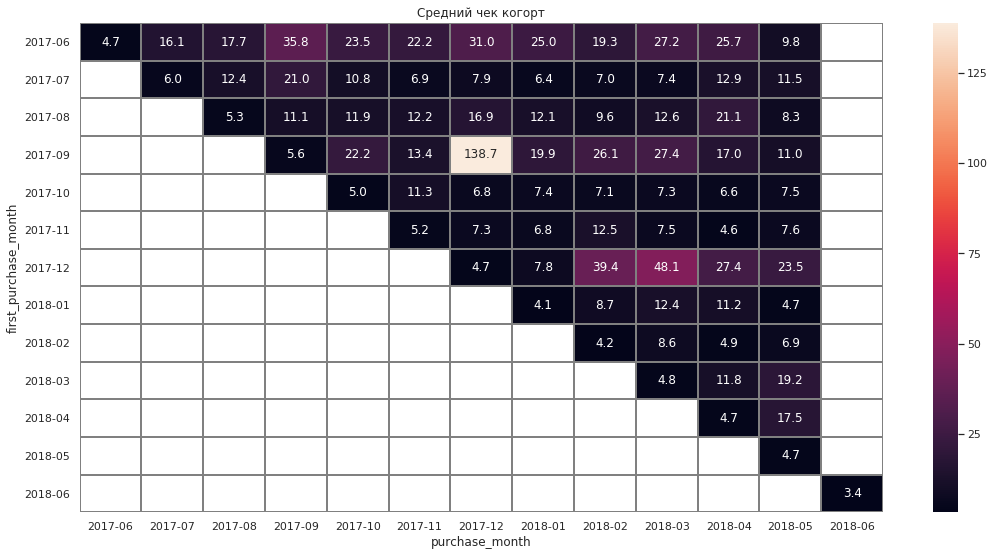

In [96]:
plt.figure(figsize=(18, 9))
plt.title('Средний чек когорт')
sns.heatmap(visual, annot=True, fmt='.1f', linewidths=1, linecolor='gray')

Сразу на себя обращают внимание показатели за декабрь. Видимо многие покупают билеты на мероприятия в качестве подарка. Февраль и март тоже показывает большую активность за счет праздников. В целом можно сделать вывод, что средний чек растет со времени первой покупки.

Средние показатели по месяцу покупки:

In [97]:
visual.mean(axis=0)

purchase_month
2017-06     4.724414
2017-07    11.052814
2017-08    11.793221
2017-09    18.398526
2017-10    14.667225
2017-11    11.869365
2017-12    30.475673
2018-01    11.203356
2018-02    14.870170
2018-03    16.332509
2018-04    13.433763
2018-05    11.024261
2018-06     3.420000
dtype: float64

Самые высокий чек на каждого пользователя наблюдается в декабре (30+ на человека). За ним сентябрь (18,3), март (16,3), февраль (14,8) и октябрь (14,6).

In [98]:
average_check = orders['revenue'].mean().round(1)
average_check

5.0

### 3.2.4 Сколько денег приносят? (LTV)

Посчитаем пожизненную ценность клиента. Для этого нам потребуются таблица orders

In [99]:
orders#.head()

,activity_date,revenue,uid,first_order_date,purchase_month,first_purchase_month
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-06-01 00:10:00,2017-06-01,2017-06-01
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-06-01 00:25:00,2017-06-01,2017-06-01
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-06-01 00:27:00,2017-06-01,2017-06-01
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-06-01 00:29:00,2017-06-01,2017-06-01
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-06-01 07:58:00,2017-06-01,2017-06-01
...,...,...,...,...,...,...
50410,2018-05-31 23:50:00,4.64,12296626599487328624,2018-05-31 23:50:00,2018-05-01,2018-05-01
50411,2018-05-31 23:50:00,5.80,11369640365507475976,2018-05-31 23:50:00,2018-05-01,2018-05-01
50412,2018-05-31 23:54:00,0.30,1786462140797698849,2018-05-31 23:54:00,2018-05-01,2018-05-01
50413,2018-05-31 23:56:00,3.67,3993697860786194247,2018-05-31 23:56:00,2018-05-01,2018-05-01


Поскольку у нас нет данных маржинальности, зададим ее равной 100%, и так как ранее мы уже посчитали и добавили данные по:

    1) Месяцу первой покупки
    2) Получили столбец с покупками по месяцам purchase_month, без времени (только даты)
    3) Получили группировку по первому заказу каждого из пользователей (first_purchase_month) Нам остается только :

Группируем таблицу по месяцу первой покупки, месяцу покупки и сумме заказов. Получим строку cohorts, показывающую какую выручку принесла когорта

In [100]:
cohorts = orders.groupby(['first_purchase_month','purchase_month']).agg({'revenue': 'sum'}).reset_index()
cohorts

,first_purchase_month,purchase_month,revenue
0,2017-06-01,2017-06-01,9557.49
1,2017-06-01,2017-07-01,981.82
2,2017-06-01,2017-08-01,885.34
3,2017-06-01,2017-09-01,1931.30
4,2017-06-01,2017-10-01,2068.58
...,...,...,...
74,2018-03-01,2018-05-01,1114.87
75,2018-04-01,2018-04-01,10600.69
76,2018-04-01,2018-05-01,1209.92
77,2018-05-01,2018-05-01,13925.76


Считаем количество "новых" покупателей за каждый месяц:

In [101]:
cohort_sizes = orders.groupby('first_purchase_month').agg({'uid': 'nunique'}).reset_index()
cohort_sizes.columns = ['first_purchase_month', 'n_buyers']
cohort_sizes

,first_purchase_month,n_buyers
0,2017-06-01,2023
1,2017-07-01,1923
2,2017-08-01,1370
3,2017-09-01,2581
4,2017-10-01,4340
5,2017-11-01,4081
6,2017-12-01,4383
7,2018-01-01,3373
8,2018-02-01,3651
9,2018-03-01,3533


In [102]:
first_year_user_count = cohort_sizes.at[0,'n_buyers'] #Сохраним данное значение, оно потребуется в дальнейшем при расчете показателя средней прибыли.

Создаем таблицу на основе существующей с нужными для расчета столбцами "месяц первой покупки" и "клиента"

In [103]:
orders_new = orders[['uid','first_purchase_month','purchase_month','revenue']]
orders_new

,uid,first_purchase_month,purchase_month,revenue
0,10329302124590727494,2017-06-01,2017-06-01,17.00
1,11627257723692907447,2017-06-01,2017-06-01,0.55
2,17903680561304213844,2017-06-01,2017-06-01,0.37
3,16109239769442553005,2017-06-01,2017-06-01,0.55
4,14200605875248379450,2017-06-01,2017-06-01,0.37
...,...,...,...,...
50410,12296626599487328624,2018-05-01,2018-05-01,4.64
50411,11369640365507475976,2018-05-01,2018-05-01,5.80
50412,1786462140797698849,2018-05-01,2018-05-01,0.30
50413,3993697860786194247,2018-05-01,2018-05-01,3.67


Группируем данные, чтобы получить сумму дохода от когорты по месяцам

In [104]:
cohorts = orders_new.groupby(['first_purchase_month','purchase_month']).agg({'revenue': 'sum'}).reset_index()
cohorts

,first_purchase_month,purchase_month,revenue
0,2017-06-01,2017-06-01,9557.49
1,2017-06-01,2017-07-01,981.82
2,2017-06-01,2017-08-01,885.34
3,2017-06-01,2017-09-01,1931.30
4,2017-06-01,2017-10-01,2068.58
...,...,...,...
74,2018-03-01,2018-05-01,1114.87
75,2018-04-01,2018-04-01,10600.69
76,2018-04-01,2018-05-01,1209.92
77,2018-05-01,2018-05-01,13925.76


In [105]:
report = pd.merge(cohort_sizes, cohorts, on='first_purchase_month') #Добавим в таблицу cohorts данные о том, сколько людей первый раз совершили покупку в каждый месяц
report

,first_purchase_month,n_buyers,purchase_month,revenue
0,2017-06-01,2023,2017-06-01,9557.49
1,2017-06-01,2023,2017-07-01,981.82
2,2017-06-01,2023,2017-08-01,885.34
3,2017-06-01,2023,2017-09-01,1931.30
4,2017-06-01,2023,2017-10-01,2068.58
...,...,...,...,...
74,2018-03-01,3533,2018-05-01,1114.87
75,2018-04-01,2276,2018-04-01,10600.69
76,2018-04-01,2276,2018-05-01,1209.92
77,2018-05-01,2988,2018-05-01,13925.76


LTV считают из валовой прибыли умножением выручки на маржинальность. Выручка в нашем случае orders['revenue'] — выручка Яндекс.Афиши с этого заказа, а маржинальность будем считать 100%, или 1.

Для удобства. будем считать когорты по возрастам (age) вместо месяцев заказа

In [106]:
report['age'] = (report['purchase_month'] - report['first_purchase_month']) / np.timedelta64(1, 'M')
report['age'] = report['age'].round().astype('int')
report

,first_purchase_month,n_buyers,purchase_month,revenue,age
0,2017-06-01,2023,2017-06-01,9557.49,0
1,2017-06-01,2023,2017-07-01,981.82,1
2,2017-06-01,2023,2017-08-01,885.34,2
3,2017-06-01,2023,2017-09-01,1931.30,3
4,2017-06-01,2023,2017-10-01,2068.58,4
...,...,...,...,...,...
74,2018-03-01,3533,2018-05-01,1114.87,2
75,2018-04-01,2276,2018-04-01,10600.69,0
76,2018-04-01,2276,2018-05-01,1209.92,1
77,2018-05-01,2988,2018-05-01,13925.76,0


Находим LTV разделив валовую прибыль когорт за каждый месяц на общее число пользователей в каждой когорте

In [107]:
report['ltv'] = report['revenue'] / report['n_buyers']

In [108]:
output = report.pivot_table(
        index='first_purchase_month', 
        columns='age', 
        values='ltv', 
        aggfunc='mean').round(2)
    
output.fillna('')

age,0,1,2,3,4,5,6,7,8,9,10,11
first_purchase_month,,,,,,,,,,,,
2017-06-01,4.72,0.49,0.44,0.95,1.02,0.74,0.95,0.58,0.55,0.61,0.57,0.26
2017-07-01,6.01,0.34,0.62,0.36,0.18,0.16,0.12,0.14,0.16,0.15,0.16,
2017-08-01,5.28,0.47,0.46,0.39,0.49,0.28,0.21,0.41,0.29,0.19,,
2017-09-01,5.64,1.12,0.52,3.98,0.4,0.65,0.7,0.24,0.18,,,
2017-10-01,5.00,0.54,0.19,0.16,0.15,0.12,0.08,0.12,,,,
2017-11-01,5.15,0.4,0.2,0.32,0.15,0.05,0.11,,,,,
2017-12-01,4.74,0.26,0.93,1.07,0.31,0.34,,,,,,
2018-01-01,4.14,0.29,0.3,0.14,0.06,,,,,,,
2018-02-01,4.16,0.28,0.08,0.07,,,,,,,,


In [109]:
ltv_mean = output.sum(axis=0).mean(axis=0)
ltv_mean

7.568333333333334

In [110]:
print ('Усреднение LTV по всем когортам:', ltv_mean)

Усреднение LTV по всем когортам: 7.568333333333334


Посчитаем усредненный LTV для нескольких когорт, приняв тот факт что период жизни пользователя 6 месяцев.

In [111]:
part_of_report = report.query('age<=6 and first_purchase_month<="2017-11-01"')
part_of_report.head(10)

,first_purchase_month,n_buyers,purchase_month,revenue,age,ltv
0,2017-06-01,2023,2017-06-01,9557.49,0,4.724414
1,2017-06-01,2023,2017-07-01,981.82,1,0.485329
2,2017-06-01,2023,2017-08-01,885.34,2,0.437637
3,2017-06-01,2023,2017-09-01,1931.30,3,0.954671
4,2017-06-01,2023,2017-10-01,2068.58,4,1.022531
5,2017-06-01,2023,2017-11-01,1487.92,5,0.735502
6,2017-06-01,2023,2017-12-01,1922.74,6,0.950440
12,2017-07-01,1923,2017-07-01,11557.65,0,6.010218
13,2017-07-01,1923,2017-08-01,644.61,1,0.335211
14,2017-07-01,1923,2017-09-01,1199.05,2,0.623531


In [112]:
new_output = part_of_report.pivot_table(
        index='first_purchase_month', 
        columns='age', 
        values='ltv', 
        aggfunc='mean').round(2)
    
new_output.fillna('')

age,0,1,2,3,4,5,6
first_purchase_month,,,,,,,
2017-06-01,4.72,0.49,0.44,0.95,1.02,0.74,0.95
2017-07-01,6.01,0.34,0.62,0.36,0.18,0.16,0.12
2017-08-01,5.28,0.47,0.46,0.39,0.49,0.28,0.21
2017-09-01,5.64,1.12,0.52,3.98,0.40,0.65,0.70
2017-10-01,5.00,0.54,0.19,0.16,0.15,0.12,0.08
2017-11-01,5.15,0.40,0.20,0.32,0.15,0.05,0.11


In [113]:
ltv_mean_2 = new_output.sum(axis=0).mean(axis=0)
ltv_mean_2

7.187142857142858

Посчитаем усредненный LTV для когорты 2017-06-01, приняв тот факт что период жизни пользователя 12 месяцев.

In [114]:
ltv_20170601 = output.loc['2017-06-01'].sum()
ltv_20170601

11.88

In [115]:
first_visits_date = visits_for_ltv.groupby('uid')['session_start'].min() 

In [116]:
first_visits_date.name = 'first_activity_date'
first_visits_date

uid
11863502262781         2018-03-01 17:27:00
49537067089222         2018-02-06 15:55:00
297729379853735        2017-06-07 18:47:00
313578113262317        2017-09-18 22:49:00
325320750514679        2017-09-30 14:29:00
                               ...        
18446403737806311543   2017-11-30 03:36:00
18446424184725333426   2017-12-06 20:32:00
18446556406699109058   2018-01-01 16:29:00
18446621818809592527   2017-12-27 13:27:00
18446676030785672386   2017-10-04 16:01:00
Name: first_activity_date, Length: 228169, dtype: datetime64[ns]

In [117]:
visits_for_ltv

,device,session_end,source_id,session_start,uid
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168
...,...,...,...,...,...
359395,desktop,2017-07-29 19:07:19,2,2017-07-29 19:07:00,18363291481961487539
359396,touch,2018-01-25 17:38:19,1,2018-01-25 17:38:00,18370831553019119586
359397,desktop,2018-03-03 10:12:19,4,2018-03-03 10:12:00,18387297585500748294
359398,desktop,2017-11-02 10:12:19,5,2017-11-02 10:12:00,18388616944624776485


In [118]:
visits_for_ltv = visits_for_ltv.join(first_visits_date,on='uid')
visits_for_ltv

,device,session_end,source_id,session_start,uid,first_activity_date
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,2017-12-20 17:20:00
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,2018-02-19 16:53:00
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527,2017-07-01 01:54:00
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,2018-03-09 20:05:00
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168,2017-12-27 14:06:00
...,...,...,...,...,...,...
359395,desktop,2017-07-29 19:07:19,2,2017-07-29 19:07:00,18363291481961487539,2017-07-29 19:07:00
359396,touch,2018-01-25 17:38:19,1,2018-01-25 17:38:00,18370831553019119586,2018-01-25 17:38:00
359397,desktop,2018-03-03 10:12:19,4,2018-03-03 10:12:00,18387297585500748294,2018-03-03 10:12:00
359398,desktop,2017-11-02 10:12:19,5,2017-11-02 10:12:00,18388616944624776485,2017-11-02 10:12:00


Так как нам надо понять какой рекламный источник или платформа привела пользователя в первый раз, то отфильтруем ее и отделим от таблицы visits, чтобы не создавать путаницы в дальнейшем:

In [119]:
visits_merge_for_ltv = visits_for_ltv[visits_for_ltv['first_activity_date'] == visits_for_ltv['session_start']]

Сгруппируем таблицу orders по дате первого заказа:

In [120]:
first_order_date_for_ltv = orders_for_ltv.groupby('uid')['order_date'].min() 

In [121]:
first_order_date_for_ltv.name = 'first_order_day'

Добавим получившиеся данные в основную таблицу orders_for_ltv:

In [122]:
orders_for_ltv = orders_for_ltv.join(first_order_date_for_ltv,on='uid')
orders_for_ltv

,order_date,revenue,uid,first_order_day
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-06-01 00:10:00
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-06-01 00:25:00
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-06-01 00:27:00
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-06-01 00:29:00
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-06-01 07:58:00
...,...,...,...,...
50410,2018-05-31 23:50:00,4.64,12296626599487328624,2018-05-31 23:50:00
50411,2018-05-31 23:50:00,5.80,11369640365507475976,2018-05-31 23:50:00
50412,2018-05-31 23:54:00,0.30,1786462140797698849,2018-05-31 23:54:00
50413,2018-05-31 23:56:00,3.67,3993697860786194247,2018-05-31 23:56:00


И в таблицу visits_merge_for_ltv:

In [123]:
visits_merge_for_ltv = visits_merge_for_ltv.join(first_order_date_for_ltv,on='uid')
visits_merge_for_ltv

,device,session_end,source_id,session_start,uid,first_activity_date,first_order_day
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,2017-12-20 17:20:00,NaT
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,2018-02-19 16:53:00,NaT
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527,2017-07-01 01:54:00,NaT
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168,2017-12-27 14:06:00,NaT
5,desktop,2017-09-03 21:36:00,5,2017-09-03 21:35:00,16007536194108375387,2017-09-03 21:35:00,2017-09-04 12:46:00
...,...,...,...,...,...,...,...
359395,desktop,2017-07-29 19:07:19,2,2017-07-29 19:07:00,18363291481961487539,2017-07-29 19:07:00,2017-07-29 19:07:00
359396,touch,2018-01-25 17:38:19,1,2018-01-25 17:38:00,18370831553019119586,2018-01-25 17:38:00,2018-01-25 17:38:00
359397,desktop,2018-03-03 10:12:19,4,2018-03-03 10:12:00,18387297585500748294,2018-03-03 10:12:00,2018-03-03 10:12:00
359398,desktop,2017-11-02 10:12:19,5,2017-11-02 10:12:00,18388616944624776485,2017-11-02 10:12:00,2017-11-02 10:12:00


Данные о первом заказе могут нам понадобятся и в первоначальной таблице visits:

In [124]:
visits_for_ltv = visits_for_ltv.join(first_order_date_for_ltv,on='uid')

Так как не все визиты пользователей оканчивались покупкой, то перед соединением таблиц отфильтруем visits_merge_for_ltv от пропущенных значений в столбце дня первого заказа:

In [125]:
visits_merge_for_ltv = visits_merge_for_ltv[~visits_merge_for_ltv['first_order_day'].isna()].reset_index(drop=True)

Можно объединить таблицы:

In [126]:
orders_for_ltv = pd.merge(orders_for_ltv, visits_merge_for_ltv, on=['uid','first_order_day'], how='left')
orders_for_ltv

,order_date,revenue,uid,first_order_day,device,session_end,source_id,session_start,first_activity_date
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-06-01 00:10:00,desktop,2017-06-01 00:11:00,1,2017-06-01 00:09:00,2017-06-01 00:09:00
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-06-01 00:25:00,desktop,2017-06-01 00:25:00,2,2017-06-01 00:14:00,2017-06-01 00:14:00
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-06-01 00:27:00,desktop,2017-06-01 00:34:00,2,2017-06-01 00:25:00,2017-06-01 00:25:00
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-06-01 00:29:00,desktop,2017-06-01 00:33:00,2,2017-06-01 00:14:00,2017-06-01 00:14:00
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-06-01 07:58:00,desktop,2017-06-01 07:59:00,3,2017-06-01 07:31:00,2017-06-01 07:31:00
...,...,...,...,...,...,...,...,...,...
50410,2018-05-31 23:50:00,4.64,12296626599487328624,2018-05-31 23:50:00,touch,2018-05-31 09:12:00,4,2018-05-31 09:11:00,2018-05-31 09:11:00
50411,2018-05-31 23:50:00,5.80,11369640365507475976,2018-05-31 23:50:00,desktop,2018-05-31 23:55:00,10,2018-05-31 23:05:00,2018-05-31 23:05:00
50412,2018-05-31 23:54:00,0.30,1786462140797698849,2018-05-31 23:54:00,desktop,2018-05-31 23:55:00,3,2018-05-31 23:52:00,2018-05-31 23:52:00
50413,2018-05-31 23:56:00,3.67,3993697860786194247,2018-05-31 23:56:00,desktop,2017-10-23 12:36:00,3,2017-10-23 12:32:00,2017-10-23 12:32:00


In [127]:
orders_for_ltv['first_order_month'] = orders_for_ltv['first_order_day'].astype('datetime64[M]')

In [128]:
orders_for_ltv['order_month'] = orders_for_ltv['order_date'].astype('datetime64[M]')

Как мы и планировали, у нас получилось добавить данные о рекламных истониках и платформах к таблице orders_for_ltv

Получим таблицу по источнику 1:

In [129]:
table_start_1 = orders_for_ltv.query('source_id==1')

In [130]:
table_1 = table_start_1.groupby(['first_order_month','order_month']).agg({'revenue': 'sum'}).reset_index()

In [131]:
count_buyers_1 = table_start_1.groupby('first_order_month').agg({'uid': 'nunique'}).reset_index()
count_buyers_1.columns = ['first_order_month', 'n_buyers']

In [132]:
LTV_table_1 = table_1.merge(count_buyers_1, on='first_order_month')
# LTV_table.duplicated().sum()
# LTV_table.drop_duplicates(inplace = True)

In [133]:
LTV_table_1['age'] = (LTV_table_1['order_month'] - LTV_table_1['first_order_month']) / np.timedelta64(1, 'M')
LTV_table_1['age'] = LTV_table_1['age'].round().astype('int')

In [134]:
LTV_table_1['ltv'] = LTV_table_1['revenue'] / LTV_table_1['n_buyers']
LTV_table_1 = LTV_table_1.query('age<=6 and first_order_month<="2017-11-01"')

In [135]:
LTV_output_1 = LTV_table_1.pivot_table(
        index='first_order_month', 
        columns='age', 
        values='ltv', 
        aggfunc='mean').round(2)
    
LTV_output_1.fillna('')

age,0,1,2,3,4,5,6
first_order_month,,,,,,,
2017-06-01,7.26,2.18,2.21,3.76,4.27,2.05,2.58
2017-07-01,7.29,1.10,5.35,1.51,0.88,0.90,0.45
2017-08-01,7.49,1.20,1.01,0.96,1.04,0.67,0.68
2017-09-01,6.01,1.80,0.56,0.92,0.04,0.10,0.08
2017-10-01,6.02,1.06,0.24,0.39,0.06,0.11,0.18
2017-11-01,7.39,0.57,0.96,0.89,0.16,0.11,0.08


In [136]:
LTV_mean_s1 = LTV_output_1.sum(axis=0).mean(axis=0)
LTV_mean_s1

11.795714285714284

Для источника 2:

In [137]:
table_start_2 = orders_for_ltv.query('source_id==2')

In [138]:
table_2 = table_start_2.groupby(['first_order_month','order_month']).agg({'revenue': 'sum'}).reset_index()

In [139]:
count_buyers_2 = table_start_2.groupby('first_order_month').agg({'uid': 'nunique'}).reset_index()
count_buyers_2.columns = ['first_order_month', 'n_buyers']

In [140]:
LTV_table_2 = table_2.merge(count_buyers_2, on='first_order_month')
# LTV_table.duplicated().sum()
# LTV_table.drop_duplicates(inplace = True) 

In [141]:
LTV_table_2['age'] = (LTV_table_2['order_month'] - LTV_table_2['first_order_month']) / np.timedelta64(1, 'M')
LTV_table_2['age'] = LTV_table_2['age'].round().astype('int')

In [142]:
LTV_table_2['ltv'] = LTV_table_2['revenue'] / LTV_table_2['n_buyers']
LTV_table_2 = LTV_table_2.query('age<=6 and first_order_month<="2017-11-01"')

In [143]:
LTV_output_2 = LTV_table_2.pivot_table(
        index='first_order_month', 
        columns='age', 
        values='ltv', 
        aggfunc='mean').round(2)
    
LTV_output_2.fillna('')

age,0,1,2,3,4,5,6
first_order_month,,,,,,,
2017-06-01,4.44,0.49,0.27,1.92,1.67,0.92,1.60
2017-07-01,8.43,0.77,0.06,0.32,0.43,0.19,0.30
2017-08-01,5.74,0.94,0.18,0.25,0.52,0.06,0.12
2017-09-01,8.28,8.13,2.36,0.92,1.41,0.97,3.32
2017-10-01,7.68,2.46,0.66,0.54,0.56,0.27,0.10
2017-11-01,6.99,0.91,0.44,0.78,0.31,0.14,0.14


In [144]:
LTV_mean_s2 = LTV_output_2.sum(axis=0).mean(axis=0)
LTV_mean_s2

10.998571428571427

Для источника 3:

In [145]:
table_start_3 = orders_for_ltv.query('source_id==3')

In [146]:
table_3 = table_start_3.groupby(['first_order_month','order_month']).agg({'revenue': 'sum'}).reset_index()

In [147]:
count_buyers_3 = table_start_3.groupby('first_order_month').agg({'uid': 'nunique'}).reset_index()
count_buyers_3.columns = ['first_order_month', 'n_buyers']

In [148]:
LTV_table_3 = table_3.merge(count_buyers_3, on='first_order_month')
# LTV_table.duplicated().sum()
# LTV_table.drop_duplicates(inplace = True)

In [149]:
LTV_table_3['age'] = (LTV_table_3['order_month'] - LTV_table_3['first_order_month']) / np.timedelta64(1, 'M')
LTV_table_3['age'] = LTV_table_3['age'].round().astype('int')

In [150]:
LTV_table_3['ltv'] = LTV_table_3['revenue'] / LTV_table_3['n_buyers']
LTV_table_3 = LTV_table_3.query('age<=6 and first_order_month<="2017-11-01"')

In [151]:
LTV_output_3 = LTV_table_3.pivot_table(
        index='first_order_month', 
        columns='age', 
        values='ltv', 
        aggfunc='mean').round(2)
    
LTV_output_3.fillna('')

age,0,1,2,3,4,5,6
first_order_month,,,,,,,
2017-06-01,4.40,0.11,0.19,0.31,0.19,0.19,0.13
2017-07-01,6.11,0.26,0.12,0.39,0.04,0.07,0.04
2017-08-01,5.08,0.15,0.29,0.11,0.16,0.05,0.06
2017-09-01,5.56,0.25,0.32,0.09,0.22,0.12,0.13
2017-10-01,4.79,0.46,0.12,0.06,0.11,0.10,0.02
2017-11-01,4.53,0.13,0.08,0.12,0.06,0.03,0.03


In [152]:
LTV_mean_s3 = LTV_output_3.sum(axis=0).mean(axis=0)
LTV_mean_s3

5.111428571428571

Для источника 4:

In [153]:
table_start_4 = orders_for_ltv.query('source_id==4')

In [154]:
table_4 = table_start_4.groupby(['first_order_month','order_month']).agg({'revenue': 'sum'}).reset_index()

In [155]:
count_buyers_4 = table_start_4.groupby('first_order_month').agg({'uid': 'nunique'}).reset_index()
count_buyers_4.columns = ['first_order_month', 'n_buyers']

In [156]:
LTV_table_4 = table_4.merge(count_buyers_4, on='first_order_month')
# LTV_table.duplicated().sum()
# LTV_table.drop_duplicates(inplace = True)

In [157]:
LTV_table_4['age'] = (LTV_table_4['order_month'] - LTV_table_4['first_order_month']) / np.timedelta64(1, 'M')
LTV_table_4['age'] = LTV_table_4['age'].round().astype('int')

In [158]:
LTV_table_4['ltv'] = LTV_table_4['revenue'] / LTV_table_4['n_buyers']
LTV_table_4 = LTV_table_4.query('age<=6 and first_order_month<="2017-11-01"')

In [159]:
LTV_output_4 = LTV_table_4.pivot_table(
        index='first_order_month', 
        columns='age', 
        values='ltv', 
        aggfunc='mean').round(2)
    
LTV_output_4.fillna('')

age,0,1,2,3,4,5,6
first_order_month,,,,,,,
2017-06-01,4.75,0.04,0.17,0.46,1.15,1.49,1.43
2017-07-01,5.54,0.06,0.08,0.16,0.06,0.06,0.10
2017-08-01,5.06,0.17,0.13,0.27,0.15,0.21,0.08
2017-09-01,4.77,0.48,0.31,0.29,0.05,0.24,1.25
2017-10-01,4.37,0.15,0.15,0.11,0.12,0.09,0.09
2017-11-01,5.14,0.65,0.10,0.41,0.19,0.04,0.22


In [160]:
LTV_mean_s4 = LTV_output_4.sum(axis=0).mean(axis=0)
LTV_mean_s4

5.8342857142857145

Для источника 5:

In [161]:
table_start_5 = orders_for_ltv.query('source_id==5')
table_start_5

,order_date,revenue,uid,first_order_day,device,session_end,source_id,session_start,first_activity_date,first_order_month,order_month
6,2017-06-01 08:54:00,1.83,12464626743129688638,2017-06-01 08:54:00,desktop,2017-06-01 09:12:00,5,2017-06-01 08:51:00,2017-06-01 08:51:00,2017-06-01,2017-06-01
20,2017-06-01 11:08:00,1.83,9814534000845345552,2017-06-01 11:08:00,desktop,2017-06-01 11:16:00,5,2017-06-01 11:05:00,2017-06-01 11:05:00,2017-06-01,2017-06-01
24,2017-06-01 14:14:00,1.22,6749200142647927813,2017-06-01 14:14:00,desktop,2017-06-01 14:19:00,5,2017-06-01 14:14:00,2017-06-01 14:14:00,2017-06-01,2017-06-01
35,2017-06-01 16:50:00,0.24,17654842465850522525,2017-06-01 16:50:00,desktop,2017-06-01 16:51:00,5,2017-06-01 16:46:00,2017-06-01 16:46:00,2017-06-01,2017-06-01
39,2017-06-01 17:19:00,0.55,7939977454700153907,2017-06-01 17:19:00,desktop,2017-06-01 14:43:00,5,2017-06-01 14:28:00,2017-06-01 14:28:00,2017-06-01,2017-06-01
...,...,...,...,...,...,...,...,...,...,...,...
50377,2018-05-31 22:03:00,0.24,2653219120084485794,2018-05-31 22:03:00,desktop,2018-05-31 22:03:00,5,2018-05-31 22:00:00,2018-05-31 22:00:00,2018-05-01,2018-05-01
50379,2018-05-31 22:04:00,0.61,10918502916614580475,2018-05-31 22:04:00,desktop,2018-05-28 21:38:00,5,2018-05-28 21:34:00,2018-05-28 21:34:00,2018-05-01,2018-05-01
50383,2018-05-31 22:16:00,7.33,9985845906947650101,2018-05-31 22:16:00,touch,2017-09-20 11:16:00,5,2017-09-20 11:09:00,2017-09-20 11:09:00,2018-05-01,2018-05-01
50400,2018-05-31 23:13:00,6.72,11767206187037456942,2018-05-31 23:13:00,desktop,2018-05-31 11:52:00,5,2018-05-31 11:45:00,2018-05-31 11:45:00,2018-05-01,2018-05-01


In [162]:
table_5 = table_start_5.groupby(['first_order_month','order_month']).agg({'revenue': 'sum'}).reset_index()

In [163]:
count_buyers_5 = table_start_5.groupby('first_order_month').agg({'uid': 'nunique'}).reset_index()
count_buyers_5.columns = ['first_order_month', 'n_buyers']

In [164]:
LTV_table_5 = table_5.merge(count_buyers_5, on='first_order_month')
# LTV_table.duplicated().sum()
# LTV_table.drop_duplicates(inplace = True)

In [165]:
LTV_table_5['age'] = (LTV_table_5['order_month'] - LTV_table_5['first_order_month']) / np.timedelta64(1, 'M')
LTV_table_5['age'] = LTV_table_5['age'].round().astype('int')

In [166]:
LTV_table_5['ltv'] = LTV_table_5['revenue'] / LTV_table_5['n_buyers']
LTV_table_5 = LTV_table_5.query('age<=6 and first_order_month<="2017-11-01"')

In [167]:
LTV_output_5 = LTV_table_5.pivot_table(
        index='first_order_month', 
        columns='age', 
        values='ltv', 
        aggfunc='mean').round(2)
    
LTV_output_5.fillna('')

age,0,1,2,3,4,5,6
first_order_month,,,,,,,
2017-06-01,4.95,0.90,0.45,0.87,0.66,0.30,0.91
2017-07-01,5.29,0.32,0.45,0.15,0.10,0.11,0.03
2017-08-01,5.05,0.75,0.83,0.71,1.08,0.59,0.39
2017-09-01,6.20,0.18,0.33,16.17,0.77,2.02,0.28
2017-10-01,5.09,0.22,0.12,0.12,0.11,0.10,0.14
2017-11-01,4.56,0.19,0.12,0.06,0.14,0.04,0.11


In [168]:
LTV_mean_s5 = LTV_output_5.sum(axis=0).mean(axis=0)
LTV_mean_s5

8.85142857142857

Для источника 9:

In [169]:
table_start_9 = orders_for_ltv.query('source_id==9')
table_start_9

,order_date,revenue,uid,first_order_day,device,session_end,source_id,session_start,first_activity_date,first_order_month,order_month
50,2017-06-01 19:05:00,2.14,2802806506908037623,2017-06-01 19:05:00,desktop,2017-06-01 11:19:00,9,2017-06-01 11:17:00,2017-06-01 11:17:00,2017-06-01,2017-06-01
66,2017-06-01 21:09:00,2.44,9729244501093943694,2017-06-01 21:09:00,desktop,2017-06-01 21:13:00,9,2017-06-01 21:04:00,2017-06-01 21:04:00,2017-06-01,2017-06-01
69,2017-06-01 21:19:00,3.67,13596221371441143698,2017-06-01 21:19:00,desktop,2017-06-01 20:02:00,9,2017-06-01 19:26:00,2017-06-01 19:26:00,2017-06-01,2017-06-01
83,2017-06-01 21:59:00,1.83,9101847584127812729,2017-06-01 21:59:00,desktop,2017-06-01 22:04:00,9,2017-06-01 21:08:00,2017-06-01 21:08:00,2017-06-01,2017-06-01
104,2017-06-02 08:42:00,0.30,4627890001757671730,2017-06-02 08:42:00,desktop,2017-06-02 08:42:19,9,2017-06-02 08:42:00,2017-06-02 08:42:00,2017-06-01,2017-06-01
...,...,...,...,...,...,...,...,...,...,...,...
50257,2018-05-31 17:20:00,3.42,13465334080837783919,2018-05-31 17:20:00,desktop,2018-05-31 17:22:00,9,2018-05-31 17:12:00,2018-05-31 17:12:00,2018-05-01,2018-05-01
50295,2018-05-31 18:22:00,0.92,5359718846599854608,2018-05-31 18:22:00,touch,2018-05-21 17:12:00,9,2018-05-21 17:11:00,2018-05-21 17:11:00,2018-05-01,2018-05-01
50313,2018-05-31 19:01:00,16.50,11108631484349381433,2017-09-04 21:21:00,desktop,2017-09-04 21:26:00,9,2017-09-04 20:59:00,2017-09-04 20:59:00,2017-09-01,2018-05-01
50316,2018-05-31 19:04:00,2.32,14878515827023657269,2017-12-18 13:59:00,desktop,2017-12-18 11:30:00,9,2017-12-18 11:17:00,2017-12-18 11:17:00,2017-12-01,2018-05-01


In [170]:
table_9 = table_start_9.groupby(['first_order_month','order_month']).agg({'revenue': 'sum'}).reset_index()

In [171]:
count_buyers_9 = table_start_9.groupby('first_order_month').agg({'uid': 'nunique'}).reset_index()
count_buyers_9.columns = ['first_order_month', 'n_buyers']

In [172]:
LTV_table_9 = table_9.merge(count_buyers_9, on='first_order_month')
# LTV_table.duplicated().sum()
# LTV_table.drop_duplicates(inplace = True)

In [173]:
LTV_table_9['age'] = (LTV_table_9['order_month'] - LTV_table_9['first_order_month']) / np.timedelta64(1, 'M')
LTV_table_9['age'] = LTV_table_9['age'].round().astype('int')


In [174]:
LTV_table_9['ltv'] = LTV_table_9['revenue'] / LTV_table_9['n_buyers']
LTV_table_9 = LTV_table_9.query('age<=6 and first_order_month<="2017-11-01"')

In [175]:
LTV_output_9 = LTV_table_9.pivot_table(
        index='first_order_month', 
        columns='age', 
        values='ltv', 
        aggfunc='mean').round(2)
    
LTV_output_9.fillna('')

age,0,1,2,3,4,5,6
first_order_month,,,,,,,
2017-06-01,3.57,0.07,0.59,0.61,0.27,0.44,0.53
2017-07-01,4.47,0.16,0.63,0.49,0.37,0.06,0.29
2017-08-01,4.07,0.20,0.64,0.23,0.05,0.07,0.14
2017-09-01,4.30,1.02,0.63,0.80,0.60,0.13,0.62
2017-10-01,5.06,0.54,0.44,0.12,0.29,0.54,0.02
2017-11-01,3.74,0.13,0.16,0.29,0.15,0.03,0.02


In [176]:
LTV_mean_s9 = LTV_output_9.sum(axis=0).mean(axis=0)
LTV_mean_s9

5.368571428571428

Для источника 10:

In [177]:
table_start_10 = orders_for_ltv.query('source_id==10')
table_start_10

,order_date,revenue,uid,first_order_day,device,session_end,source_id,session_start,first_activity_date,first_order_month,order_month
76,2017-06-01 21:49:00,3.30,5393972724164817668,2017-06-01 21:49:00,touch,2017-06-01 21:52:00,10,2017-06-01 21:49:00,2017-06-01 21:49:00,2017-06-01,2017-06-01
99,2017-06-02 00:55:00,1.22,12044090133793755196,2017-06-02 00:55:00,desktop,2017-06-02 00:57:00,10,2017-06-02 00:49:00,2017-06-02 00:49:00,2017-06-01,2017-06-01
131,2017-06-02 12:24:00,0.37,17606865187098888614,2017-06-02 12:24:00,desktop,2017-06-01 18:13:00,10,2017-06-01 17:48:00,2017-06-01 17:48:00,2017-06-01,2017-06-01
134,2017-06-02 12:33:00,0.61,14028115454453445103,2017-06-02 12:33:00,desktop,2017-06-02 12:36:00,10,2017-06-02 12:27:00,2017-06-02 12:27:00,2017-06-01,2017-06-01
145,2017-06-02 13:10:00,0.15,14028115454453445103,2017-06-02 12:33:00,desktop,2017-06-02 12:36:00,10,2017-06-02 12:27:00,2017-06-02 12:27:00,2017-06-01,2017-06-01
...,...,...,...,...,...,...,...,...,...,...,...
50357,2018-05-31 21:14:00,3.54,3062363353826531475,2018-05-31 21:14:00,desktop,2018-05-31 18:10:00,10,2018-05-31 17:41:00,2018-05-31 17:41:00,2018-05-01,2018-05-01
50392,2018-05-31 22:50:00,2.44,15116668155510764243,2018-05-31 22:50:00,desktop,2018-05-31 22:51:00,10,2018-05-31 22:47:00,2018-05-31 22:47:00,2018-05-01,2018-05-01
50396,2018-05-31 23:01:00,1.16,4326846074047313748,2018-05-31 23:01:00,desktop,2018-05-31 13:46:00,10,2018-05-31 13:40:00,2018-05-31 13:40:00,2018-05-01,2018-05-01
50407,2018-05-31 23:40:00,2.26,15576344609395725707,2018-05-31 23:40:00,desktop,2018-05-31 23:44:00,10,2018-05-31 23:35:00,2018-05-31 23:35:00,2018-05-01,2018-05-01


In [178]:
table_10 = table_start_10.groupby(['first_order_month','order_month']).agg({'revenue': 'sum'}).reset_index()

In [179]:
count_buyers_10 = table_start_10.groupby('first_order_month').agg({'uid': 'nunique'}).reset_index()
count_buyers_10.columns = ['first_order_month', 'n_buyers']

In [180]:
LTV_table_10 = table_10.merge(count_buyers_10, on='first_order_month')
# LTV_table.duplicated().sum()
# LTV_table.drop_duplicates(inplace = True)

In [181]:
LTV_table_10['age'] = (LTV_table_10['order_month'] - LTV_table_10['first_order_month']) / np.timedelta64(1, 'M')
LTV_table_10['age'] = LTV_table_10['age'].round().astype('int')

In [182]:
LTV_table_10['ltv'] = LTV_table_10['revenue'] / LTV_table_10['n_buyers']
LTV_table_10 = LTV_table_10.query('age<=6 and first_order_month<="2017-11-01"')

In [183]:
LTV_output_10 = LTV_table_10.pivot_table(
        index='first_order_month', 
        columns='age', 
        values='ltv', 
        aggfunc='mean').round(2)
    
LTV_output_10.fillna('')

age,0,1,2,3,4,5,6
first_order_month,,,,,,,
2017-06-01,2.41,0.12,,,,,
2017-07-01,3.46,0.03,,0.15,,,
2017-08-01,5.00,0.11,0.33,,,,
2017-09-01,2.23,0.06,0.08,0.19,0.03,,
2017-10-01,2.62,0.08,0.01,0.02,0.04,0.01,0.02
2017-11-01,4.62,0.05,0.01,0.19,0.1,0.05,0.05


In [184]:
LTV_mean_s10 = LTV_output_10.sum(axis=0).mean(axis=0)
LTV_mean_s10

3.1528571428571435

Итого получаем следующие значения LTV за 6 месяцев для каждого источника: 

In [185]:
print ('Источник 1:',LTV_mean_s1.round(2))
print ('Источник 2:',LTV_mean_s2.round(2))
print ('Источник 3:',LTV_mean_s3.round(2))
print ('Источник 4:',LTV_mean_s4.round(2))
print ('Источник 5:',LTV_mean_s5.round(2))
print ('Источник 9:',LTV_mean_s9.round(2))
print ('Источник 10:',LTV_mean_s10.round(2))

Источник 1: 11.8
Источник 2: 11.0
Источник 3: 5.11
Источник 4: 5.83
Источник 5: 8.85
Источник 9: 5.37
Источник 10: 3.15


## 3.3 Маркетинг

    3.3.1 Сколько денег потратили? Всего / на каждый источник / по времени
    3.3.2 Сколько стоило привлечение одного покупателя из каждого источника?
    3.3.3 На сколько окупились расходы? (ROI)

In [186]:
costs.head()

,source_id,dt,costs
0,1,2017-06-01,75.20
1,1,2017-06-02,62.25
2,1,2017-06-03,36.53
3,1,2017-06-04,55.00
4,1,2017-06-05,57.08


In [187]:
spend_total = costs.groupby('source_id').agg({'costs':'sum'}).reset_index()
spend_total

,source_id,costs
0,1,20833.27
1,2,42806.04
2,3,141321.63
3,4,61073.60
4,5,51757.10
5,9,5517.49
6,10,5822.49


**Сколько денег потратили всего?**

In [188]:
spend_total['costs'].sum()

329131.6199999999

**Сколько денег потратили на каждый источник?**

Посмотрим на разбивку расходов по рекламным источникам:

In [189]:
spend_total_sources = costs.pivot_table(index = 'source_id', values = 'costs', 
                                             aggfunc='sum')

In [190]:
spend_total_sources.sort_values(by = 'costs',ascending=False)

,costs
source_id,
3,141321.63
4,61073.60
5,51757.10
2,42806.04
1,20833.27
10,5822.49
9,5517.49


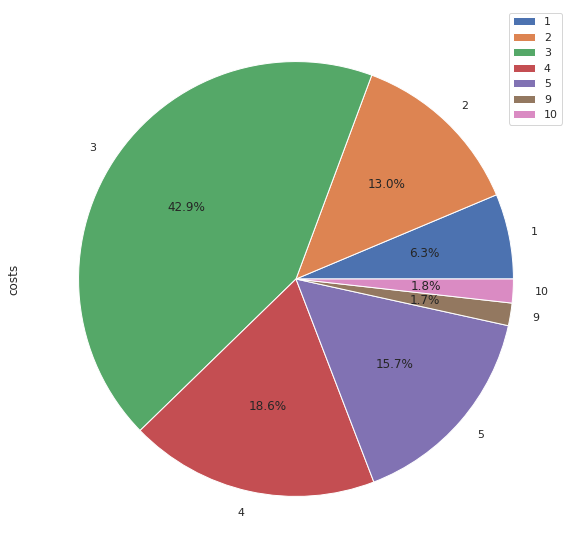

In [191]:
spend_total_sources.plot.pie(subplots=True, figsize=(10, 10), autopct='%1.1f%%');

Первое место по расходам занимает рекламный источник 3. На него было потрачено 42,9% всех средств на рекламу.

Можно сравнить затраты на рекламу с доходом по рекламным источникам:

Добавим рекламные источники и платформы в таблицу old_orders

In [192]:
old_orders

,activity_date,revenue,uid
0,2017-06-01 00:10:00,17.00,10329302124590727494
1,2017-06-01 00:25:00,0.55,11627257723692907447
2,2017-06-01 00:27:00,0.37,17903680561304213844
3,2017-06-01 00:29:00,0.55,16109239769442553005
4,2017-06-01 07:58:00,0.37,14200605875248379450
...,...,...,...
50410,2018-05-31 23:50:00,4.64,12296626599487328624
50411,2018-05-31 23:50:00,5.80,11369640365507475976
50412,2018-05-31 23:54:00,0.30,1786462140797698849
50413,2018-05-31 23:56:00,3.67,3993697860786194247


In [193]:
old_visits

,device,session_end,source_id,session_start,uid,false_session
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,00:18:00
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,00:28:00
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,00:24:00
5,desktop,2017-09-03 21:36:00,5,2017-09-03 21:35:00,16007536194108375387,00:01:00
6,desktop,2018-01-30 12:09:00,1,2018-01-30 11:13:00,6661610529277171451,00:56:00
...,...,...,...,...,...,...
359395,desktop,2017-07-29 19:07:19,2,2017-07-29 19:07:00,18363291481961487539,00:00:19
359396,touch,2018-01-25 17:38:19,1,2018-01-25 17:38:00,18370831553019119586,00:00:19
359397,desktop,2018-03-03 10:12:19,4,2018-03-03 10:12:00,18387297585500748294,00:00:19
359398,desktop,2017-11-02 10:12:19,5,2017-11-02 10:12:00,18388616944624776485,00:00:19


In [194]:
old_orders.columns = ['order_date', 'revenue', 'uid']
old_orders

,order_date,revenue,uid
0,2017-06-01 00:10:00,17.00,10329302124590727494
1,2017-06-01 00:25:00,0.55,11627257723692907447
2,2017-06-01 00:27:00,0.37,17903680561304213844
3,2017-06-01 00:29:00,0.55,16109239769442553005
4,2017-06-01 07:58:00,0.37,14200605875248379450
...,...,...,...
50410,2018-05-31 23:50:00,4.64,12296626599487328624
50411,2018-05-31 23:50:00,5.80,11369640365507475976
50412,2018-05-31 23:54:00,0.30,1786462140797698849
50413,2018-05-31 23:56:00,3.67,3993697860786194247


In [195]:
first_visits_date = old_visits.groupby('uid')['session_start'].min() 

In [196]:
first_visits_date.name = 'first_activity_date'
first_visits_date

uid
11863502262781         2018-03-01 17:27:00
49537067089222         2018-02-06 15:55:00
297729379853735        2017-06-07 18:47:00
313578113262317        2017-09-18 22:49:00
325320750514679        2017-09-30 14:29:00
                               ...        
18446316582013423015   2018-02-26 10:14:00
18446403737806311543   2017-11-30 03:36:00
18446556406699109058   2018-01-01 16:29:00
18446621818809592527   2017-12-27 13:27:00
18446676030785672386   2017-10-04 16:01:00
Name: first_activity_date, Length: 207051, dtype: datetime64[ns]

In [197]:
old_visits = old_visits.join(first_visits_date,on='uid')
old_visits

,device,session_end,source_id,session_start,uid,false_session,first_activity_date
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,00:18:00,2017-12-20 17:20:00
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,00:28:00,2018-02-19 16:53:00
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,00:24:00,2018-03-09 20:05:00
5,desktop,2017-09-03 21:36:00,5,2017-09-03 21:35:00,16007536194108375387,00:01:00,2017-09-03 21:35:00
6,desktop,2018-01-30 12:09:00,1,2018-01-30 11:13:00,6661610529277171451,00:56:00,2017-06-29 09:00:00
...,...,...,...,...,...,...,...
359395,desktop,2017-07-29 19:07:19,2,2017-07-29 19:07:00,18363291481961487539,00:00:19,2017-07-29 19:07:00
359396,touch,2018-01-25 17:38:19,1,2018-01-25 17:38:00,18370831553019119586,00:00:19,2018-01-25 17:38:00
359397,desktop,2018-03-03 10:12:19,4,2018-03-03 10:12:00,18387297585500748294,00:00:19,2018-03-03 10:12:00
359398,desktop,2017-11-02 10:12:19,5,2017-11-02 10:12:00,18388616944624776485,00:00:19,2017-11-02 10:12:00


Так как нам надо понять какой рекламный источник или платформа привела пользователя в первый раз, то отфильтруем ее и отделим от таблицы visits, чтобы не создавать путаницы в дальнейшем:

In [198]:
visits_merge = old_visits[old_visits['first_activity_date'] == old_visits['session_start']]
visits_merge

,device,session_end,source_id,session_start,uid,false_session,first_activity_date
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,00:18:00,2017-12-20 17:20:00
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,00:28:00,2018-02-19 16:53:00
5,desktop,2017-09-03 21:36:00,5,2017-09-03 21:35:00,16007536194108375387,00:01:00,2017-09-03 21:35:00
7,touch,2017-11-05 15:15:00,3,2017-11-05 15:14:00,11423865690854540312,00:01:00,2017-11-05 15:14:00
8,desktop,2017-07-19 10:44:00,3,2017-07-19 10:41:00,2987360259350925644,00:03:00,2017-07-19 10:41:00
...,...,...,...,...,...,...,...
359395,desktop,2017-07-29 19:07:19,2,2017-07-29 19:07:00,18363291481961487539,00:00:19,2017-07-29 19:07:00
359396,touch,2018-01-25 17:38:19,1,2018-01-25 17:38:00,18370831553019119586,00:00:19,2018-01-25 17:38:00
359397,desktop,2018-03-03 10:12:19,4,2018-03-03 10:12:00,18387297585500748294,00:00:19,2018-03-03 10:12:00
359398,desktop,2017-11-02 10:12:19,5,2017-11-02 10:12:00,18388616944624776485,00:00:19,2017-11-02 10:12:00


Сгруппируем таблицу orders по дате первого заказа:

In [199]:
first_order_date = old_orders.groupby('uid')['order_date'].min()
first_order_date

uid
313578113262317        2018-01-03 21:51:00
1575281904278712       2017-06-03 10:13:00
2429014661409475       2017-10-11 18:33:00
2464366381792757       2018-01-28 15:54:00
2551852515556206       2017-11-24 10:14:00
                               ...        
18445147675727495770   2017-11-24 09:03:00
18445407535914413204   2017-09-22 23:55:00
18445601152732270159   2018-03-26 22:54:00
18446156210226471712   2018-02-18 19:34:00
18446167067214817906   2017-10-17 10:16:00
Name: order_date, Length: 36523, dtype: datetime64[ns]

In [200]:
first_order_date.name = 'first_order_day'

Добавим получившиеся данные в основную таблицу orders:

In [201]:
old_orders = old_orders.join(first_order_date,on='uid')
old_orders

,order_date,revenue,uid,first_order_day
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-06-01 00:10:00
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-06-01 00:25:00
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-06-01 00:27:00
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-06-01 00:29:00
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-06-01 07:58:00
...,...,...,...,...
50410,2018-05-31 23:50:00,4.64,12296626599487328624,2018-05-31 23:50:00
50411,2018-05-31 23:50:00,5.80,11369640365507475976,2018-05-31 23:50:00
50412,2018-05-31 23:54:00,0.30,1786462140797698849,2018-05-31 23:54:00
50413,2018-05-31 23:56:00,3.67,3993697860786194247,2018-05-31 23:56:00


И в таблицу visits_merge:

In [202]:
visits_merge = visits_merge.join(first_order_date,on='uid')
visits_merge

,device,session_end,source_id,session_start,uid,false_session,first_activity_date,first_order_day
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,00:18:00,2017-12-20 17:20:00,NaT
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,00:28:00,2018-02-19 16:53:00,NaT
5,desktop,2017-09-03 21:36:00,5,2017-09-03 21:35:00,16007536194108375387,00:01:00,2017-09-03 21:35:00,2017-09-04 12:46:00
7,touch,2017-11-05 15:15:00,3,2017-11-05 15:14:00,11423865690854540312,00:01:00,2017-11-05 15:14:00,NaT
8,desktop,2017-07-19 10:44:00,3,2017-07-19 10:41:00,2987360259350925644,00:03:00,2017-07-19 10:41:00,NaT
...,...,...,...,...,...,...,...,...
359395,desktop,2017-07-29 19:07:19,2,2017-07-29 19:07:00,18363291481961487539,00:00:19,2017-07-29 19:07:00,2017-07-29 19:07:00
359396,touch,2018-01-25 17:38:19,1,2018-01-25 17:38:00,18370831553019119586,00:00:19,2018-01-25 17:38:00,2018-01-25 17:38:00
359397,desktop,2018-03-03 10:12:19,4,2018-03-03 10:12:00,18387297585500748294,00:00:19,2018-03-03 10:12:00,2018-03-03 10:12:00
359398,desktop,2017-11-02 10:12:19,5,2017-11-02 10:12:00,18388616944624776485,00:00:19,2017-11-02 10:12:00,2017-11-02 10:12:00


In [203]:
visits_merge = visits_merge[~visits_merge['first_order_day'].isna()].reset_index(drop=True)
visits_merge

,device,session_end,source_id,session_start,uid,false_session,first_activity_date,first_order_day
0,desktop,2017-09-03 21:36:00,5,2017-09-03 21:35:00,16007536194108375387,00:01:00,2017-09-03 21:35:00,2017-09-04 12:46:00
1,touch,2018-02-12 20:30:00,2,2018-02-12 19:24:00,18188358787673499603,01:06:00,2018-02-12 19:24:00,2018-02-12 19:48:00
2,desktop,2017-10-23 12:58:00,3,2017-10-23 12:49:00,4499746016005494365,00:09:00,2017-10-23 12:49:00,2017-11-16 14:04:00
3,desktop,2018-02-25 23:43:00,5,2018-02-25 23:35:00,9344114199116964256,00:08:00,2018-02-25 23:35:00,2018-02-25 23:36:00
4,desktop,2018-01-30 16:30:00,3,2018-01-30 16:04:00,15667207291200562748,00:26:00,2018-01-30 16:04:00,2018-01-30 21:16:00
...,...,...,...,...,...,...,...,...
36076,desktop,2017-07-29 19:07:19,2,2017-07-29 19:07:00,18363291481961487539,00:00:19,2017-07-29 19:07:00,2017-07-29 19:07:00
36077,touch,2018-01-25 17:38:19,1,2018-01-25 17:38:00,18370831553019119586,00:00:19,2018-01-25 17:38:00,2018-01-25 17:38:00
36078,desktop,2018-03-03 10:12:19,4,2018-03-03 10:12:00,18387297585500748294,00:00:19,2018-03-03 10:12:00,2018-03-03 10:12:00
36079,desktop,2017-11-02 10:12:19,5,2017-11-02 10:12:00,18388616944624776485,00:00:19,2017-11-02 10:12:00,2017-11-02 10:12:00


In [204]:
old_orders = pd.merge(old_orders, visits_merge, on=['uid','first_order_day'], how='left')
old_orders['source_id'] = old_orders['source_id'].astype(pd.Int64Dtype())
old_orders.head(5)

,order_date,revenue,uid,first_order_day,device,session_end,source_id,session_start,false_session,first_activity_date
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-06-01 00:10:00,desktop,2017-06-01 00:11:00,1,2017-06-01 00:09:00,00:02:00,2017-06-01 00:09:00
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-06-01 00:25:00,desktop,2017-06-01 00:25:00,2,2017-06-01 00:14:00,00:11:00,2017-06-01 00:14:00
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-06-01 00:27:00,desktop,2017-06-01 00:34:00,2,2017-06-01 00:25:00,00:09:00,2017-06-01 00:25:00
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-06-01 00:29:00,desktop,2017-06-01 00:33:00,2,2017-06-01 00:14:00,00:19:00,2017-06-01 00:14:00
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-06-01 07:58:00,desktop,2017-06-01 07:59:00,3,2017-06-01 07:31:00,00:28:00,2017-06-01 07:31:00


In [205]:
orders_total_sources = old_orders.pivot_table(index = 'source_id', values = 'revenue', 
                                             aggfunc='sum')
orders_total_sources

,revenue
source_id,
1,30537.37
2,47265.19
3,53061.62
4,55601.15
5,53352.23
7,1.22
9,5746.85
10,4611.73


In [206]:
orders_total_sources.sort_values(by = 'revenue',ascending=False)

,revenue
source_id,
4,55601.15
5,53352.23
3,53061.62
2,47265.19
1,30537.37
9,5746.85
10,4611.73
7,1.22


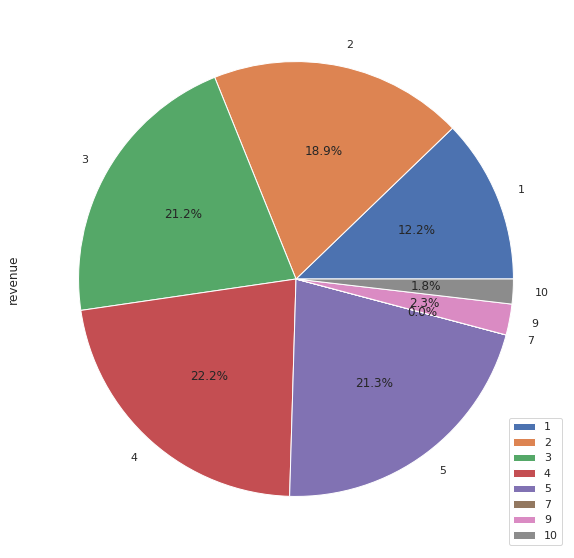

In [207]:
orders_total_sources.plot.pie(subplots=True, figsize=(10, 10), autopct='%1.1f%%');

Только рекламные источники 1 и 2 принесли денег больше чем было на них затрачено. Источник 3 показал свою особенную неэффективность - на него потратили почти в 3 раза больше чем он принес. В источник 7 ничего не инвестировали и тем не менее он все равно принес какие-то деньги. Можно сделать вывод, что это источник органического траффика.

**Сколько денег потратили по времени?**

In [208]:
costs.head(5)

,source_id,dt,costs
0,1,2017-06-01,75.20
1,1,2017-06-02,62.25
2,1,2017-06-03,36.53
3,1,2017-06-04,55.00
4,1,2017-06-05,57.08


In [209]:
costs['costs_month'] = costs['dt'].dt.strftime('%Y-%m')

In [210]:
spend_by_month = costs.groupby('costs_month').agg({'costs':'sum'}).reset_index()
spend_by_month

,costs_month,costs
0,2017-06,18015.00
1,2017-07,18240.59
2,2017-08,14790.54
3,2017-09,24368.91
4,2017-10,36322.88
5,2017-11,37907.88
6,2017-12,38315.35
7,2018-01,33518.52
8,2018-02,32723.03
9,2018-03,30415.27


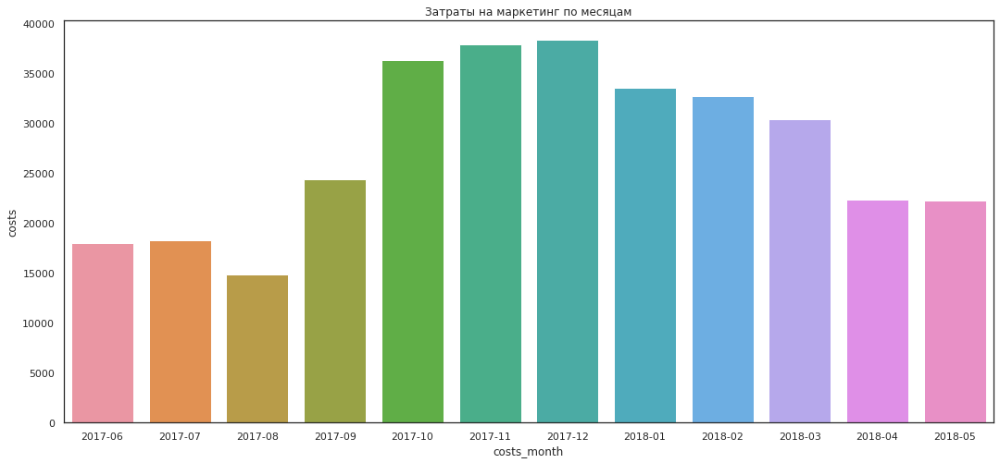

In [211]:
plt.figure(figsize=(18,8))
plt.title('Затраты на маркетинг по месяцам')
sns.barplot(x='costs_month', y='costs', data=spend_by_month);

Данный график очень хорошо коррелируется со статистикой посещений нашего сервиса, который мы выводили ранее. Больше расходов на рекламу = больше посещений.
Но посещения не равны покупкам. Можем проверить распределение доходов по месяцам и сравнить динамику между расходами и доходами:

In [212]:
old_orders['order_month'] = old_orders['order_date'].astype('datetime64[M]')
old_orders['order_month'] = old_orders['order_month'].dt.strftime('%Y-%m')
old_orders

,order_date,revenue,uid,first_order_day,device,session_end,source_id,session_start,false_session,first_activity_date,order_month
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-06-01 00:10:00,desktop,2017-06-01 00:11:00,1,2017-06-01 00:09:00,00:02:00,2017-06-01 00:09:00,2017-06
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-06-01 00:25:00,desktop,2017-06-01 00:25:00,2,2017-06-01 00:14:00,00:11:00,2017-06-01 00:14:00,2017-06
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-06-01 00:27:00,desktop,2017-06-01 00:34:00,2,2017-06-01 00:25:00,00:09:00,2017-06-01 00:25:00,2017-06
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-06-01 00:29:00,desktop,2017-06-01 00:33:00,2,2017-06-01 00:14:00,00:19:00,2017-06-01 00:14:00,2017-06
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-06-01 07:58:00,desktop,2017-06-01 07:59:00,3,2017-06-01 07:31:00,00:28:00,2017-06-01 07:31:00,2017-06
...,...,...,...,...,...,...,...,...,...,...,...
50410,2018-05-31 23:50:00,4.64,12296626599487328624,2018-05-31 23:50:00,touch,2018-05-31 09:12:00,4,2018-05-31 09:11:00,00:01:00,2018-05-31 09:11:00,2018-05
50411,2018-05-31 23:50:00,5.80,11369640365507475976,2018-05-31 23:50:00,desktop,2018-05-31 23:55:00,10,2018-05-31 23:05:00,00:50:00,2018-05-31 23:05:00,2018-05
50412,2018-05-31 23:54:00,0.30,1786462140797698849,2018-05-31 23:54:00,desktop,2018-05-31 23:55:00,3,2018-05-31 23:52:00,00:03:00,2018-05-31 23:52:00,2018-05
50413,2018-05-31 23:56:00,3.67,3993697860786194247,2018-05-31 23:56:00,desktop,2017-10-23 12:36:00,3,2017-10-23 12:32:00,00:04:00,2017-10-23 12:32:00,2018-05


In [213]:
profit_by_month = old_orders.groupby('order_month').agg({'revenue':'sum'}).reset_index()
profit_by_month

,order_month,revenue
0,2017-06,9557.49
1,2017-07,12539.47
2,2017-08,8758.78
3,2017-09,18345.51
4,2017-10,27987.70
5,2017-11,27069.93
6,2017-12,36388.60
7,2018-01,19417.13
8,2018-02,25560.54
9,2018-03,28834.59


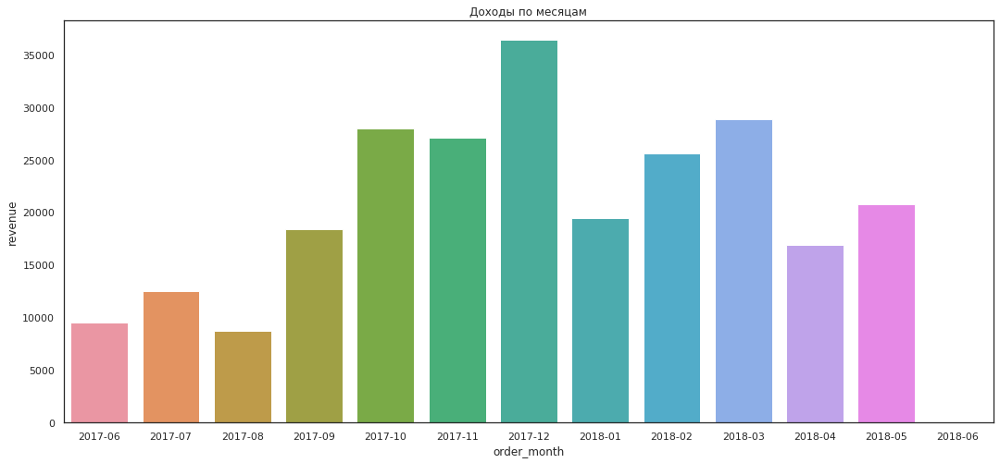

In [214]:
plt.figure(figsize=(18,8))
plt.title('Доходы по месяцам')
sns.barplot(x='order_month', y='revenue', data=profit_by_month);

Из сравнения видно, что увеличение бюджета на рекламу не всегда прямо пропорционально активности покупателей.

**Сколько стоило привлечение одного покупателя из каждого источника?**

Выделим первый день посещения сервиса:

In [215]:
visits['first_activity_day'] = visits['first_activity_date'].astype('datetime64[D]')
visits

,device,session_end,source_id,session_start,uid,false_session,session_year,session_month,session_week,session_date,first_activity_date,activity_week,first_activity_week,cohort_lifetime,first_activity_day
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,1080,2017,12,51,2017-12-20,2017-12-20,2017-12-18,2017-12-18,0,2017-12-20
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,1680,2018,2,8,2018-02-19,2018-02-19,2018-02-19,2018-02-19,0,2018-02-19
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,1440,2018,5,20,2018-05-20,2018-03-09,2018-05-14,2018-03-05,10,2018-03-09
5,desktop,2017-09-03 21:36:00,5,2017-09-03 21:35:00,16007536194108375387,60,2017,9,35,2017-09-03,2017-09-03,2017-08-28,2017-08-28,0,2017-09-03
6,desktop,2018-01-30 12:09:00,1,2018-01-30 11:13:00,6661610529277171451,3360,2018,1,5,2018-01-30,2017-06-29,2018-01-29,2017-06-26,31,2017-06-29
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
359395,desktop,2017-07-29 19:07:19,2,2017-07-29 19:07:00,18363291481961487539,19,2017,7,30,2017-07-29,2017-07-29,2017-07-24,2017-07-24,0,2017-07-29
359396,touch,2018-01-25 17:38:19,1,2018-01-25 17:38:00,18370831553019119586,19,2018,1,4,2018-01-25,2018-01-25,2018-01-22,2018-01-22,0,2018-01-25
359397,desktop,2018-03-03 10:12:19,4,2018-03-03 10:12:00,18387297585500748294,19,2018,3,9,2018-03-03,2018-03-03,2018-02-26,2018-02-26,0,2018-03-03
359398,desktop,2017-11-02 10:12:19,5,2017-11-02 10:12:00,18388616944624776485,19,2017,11,44,2017-11-02,2017-11-02,2017-10-30,2017-10-30,0,2017-11-02


Оставим в таблице с посещениями только те, что завершились покупкой:

In [216]:
visits = visits.join(first_order_date,on='uid')


In [217]:
visits_cac = visits[~visits['first_order_day'].isna()].reset_index(drop=True)
visits_cac

,device,session_end,source_id,session_start,uid,false_session,session_year,session_month,session_week,session_date,first_activity_date,activity_week,first_activity_week,cohort_lifetime,first_activity_day,first_order_day
0,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,1440,2018,5,20,2018-05-20,2018-03-09,2018-05-14,2018-03-05,10,2018-03-09,2018-03-09 20:25:00
1,desktop,2017-09-03 21:36:00,5,2017-09-03 21:35:00,16007536194108375387,60,2017,9,35,2017-09-03,2017-09-03,2017-08-28,2017-08-28,0,2017-09-03,2017-09-04 12:46:00
2,desktop,2018-02-06 15:50:00,4,2018-02-06 15:45:00,8056418121947262981,300,2018,2,6,2018-02-06,2017-06-04,2018-02-05,2017-05-29,36,2017-06-04,2017-06-25 08:54:00
3,touch,2018-02-12 20:30:00,2,2018-02-12 19:24:00,18188358787673499603,3960,2018,2,7,2018-02-12,2018-02-12,2018-02-12,2018-02-12,0,2018-02-12,2018-02-12 19:48:00
4,desktop,2017-12-05 10:28:00,4,2017-12-05 10:21:00,2307401184189569202,420,2017,12,49,2017-12-05,2017-09-23,2017-12-04,2017-09-18,11,2017-09-23,2017-09-27 09:23:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91736,desktop,2017-07-29 19:07:19,2,2017-07-29 19:07:00,18363291481961487539,19,2017,7,30,2017-07-29,2017-07-29,2017-07-24,2017-07-24,0,2017-07-29,2017-07-29 19:07:00
91737,touch,2018-01-25 17:38:19,1,2018-01-25 17:38:00,18370831553019119586,19,2018,1,4,2018-01-25,2018-01-25,2018-01-22,2018-01-22,0,2018-01-25,2018-01-25 17:38:00
91738,desktop,2018-03-03 10:12:19,4,2018-03-03 10:12:00,18387297585500748294,19,2018,3,9,2018-03-03,2018-03-03,2018-02-26,2018-02-26,0,2018-03-03,2018-03-03 10:12:00
91739,desktop,2017-11-02 10:12:19,5,2017-11-02 10:12:00,18388616944624776485,19,2017,11,44,2017-11-02,2017-11-02,2017-10-30,2017-10-30,0,2017-11-02,2017-11-02 10:12:00


Сгруппируем количество уникальных посетителей по первому дню посещения сервиса и рекламному источнику:

In [218]:
visits_grouped = visits_cac.groupby(['first_activity_day', 'source_id'])['uid'].nunique().reset_index()
visits_grouped

,first_activity_day,source_id,uid
0,2017-06-01,1,59
1,2017-06-01,2,66
2,2017-06-01,3,85
3,2017-06-01,4,69
4,2017-06-01,5,59
...,...,...,...
2492,2018-05-31,3,69
2493,2018-05-31,4,56
2494,2018-05-31,5,28
2495,2018-05-31,9,1


Сгруппируем расходы по дате и рекламным источникам:

In [219]:
costs_grouped = costs.groupby(['dt', 'source_id'])['costs'].sum().reset_index()
costs_grouped

,dt,source_id,costs
0,2017-06-01,1,75.20
1,2017-06-01,2,132.56
2,2017-06-01,3,349.38
3,2017-06-01,4,76.74
4,2017-06-01,5,73.24
...,...,...,...
2537,2018-05-31,3,822.30
2538,2018-05-31,4,492.54
2539,2018-05-31,5,398.04
2540,2018-05-31,9,27.37


Объединим наши группировки:

In [220]:
visits_costs = visits_grouped.merge(costs_grouped, left_on=['first_activity_day','source_id']
                                    , right_on=['dt','source_id'], how = 'left')
visits_costs

,first_activity_day,source_id,uid,dt,costs
0,2017-06-01,1,59,2017-06-01,75.20
1,2017-06-01,2,66,2017-06-01,132.56
2,2017-06-01,3,85,2017-06-01,349.38
3,2017-06-01,4,69,2017-06-01,76.74
4,2017-06-01,5,59,2017-06-01,73.24
...,...,...,...,...,...
2492,2018-05-31,3,69,2018-05-31,822.30
2493,2018-05-31,4,56,2018-05-31,492.54
2494,2018-05-31,5,28,2018-05-31,398.04
2495,2018-05-31,9,1,2018-05-31,27.37


Рассчитаем стоимость привлечения пользователя (CAC):

In [221]:
visits_costs['cac'] = visits_costs['costs'] / visits_costs['uid']
visits_costs

,first_activity_day,source_id,uid,dt,costs,cac
0,2017-06-01,1,59,2017-06-01,75.20,1.274576
1,2017-06-01,2,66,2017-06-01,132.56,2.008485
2,2017-06-01,3,85,2017-06-01,349.38,4.110353
3,2017-06-01,4,69,2017-06-01,76.74,1.112174
4,2017-06-01,5,59,2017-06-01,73.24,1.241356
...,...,...,...,...,...,...
2492,2018-05-31,3,69,2018-05-31,822.30,11.917391
2493,2018-05-31,4,56,2018-05-31,492.54,8.795357
2494,2018-05-31,5,28,2018-05-31,398.04,14.215714
2495,2018-05-31,9,1,2018-05-31,27.37,27.370000


Сгруппируем CAC по рекламным источникам:

In [222]:
cac_by_source = visits_costs.groupby('source_id')['cac'].mean().reset_index()

In [223]:
cac_by_source.sort_values(by = 'cac',ascending=False)

,source_id,cac
2,3,12.174176
1,2,7.892086
4,5,5.892702
7,10,5.384703
3,4,5.063513
0,1,3.587880
6,9,3.427388
5,7,NaN


Посмотрим на график:

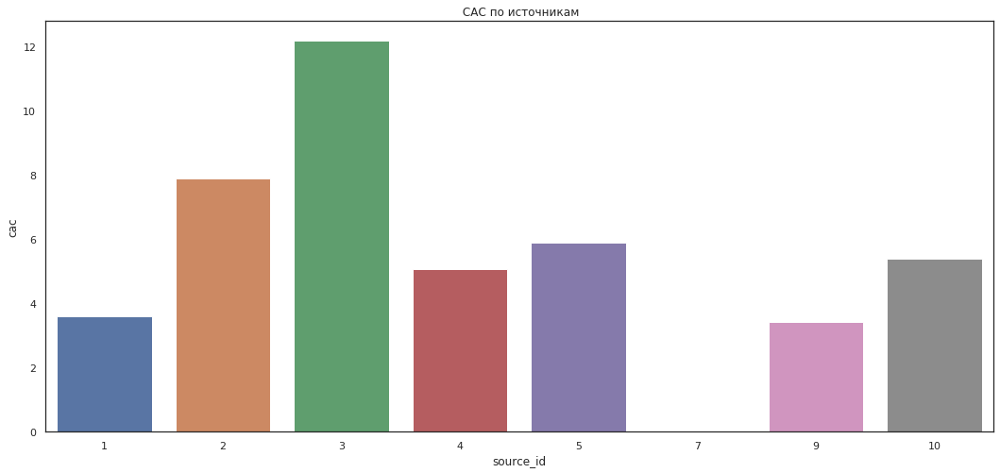

In [224]:
plt.figure(figsize=(18,8))
plt.title(' CAC по источникам')
sns.barplot(x='source_id', y='cac', data=cac_by_source);

Рекламный источник 3 оказался и самым дорогим по стоимости привлечения пользователей (12,2). Источник 2 хоть и эффективен в некоторых метриках, но и он достаточно дорог (7,9). А вот источник 1 не только эффективен, но и почти самый дешевый в привлечении пользователей.

### На сколько окупились расходы? (ROI)

Для определения окупаемости (ROI, в нашем случае ROMI) мы будем использовать функции. В самих функцих потребуется выделить пользовательские когорты, добавить age, найти LTV, CAC, ROI и сгруппировать все данные.

In [225]:
orders

,activity_date,revenue,uid,first_order_date,purchase_month,first_purchase_month
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-06-01 00:10:00,2017-06-01,2017-06-01
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-06-01 00:25:00,2017-06-01,2017-06-01
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-06-01 00:27:00,2017-06-01,2017-06-01
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-06-01 00:29:00,2017-06-01,2017-06-01
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-06-01 07:58:00,2017-06-01,2017-06-01
...,...,...,...,...,...,...
50410,2018-05-31 23:50:00,4.64,12296626599487328624,2018-05-31 23:50:00,2018-05-01,2018-05-01
50411,2018-05-31 23:50:00,5.80,11369640365507475976,2018-05-31 23:50:00,2018-05-01,2018-05-01
50412,2018-05-31 23:54:00,0.30,1786462140797698849,2018-05-31 23:54:00,2018-05-01,2018-05-01
50413,2018-05-31 23:56:00,3.67,3993697860786194247,2018-05-31 23:56:00,2018-05-01,2018-05-01


In [226]:
cohort_sizes_all = orders.groupby('first_purchase_month').agg({'uid': 'nunique'}).reset_index()
cohort_sizes_all

,first_purchase_month,uid
0,2017-06-01,2023
1,2017-07-01,1923
2,2017-08-01,1370
3,2017-09-01,2581
4,2017-10-01,4340
5,2017-11-01,4081
6,2017-12-01,4383
7,2018-01-01,3373
8,2018-02-01,3651
9,2018-03-01,3533


In [227]:
 cohort_sizes_all.columns = ['first_purchase_month', 'n_buyers']

In [228]:
cohorts_all = orders.groupby(['first_purchase_month','purchase_month']).agg({'revenue': 'sum'}).reset_index()
cohorts_all

,first_purchase_month,purchase_month,revenue
0,2017-06-01,2017-06-01,9557.49
1,2017-06-01,2017-07-01,981.82
2,2017-06-01,2017-08-01,885.34
3,2017-06-01,2017-09-01,1931.30
4,2017-06-01,2017-10-01,2068.58
...,...,...,...
74,2018-03-01,2018-05-01,1114.87
75,2018-04-01,2018-04-01,10600.69
76,2018-04-01,2018-05-01,1209.92
77,2018-05-01,2018-05-01,13925.76


In [229]:
report_all = pd.merge(cohort_sizes_all, cohorts_all, on='first_purchase_month')
report_all

,first_purchase_month,n_buyers,purchase_month,revenue
0,2017-06-01,2023,2017-06-01,9557.49
1,2017-06-01,2023,2017-07-01,981.82
2,2017-06-01,2023,2017-08-01,885.34
3,2017-06-01,2023,2017-09-01,1931.30
4,2017-06-01,2023,2017-10-01,2068.58
...,...,...,...,...
74,2018-03-01,3533,2018-05-01,1114.87
75,2018-04-01,2276,2018-04-01,10600.69
76,2018-04-01,2276,2018-05-01,1209.92
77,2018-05-01,2988,2018-05-01,13925.76


In [230]:
report_all['age'] = (report_all['purchase_month'] - report_all['first_purchase_month']) / np.timedelta64(1, 'M')
report_all['age'] = report_all['age'].round().astype('int')
report_all

,first_purchase_month,n_buyers,purchase_month,revenue,age
0,2017-06-01,2023,2017-06-01,9557.49,0
1,2017-06-01,2023,2017-07-01,981.82,1
2,2017-06-01,2023,2017-08-01,885.34,2
3,2017-06-01,2023,2017-09-01,1931.30,3
4,2017-06-01,2023,2017-10-01,2068.58,4
...,...,...,...,...,...
74,2018-03-01,3533,2018-05-01,1114.87,2
75,2018-04-01,2276,2018-04-01,10600.69,0
76,2018-04-01,2276,2018-05-01,1209.92,1
77,2018-05-01,2988,2018-05-01,13925.76,0


In [231]:
report_all['ltv'] = report_all['revenue'] / report_all['n_buyers']
report_all

,first_purchase_month,n_buyers,purchase_month,revenue,age,ltv
0,2017-06-01,2023,2017-06-01,9557.49,0,4.724414
1,2017-06-01,2023,2017-07-01,981.82,1,0.485329
2,2017-06-01,2023,2017-08-01,885.34,2,0.437637
3,2017-06-01,2023,2017-09-01,1931.30,3,0.954671
4,2017-06-01,2023,2017-10-01,2068.58,4,1.022531
...,...,...,...,...,...,...
74,2018-03-01,3533,2018-05-01,1114.87,2,0.315559
75,2018-04-01,2276,2018-04-01,10600.69,0,4.657597
76,2018-04-01,2276,2018-05-01,1209.92,1,0.531599
77,2018-05-01,2988,2018-05-01,13925.76,0,4.660562


In [232]:
report_all['first_purchase_month'] = report_all['first_purchase_month'].dt.strftime('%Y-%m')

In [233]:
monthly_costs_all = costs.groupby('costs_month')['costs'].sum().reset_index()
monthly_costs_all

,costs_month,costs
0,2017-06,18015.00
1,2017-07,18240.59
2,2017-08,14790.54
3,2017-09,24368.91
4,2017-10,36322.88
5,2017-11,37907.88
6,2017-12,38315.35
7,2018-01,33518.52
8,2018-02,32723.03
9,2018-03,30415.27


In [234]:
report_new_all = pd.merge(report_all, monthly_costs_all, left_on='first_purchase_month', right_on='costs_month')
report_new_all

,first_purchase_month,n_buyers,purchase_month,revenue,age,ltv,costs_month,costs
0,2017-06,2023,2017-06-01,9557.49,0,4.724414,2017-06,18015.00
1,2017-06,2023,2017-07-01,981.82,1,0.485329,2017-06,18015.00
2,2017-06,2023,2017-08-01,885.34,2,0.437637,2017-06,18015.00
3,2017-06,2023,2017-09-01,1931.30,3,0.954671,2017-06,18015.00
4,2017-06,2023,2017-10-01,2068.58,4,1.022531,2017-06,18015.00
...,...,...,...,...,...,...,...,...
73,2018-03,3533,2018-04-01,1063.05,1,0.300892,2018-03,30415.27
74,2018-03,3533,2018-05-01,1114.87,2,0.315559,2018-03,30415.27
75,2018-04,2276,2018-04-01,10600.69,0,4.657597,2018-04,22289.38
76,2018-04,2276,2018-05-01,1209.92,1,0.531599,2018-04,22289.38


In [235]:
report_new_all['cac'] = report_new_all['costs'] / report_new_all['n_buyers']
report_new_all['roi'] = report_new_all['ltv'] / report_new_all['cac']
report_new_all

,first_purchase_month,n_buyers,purchase_month,revenue,age,ltv,costs_month,costs,cac,roi
0,2017-06,2023,2017-06-01,9557.49,0,4.724414,2017-06,18015.00,8.905091,0.530530
1,2017-06,2023,2017-07-01,981.82,1,0.485329,2017-06,18015.00,8.905091,0.054500
2,2017-06,2023,2017-08-01,885.34,2,0.437637,2017-06,18015.00,8.905091,0.049145
3,2017-06,2023,2017-09-01,1931.30,3,0.954671,2017-06,18015.00,8.905091,0.107205
4,2017-06,2023,2017-10-01,2068.58,4,1.022531,2017-06,18015.00,8.905091,0.114825
...,...,...,...,...,...,...,...,...,...,...
73,2018-03,3533,2018-04-01,1063.05,1,0.300892,2018-03,30415.27,8.608907,0.034951
74,2018-03,3533,2018-05-01,1114.87,2,0.315559,2018-03,30415.27,8.608907,0.036655
75,2018-04,2276,2018-04-01,10600.69,0,4.657597,2018-04,22289.38,9.793225,0.475594
76,2018-04,2276,2018-05-01,1209.92,1,0.531599,2018-04,22289.38,9.793225,0.054282


In [236]:
report_pivot_all = report_new_all.pivot_table(
        index='first_purchase_month', 
        columns='age', 
        values='roi', 
        aggfunc='mean')
report_pivot_all

age,0,1,2,3,4,5,6,7,8,9,10,11
first_purchase_month,,,,,,,,,,,,
2017-06,0.530530,0.054500,0.049145,0.107205,0.114825,0.082593,0.106730,0.065310,0.062123,0.068027,0.064150,0.028844
2017-07,0.633623,0.035339,0.065735,0.037845,0.018638,0.016451,0.012673,0.014951,0.016998,0.015513,0.016412,NaN
2017-08,0.488747,0.043719,0.042468,0.036243,0.045762,0.026263,0.019513,0.037515,0.027067,0.017412,NaN,NaN
2017-09,0.597833,0.118368,0.055174,0.421091,0.042425,0.068533,0.074310,0.025753,0.019489,NaN,NaN,NaN
2017-10,0.597866,0.064015,0.022869,0.018776,0.018109,0.014381,0.010134,0.013797,NaN,NaN,NaN,NaN
2017-11,0.554931,0.042980,0.021483,0.034983,0.015934,0.005800,0.012373,NaN,NaN,NaN,NaN,NaN
2017-12,0.542015,0.029785,0.105824,0.121860,0.035797,0.038670,NaN,NaN,NaN,NaN,NaN,NaN
2018-01,0.416173,0.029662,0.030620,0.014368,0.006309,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-02,0.463807,0.031048,0.008760,0.008272,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [237]:
output_cumsum_all = report_pivot_all.cumsum(axis=1).round(2)
output_cumsum_all

age,0,1,2,3,4,5,6,7,8,9,10,11
first_purchase_month,,,,,,,,,,,,
2017-06,0.53,0.59,0.63,0.74,0.86,0.94,1.05,1.11,1.17,1.24,1.31,1.33
2017-07,0.63,0.67,0.73,0.77,0.79,0.81,0.82,0.84,0.85,0.87,0.88,NaN
2017-08,0.49,0.53,0.57,0.61,0.66,0.68,0.70,0.74,0.77,0.78,NaN,NaN
2017-09,0.60,0.72,0.77,1.19,1.23,1.30,1.38,1.40,1.42,NaN,NaN,NaN
2017-10,0.60,0.66,0.68,0.70,0.72,0.74,0.75,0.76,NaN,NaN,NaN,NaN
2017-11,0.55,0.60,0.62,0.65,0.67,0.68,0.69,NaN,NaN,NaN,NaN,NaN
2017-12,0.54,0.57,0.68,0.80,0.84,0.87,NaN,NaN,NaN,NaN,NaN,NaN
2018-01,0.42,0.45,0.48,0.49,0.50,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-02,0.46,0.49,0.50,0.51,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


**ROI по когортам - все источники и устройства:**

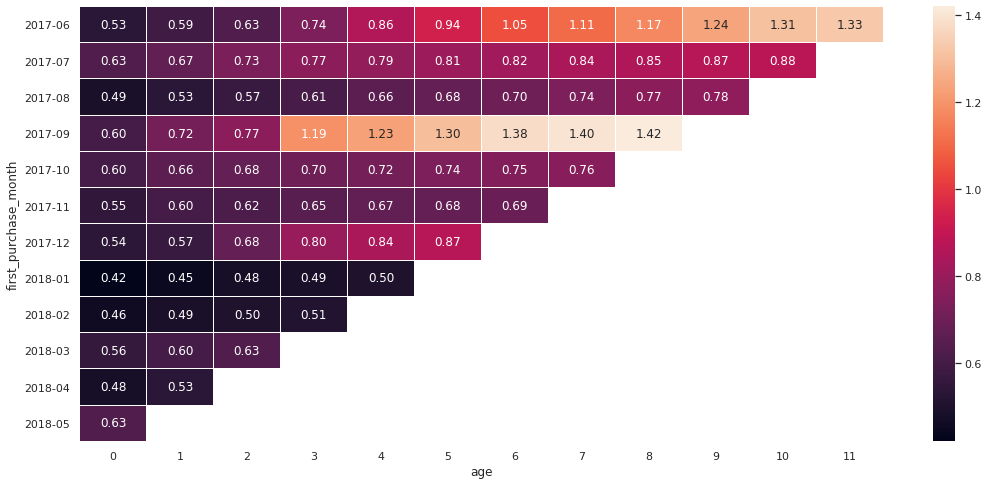

In [238]:
plt.figure(figsize=(18,8))
sns.heatmap(output_cumsum_all, annot=True, fmt='.2f', linewidths=0.1, linecolor='white');

In [239]:
output_mean_all = report_pivot_all.cumsum(axis=1).mean(axis=0)
output_mean_all

age
0     0.540816
1     0.581985
2     0.631069
3     0.719740
4     0.782946
5     0.859876
6     0.896819
7     0.969951
8     1.053871
9     0.964488
10    1.094658
11    1.333982
dtype: float64

В среднем окупаемость происходит на **9 месяц** после начала инвестиций за данный период.

In [240]:
old_orders['first_order_month'] = old_orders['first_order_day'].astype('datetime64[M]')
old_orders['first_order_month'] = old_orders['first_order_month'].dt.strftime('%Y-%m')
old_orders['first_order_month'] = pd.to_datetime(old_orders['first_order_month'])
old_orders['order_month'] = pd.to_datetime(old_orders['order_month'])
old_orders

,order_date,revenue,uid,first_order_day,device,session_end,source_id,session_start,false_session,first_activity_date,order_month,first_order_month
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-06-01 00:10:00,desktop,2017-06-01 00:11:00,1,2017-06-01 00:09:00,00:02:00,2017-06-01 00:09:00,2017-06-01,2017-06-01
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-06-01 00:25:00,desktop,2017-06-01 00:25:00,2,2017-06-01 00:14:00,00:11:00,2017-06-01 00:14:00,2017-06-01,2017-06-01
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-06-01 00:27:00,desktop,2017-06-01 00:34:00,2,2017-06-01 00:25:00,00:09:00,2017-06-01 00:25:00,2017-06-01,2017-06-01
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-06-01 00:29:00,desktop,2017-06-01 00:33:00,2,2017-06-01 00:14:00,00:19:00,2017-06-01 00:14:00,2017-06-01,2017-06-01
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-06-01 07:58:00,desktop,2017-06-01 07:59:00,3,2017-06-01 07:31:00,00:28:00,2017-06-01 07:31:00,2017-06-01,2017-06-01
...,...,...,...,...,...,...,...,...,...,...,...,...
50410,2018-05-31 23:50:00,4.64,12296626599487328624,2018-05-31 23:50:00,touch,2018-05-31 09:12:00,4,2018-05-31 09:11:00,00:01:00,2018-05-31 09:11:00,2018-05-01,2018-05-01
50411,2018-05-31 23:50:00,5.80,11369640365507475976,2018-05-31 23:50:00,desktop,2018-05-31 23:55:00,10,2018-05-31 23:05:00,00:50:00,2018-05-31 23:05:00,2018-05-01,2018-05-01
50412,2018-05-31 23:54:00,0.30,1786462140797698849,2018-05-31 23:54:00,desktop,2018-05-31 23:55:00,3,2018-05-31 23:52:00,00:03:00,2018-05-31 23:52:00,2018-05-01,2018-05-01
50413,2018-05-31 23:56:00,3.67,3993697860786194247,2018-05-31 23:56:00,desktop,2017-10-23 12:36:00,3,2017-10-23 12:32:00,00:04:00,2017-10-23 12:32:00,2018-05-01,2018-05-01


In [241]:
def roi_source(source_id):

    source = source_id
    
    orders_source = old_orders[old_orders['source_id'] == source]
    
    cohort_sizes_source = orders_source.groupby('first_order_month').agg({'uid': 'nunique'}).reset_index()

    cohort_sizes_source.columns = ['first_order_month', 'n_buyers']

    

    cohorts_source = orders_source.groupby(['first_order_month','order_month']).agg({'revenue': 'sum'}).reset_index()

    
    report_source = pd.merge(cohort_sizes_source, cohorts_source, on='first_order_month')

    report_source['age'] = (report_source['order_month'] - report_source['first_order_month']) / np.timedelta64(1, 'M')

    report_source['age'] = report_source['age'].round().astype('int')

    report_source['ltv'] = report_source['revenue'] / report_source['n_buyers']

    report_source['first_order_month'] = report_source['first_order_month'].dt.strftime('%Y-%m')

    costs_source = costs[costs['source_id'] == source]
    
    monthly_costs_source = costs_source.groupby('costs_month')['costs'].sum().reset_index()
    
    report_new_source = pd.merge(report_source, monthly_costs_source, left_on='first_order_month', right_on='costs_month')
    
    report_new_source['cac'] = report_new_source['costs'] / report_new_source['n_buyers']
    
    report_new_source['roi'] = report_new_source['ltv'] / report_new_source['cac']
    
    report_pivot_source = report_new_source.pivot_table(
        index='first_order_month', 
        columns='age', 
        values='roi', 
        aggfunc='mean')
    
    output_cumsum_source = report_pivot_source.cumsum(axis=1).round(2)
    
    print('ROI по когортам - рекламный источник', source)
    
    plt.figure(figsize=(18,8))
    sns.heatmap(output_cumsum_source, annot=True, fmt='.2f', linewidths=0.1, linecolor='white');
    
    output_mean_source = report_pivot_source.cumsum(axis=1).mean(axis=0)
    
    print(output_mean_source)

In [242]:
# orders_source_1 = old_orders[old_orders['source_id'] == 1]
# orders_source_1

In [243]:
old_orders

,order_date,revenue,uid,first_order_day,device,session_end,source_id,session_start,false_session,first_activity_date,order_month,first_order_month
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-06-01 00:10:00,desktop,2017-06-01 00:11:00,1,2017-06-01 00:09:00,00:02:00,2017-06-01 00:09:00,2017-06-01,2017-06-01
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-06-01 00:25:00,desktop,2017-06-01 00:25:00,2,2017-06-01 00:14:00,00:11:00,2017-06-01 00:14:00,2017-06-01,2017-06-01
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-06-01 00:27:00,desktop,2017-06-01 00:34:00,2,2017-06-01 00:25:00,00:09:00,2017-06-01 00:25:00,2017-06-01,2017-06-01
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-06-01 00:29:00,desktop,2017-06-01 00:33:00,2,2017-06-01 00:14:00,00:19:00,2017-06-01 00:14:00,2017-06-01,2017-06-01
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-06-01 07:58:00,desktop,2017-06-01 07:59:00,3,2017-06-01 07:31:00,00:28:00,2017-06-01 07:31:00,2017-06-01,2017-06-01
...,...,...,...,...,...,...,...,...,...,...,...,...
50410,2018-05-31 23:50:00,4.64,12296626599487328624,2018-05-31 23:50:00,touch,2018-05-31 09:12:00,4,2018-05-31 09:11:00,00:01:00,2018-05-31 09:11:00,2018-05-01,2018-05-01
50411,2018-05-31 23:50:00,5.80,11369640365507475976,2018-05-31 23:50:00,desktop,2018-05-31 23:55:00,10,2018-05-31 23:05:00,00:50:00,2018-05-31 23:05:00,2018-05-01,2018-05-01
50412,2018-05-31 23:54:00,0.30,1786462140797698849,2018-05-31 23:54:00,desktop,2018-05-31 23:55:00,3,2018-05-31 23:52:00,00:03:00,2018-05-31 23:52:00,2018-05-01,2018-05-01
50413,2018-05-31 23:56:00,3.67,3993697860786194247,2018-05-31 23:56:00,desktop,2017-10-23 12:36:00,3,2017-10-23 12:32:00,00:04:00,2017-10-23 12:32:00,2018-05-01,2018-05-01


In [244]:
buyers = old_orders.groupby('source_id').agg({'uid': 'nunique'}).reset_index()
buyers.columns = ['source', 'n_buyers']
buyers = buyers.drop(buyers.index[[5]]).reset_index(drop=True)
buyers

,source,n_buyers
0,1,2964
1,2,3515
2,3,10248
3,4,10113
4,5,6847
5,9,1087
6,10,1306


In [245]:
revenue_table = old_orders.groupby('source_id').agg({'revenue': 'sum'}).reset_index()
revenue_table.columns = ['source', 'revenue']
revenue_table = revenue_table.drop(revenue_table.index[[5]]).reset_index(drop=True)
revenue_table

,source,revenue
0,1,30537.37
1,2,47265.19
2,3,53061.62
3,4,55601.15
4,5,53352.23
5,9,5746.85
6,10,4611.73


In [246]:
costs_table = costs.groupby('source_id').agg({'costs': 'sum'}).reset_index()
costs_table.columns = ['source', 'costs']
costs_table

,source,costs
0,1,20833.27
1,2,42806.04
2,3,141321.63
3,4,61073.60
4,5,51757.10
5,9,5517.49
6,10,5822.49


In [247]:
total_table = pd.merge(buyers, revenue_table, on='source')
total_table = pd.merge(total_table, costs_table, on='source')
total_table

,source,n_buyers,revenue,costs
0,1,2964,30537.37,20833.27
1,2,3515,47265.19,42806.04
2,3,10248,53061.62,141321.63
3,4,10113,55601.15,61073.60
4,5,6847,53352.23,51757.10
5,9,1087,5746.85,5517.49
6,10,1306,4611.73,5822.49


In [248]:
columns = ['source','ltv за 6 месяцев']
ltv_value = [[1, LTV_mean_s1.round(2)], 
             [2, LTV_mean_s2.round(2)], 
             [3, LTV_mean_s3.round(2)], 
             [4, LTV_mean_s4.round(2)], 
             [5, LTV_mean_s5.round(2)], 
             [9, LTV_mean_s9.round(2)], 
             [10, LTV_mean_s10.round(2)]]
ltv_data = pd.DataFrame(data = ltv_value , columns = columns)
ltv_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7 entries, 0 to 6
Data columns (total 2 columns):
source              7 non-null int64
ltv за 6 месяцев    7 non-null float64
dtypes: float64(1), int64(1)
memory usage: 240.0 bytes


In [249]:
full_table = total_table.merge(ltv_data, on='source')
full_table
# full_table = pd.concat([total_table, ltv_value], axis=1, join='inner')
# full_table

,source,n_buyers,revenue,costs,ltv за 6 месяцев
0,1,2964,30537.37,20833.27,11.80
1,2,3515,47265.19,42806.04,11.00
2,3,10248,53061.62,141321.63,5.11
3,4,10113,55601.15,61073.60,5.83
4,5,6847,53352.23,51757.10,8.85
5,9,1087,5746.85,5517.49,5.37
6,10,1306,4611.73,5822.49,3.15


In [250]:
full_table['cac'] = full_table['costs'] / full_table['n_buyers']
full_table['roi'] = full_table['ltv за 6 месяцев'] / full_table['cac']
full_table

,source,n_buyers,revenue,costs,ltv за 6 месяцев,cac,roi
0,1,2964,30537.37,20833.27,11.80,7.028769,1.678815
1,2,3515,47265.19,42806.04,11.00,12.178105,0.903260
2,3,10248,53061.62,141321.63,5.11,13.790167,0.370554
3,4,10113,55601.15,61073.60,5.83,6.039118,0.965373
4,5,6847,53352.23,51757.10,8.85,7.559092,1.170776
5,9,1087,5746.85,5517.49,5.37,5.075888,1.057943
6,10,1306,4611.73,5822.49,3.15,4.458262,0.706553


ROI по когортам - рекламный источник 1
age
0     0.908490
1     1.060863
2     1.275696
3     1.352335
4     1.543212
5     1.729715
6     1.974708
7     2.262957
8     2.712351
9     3.171755
10    3.782918
11    4.691270
dtype: float64


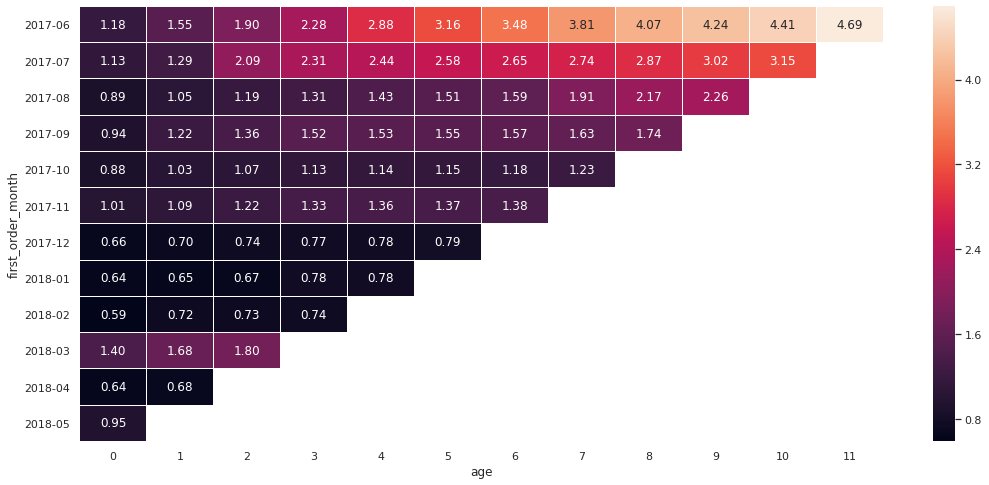

In [251]:
roi_source(1)

In [252]:
report

,first_purchase_month,n_buyers,purchase_month,revenue,age,ltv
0,2017-06-01,2023,2017-06-01,9557.49,0,4.724414
1,2017-06-01,2023,2017-07-01,981.82,1,0.485329
2,2017-06-01,2023,2017-08-01,885.34,2,0.437637
3,2017-06-01,2023,2017-09-01,1931.30,3,0.954671
4,2017-06-01,2023,2017-10-01,2068.58,4,1.022531
...,...,...,...,...,...,...
74,2018-03-01,3533,2018-05-01,1114.87,2,0.315559
75,2018-04-01,2276,2018-04-01,10600.69,0,4.657597
76,2018-04-01,2276,2018-05-01,1209.92,1,0.531599
77,2018-05-01,2988,2018-05-01,13925.76,0,4.660562


ROI по когортам - рекламный источник 2
age
0     0.557785
1     0.628428
2     0.777935
3     0.939890
4     1.085528
5     1.229073
6     1.028975
7     1.138242
8     1.217428
9     0.993856
10    1.293410
11    1.596268
dtype: float64


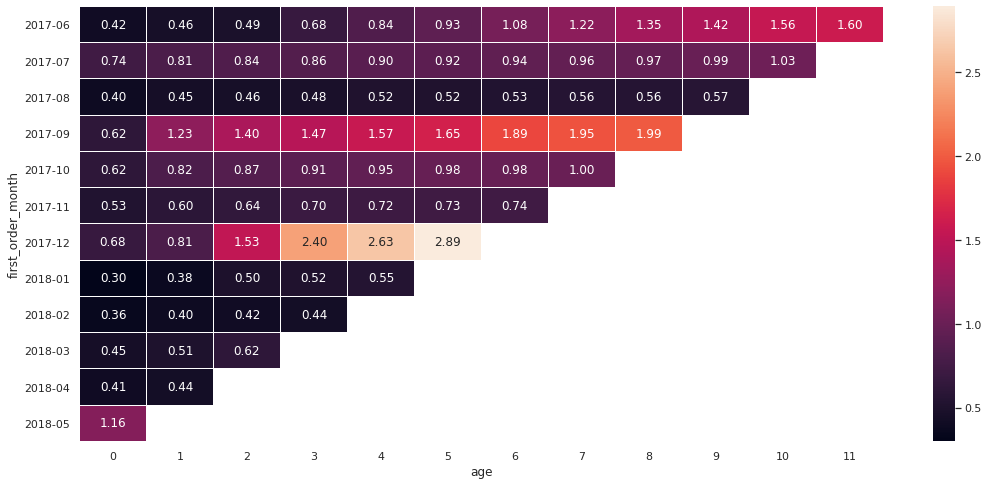

In [253]:
roi_source(2)

In [254]:
old_orders

,order_date,revenue,uid,first_order_day,device,session_end,source_id,session_start,false_session,first_activity_date,order_month,first_order_month
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-06-01 00:10:00,desktop,2017-06-01 00:11:00,1,2017-06-01 00:09:00,00:02:00,2017-06-01 00:09:00,2017-06-01,2017-06-01
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-06-01 00:25:00,desktop,2017-06-01 00:25:00,2,2017-06-01 00:14:00,00:11:00,2017-06-01 00:14:00,2017-06-01,2017-06-01
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-06-01 00:27:00,desktop,2017-06-01 00:34:00,2,2017-06-01 00:25:00,00:09:00,2017-06-01 00:25:00,2017-06-01,2017-06-01
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-06-01 00:29:00,desktop,2017-06-01 00:33:00,2,2017-06-01 00:14:00,00:19:00,2017-06-01 00:14:00,2017-06-01,2017-06-01
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-06-01 07:58:00,desktop,2017-06-01 07:59:00,3,2017-06-01 07:31:00,00:28:00,2017-06-01 07:31:00,2017-06-01,2017-06-01
...,...,...,...,...,...,...,...,...,...,...,...,...
50410,2018-05-31 23:50:00,4.64,12296626599487328624,2018-05-31 23:50:00,touch,2018-05-31 09:12:00,4,2018-05-31 09:11:00,00:01:00,2018-05-31 09:11:00,2018-05-01,2018-05-01
50411,2018-05-31 23:50:00,5.80,11369640365507475976,2018-05-31 23:50:00,desktop,2018-05-31 23:55:00,10,2018-05-31 23:05:00,00:50:00,2018-05-31 23:05:00,2018-05-01,2018-05-01
50412,2018-05-31 23:54:00,0.30,1786462140797698849,2018-05-31 23:54:00,desktop,2018-05-31 23:55:00,3,2018-05-31 23:52:00,00:03:00,2018-05-31 23:52:00,2018-05-01,2018-05-01
50413,2018-05-31 23:56:00,3.67,3993697860786194247,2018-05-31 23:56:00,desktop,2017-10-23 12:36:00,3,2017-10-23 12:32:00,00:04:00,2017-10-23 12:32:00,2018-05-01,2018-05-01


ROI по когортам - рекламный источник 3
age
0     0.328732
1     0.350788
2     0.359714
3     0.372859
4     0.388048
5     0.407075
6     0.416814
7     0.435022
8     0.446746
9     0.429457
10    0.471682
11    0.464612
dtype: float64


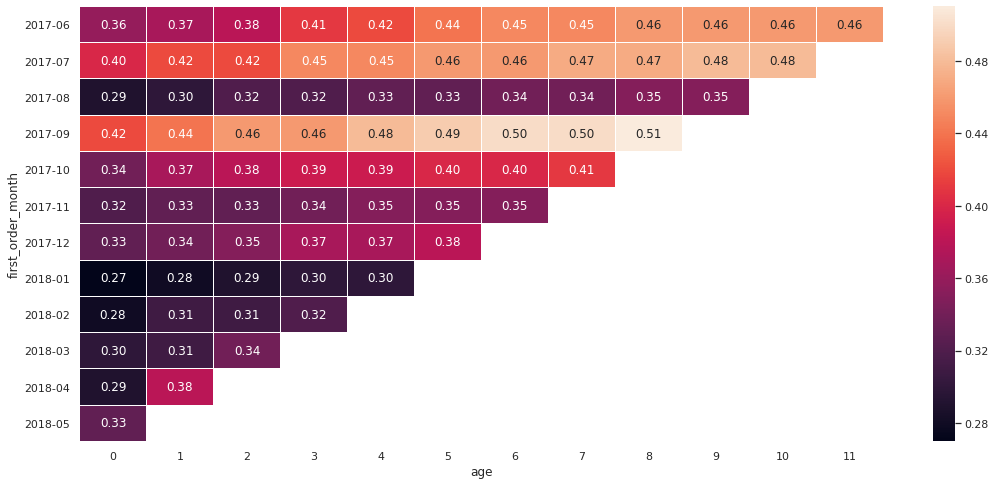

In [255]:
roi_source(3)

ROI по когортам - рекламный источник 4
age
0     0.739388
1     0.766972
2     0.779882
3     0.802998
4     0.832584
5     0.889613
6     0.972278
7     0.894904
8     0.894660
9     0.942544
10    1.158329
11    1.415702
dtype: float64


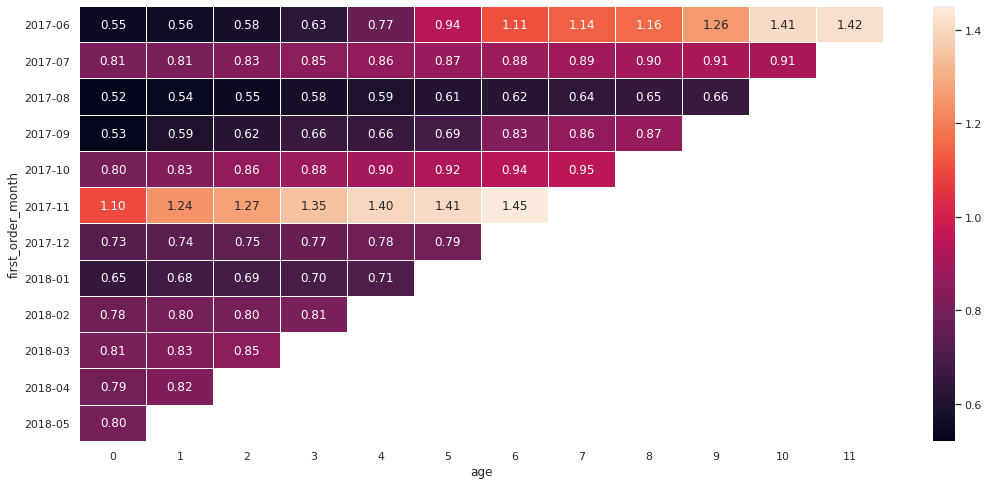

In [256]:
roi_source(4)

ROI по когортам - рекламный источник 5
age
0     0.660809
1     0.711727
2     0.768440
3     1.111803
4     1.239185
5     1.399898
6     1.570062
7     1.817152
8     2.068667
9     1.504991
10    1.466995
11    2.100271
dtype: float64


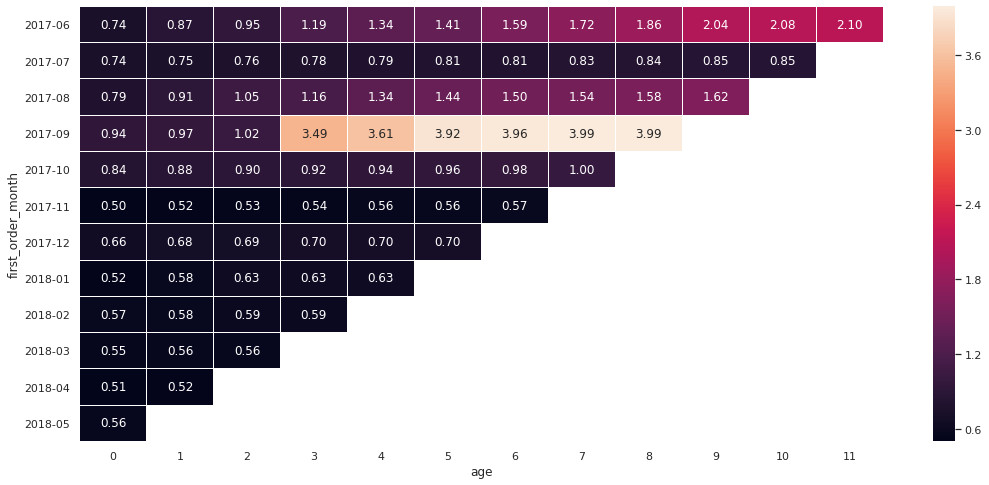

In [257]:
roi_source(5)

ROI по когортам - рекламный источник 9
age
0     0.768979
1     0.851536
2     0.954235
3     1.049840
4     1.093910
5     1.223630
6     1.336217
7     1.471618
8     1.578683
9     1.455783
10    1.473692
dtype: float64


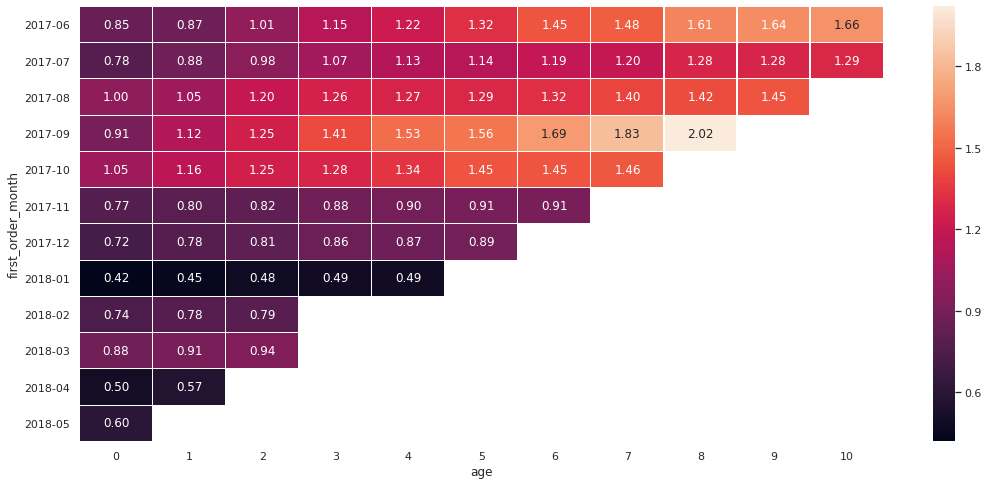

In [258]:
roi_source(9)

ROI по когортам - рекламный источник 10
age
0    0.721805
1    0.730790
2    0.811464
3    0.855115
4    0.723028
5    0.739900
6    0.854869
7    0.766940
8    0.834769
9    0.899557
dtype: float64


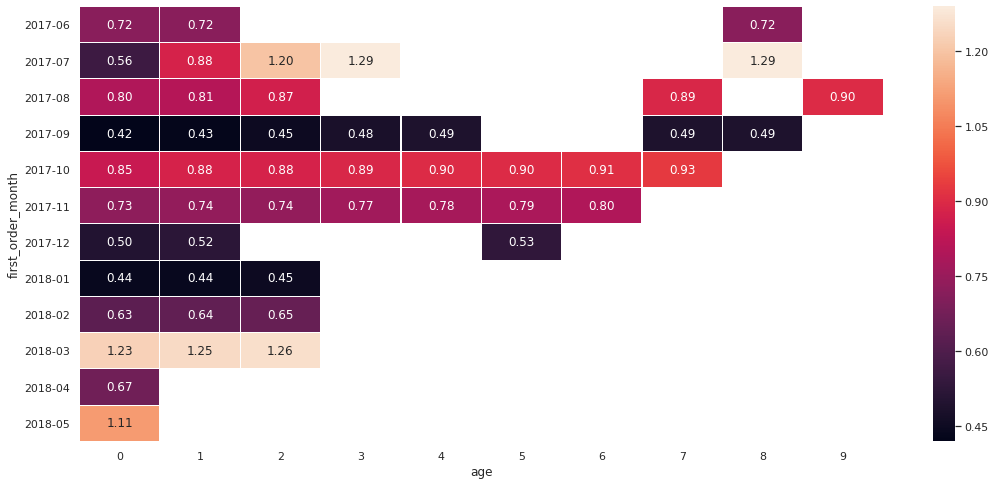

In [259]:
roi_source(10)

Рекламный источник 1 показывает свою эффективность. При инвестициях в него вложенное в среднем возвращается уже на 2 месяц. 5 и 9 источники идут на втором месте, окупая себя на 4 месяц. На третьем месте источник 2, он окупается на 5 месяц.

In [260]:
costs

,source_id,dt,costs,costs_month
0,1,2017-06-01,75.20,2017-06
1,1,2017-06-02,62.25,2017-06
2,1,2017-06-03,36.53,2017-06
3,1,2017-06-04,55.00,2017-06
4,1,2017-06-05,57.08,2017-06
...,...,...,...,...
2537,10,2018-05-27,9.92,2018-05
2538,10,2018-05-28,21.26,2018-05
2539,10,2018-05-29,11.32,2018-05
2540,10,2018-05-30,33.15,2018-05


In [261]:
costs_for_roi = costs.groupby('source_id').sum()
costs_for_roi

,costs
source_id,
1,20833.27
2,42806.04
3,141321.63
4,61073.60
5,51757.10
9,5517.49
10,5822.49


In [262]:
orders_for_roi = old_orders.groupby('source_id').sum()
orders_for_roi

,revenue,uid
source_id,,
1,30537.37,4.637019e+22
2,47265.19,5.634695e+22
3,53061.62,1.189061e+23
4,55601.15,1.181974e+23
5,53352.23,8.522993e+22
7,1.22,1.137741e+19
9,5746.85,1.498433e+22
10,4611.73,1.432650e+22


In [263]:
orders_for_roi.drop(orders_for_roi.index[[5]])

,revenue,uid
source_id,,
1,30537.37,4.637019e+22
2,47265.19,5.634695e+22
3,53061.62,1.189061e+23
4,55601.15,1.181974e+23
5,53352.23,8.522993e+22
9,5746.85,1.498433e+22
10,4611.73,1.432650e+22


In [264]:
ROI = pd.concat([orders_for_roi, costs_for_roi], axis=1, join='inner')
ROI

,revenue,uid,costs
source_id,,,
1,30537.37,4.637019e+22,20833.27
2,47265.19,5.634695e+22,42806.04
3,53061.62,1.189061e+23,141321.63
4,55601.15,1.181974e+23,61073.60
5,53352.23,8.522993e+22,51757.10
9,5746.85,1.498433e+22,5517.49
10,4611.73,1.432650e+22,5822.49


In [265]:
ROI['total'] = (ROI['revenue'] - ROI['costs']) / ROI['costs']

In [266]:
print("Показатели окупаемости по источникам привлечения за календарный год :", ROI['total'].round(2)*100,'%')

Показатели окупаемости по источникам привлечения за календарный год : source_id
1     47.0
2     10.0
3    -62.0
4     -9.0
5      3.0
9      4.0
10   -21.0
Name: total, dtype: float64 %


## Какие источники и платформы самые эффективные в конверсии посетителей в покупатели?

Выясним с каких платформ приходили пользователи:

Распределение посетителей по платформам:

In [267]:
devices = visits.groupby('device')['device'].count()

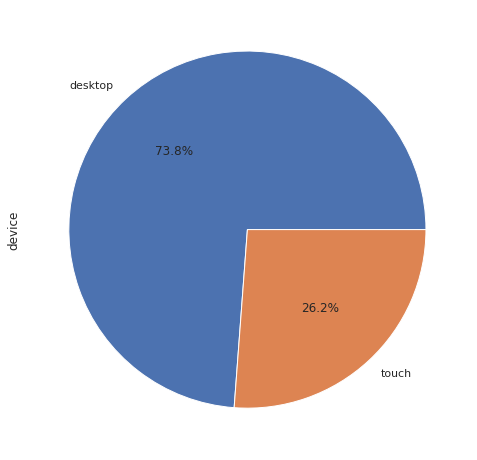

In [268]:
devices.plot.pie(subplots=True, figsize=(8, 10), autopct='%1.1f%%');

Пользователей посетивших сайт с десктопов в 2 раза больше чем тех кто использует мобильные устройства.

Распределение покупателей по платформам:

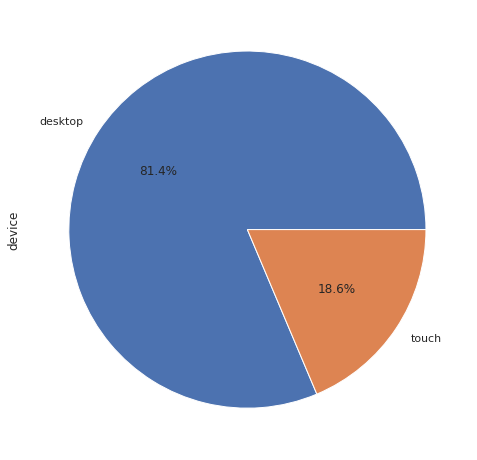

In [269]:
sources_devices = old_orders.groupby('device')['device'].count()
sources_devices.plot.pie(subplots=True, figsize=(8, 10), autopct='%1.1f%%');

Из графиков видно, что пользователи с десктопами более заинтересованы в покупке. Соотношение меняется с **73,8% / 26,2%** в посетителях, на **81,4% / 18,6%** в покупателях (в пользу пользователей десктопов).

Распределение посетителей по рекламным источникам:

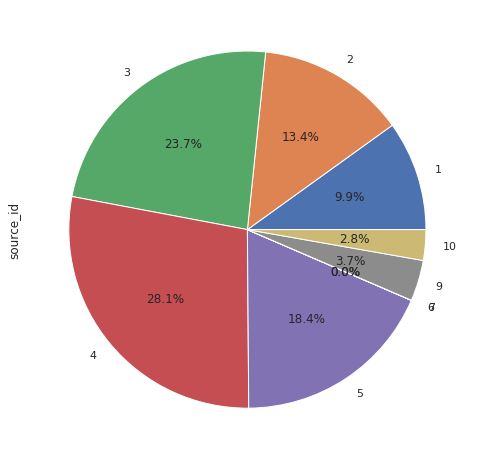

In [270]:
sources = visits.groupby('source_id')['source_id'].count()
sources.plot.pie(subplots=True, figsize=(8, 10), autopct='%1.1f%%');

Распределение покупателей по рекламным источникам:

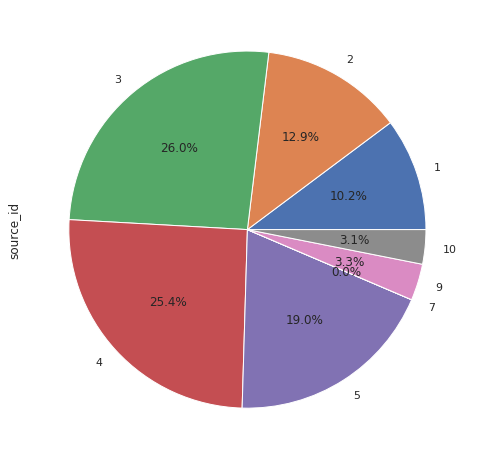

In [271]:
sources_orders = old_orders.groupby('source_id')['source_id'].count()
sources_orders.plot.pie(subplots=True, figsize=(8, 10), autopct='%1.1f%%');

Видно, что посетители из рекламных источников 1, 3 и 10 более заинтересованы в сервисе чем остальные и более охотно совершают покупки во время посещения.

In [272]:
# ROI = pd.concat([total_revenue_by_types, costs_by_month], axis=1, join='inner')
# ROI

In [273]:
# ROI['total'] = (ROI['revenue'] - ROI['costs']) / ROI['costs']

In [274]:
# print("Показатели окупаемости по источникам привлечения за календарный год :",ROI['total'].round(2)*100,'%')

## Итоговые выводы по анализу:

### 1. Распределение денежных средств по месяцам и сезонам:

Необходимо перераспределить финансирование, возможно урезать его в следующие месяцы: Увеличим в отрезке с сентября по декабрь. На эти месяцы приходится половина всех покупок. Динамика рынка такова, что осенью:

    1) выходит больше премьер, особенно под конец года это Сентябрь, Октярь, Ноябрь, Декабрь.
    На эти месяцы приходится ПОЛОВИНА ВСЕЙ выручки, при этом затраты на них сравнимы с тратами на самые низкодоходные месяцы.
    2) Потребители сосредоточены на работе, период отпусков позади - из развлечений только то, что может предложить мегаполис. В это время как можно больше рекламы, через все каналы.

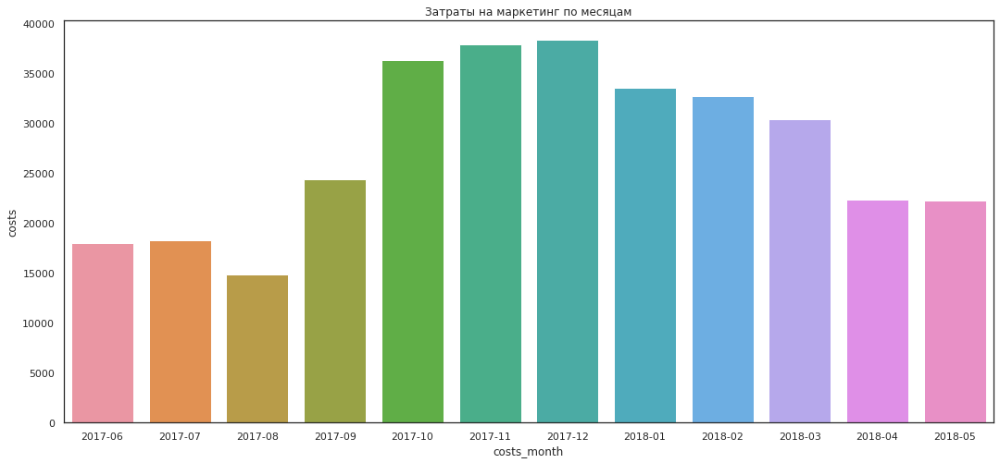

In [275]:
plt.figure(figsize=(18,8))
plt.title('Затраты на маркетинг по месяцам')
sns.barplot(x='costs_month', y='costs', data=spend_by_month);#Обратите внимание сколько тратится на мертвый сезон (январь, февраль, март, апрель), и сколько приносит дохода на графике выше.

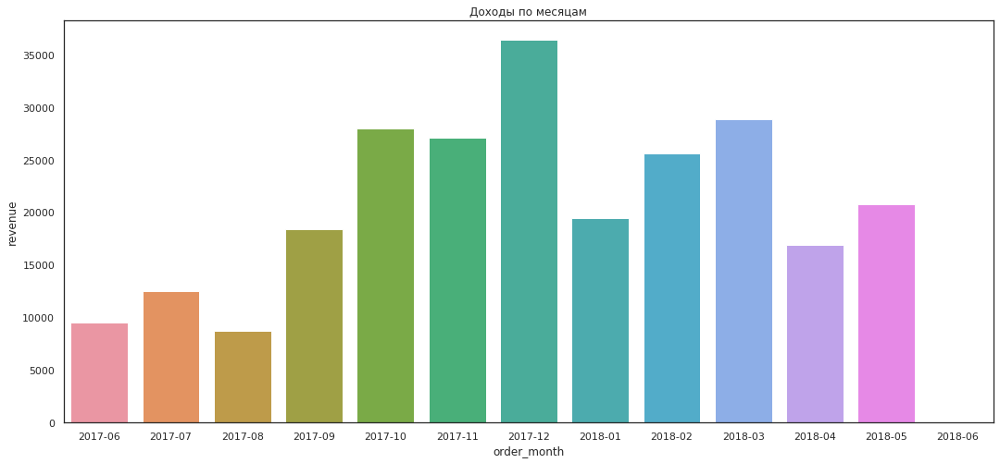

In [276]:
plt.figure(figsize=(18,8))
plt.title('Доходы по месяцам')
sns.barplot(x='order_month', y='revenue', data=profit_by_month); 

### Предложение №1.

Перераспределить траты по месяцам на Сентябрь, Октярь, Ноябрь, Декабрь, уменьшив на половину вложения в продвижение\ рекламирование по каналам Яндекс.Афиша в месяцах Январь, Февраль, Март, Апрель. Я специально не учитываю в расчетах летний месяц ИЮЛЬ, хотя он и прибыльный. Лето - сезон отпусков, летних блокбастеров. Пользователи в условиях хорошей погоды сами потянутся за развлечениями, нет смысла его насильно привлекать.

## 2. Пересмотр каналов привлечения, финансирования.

Сравним расходы по источникам:

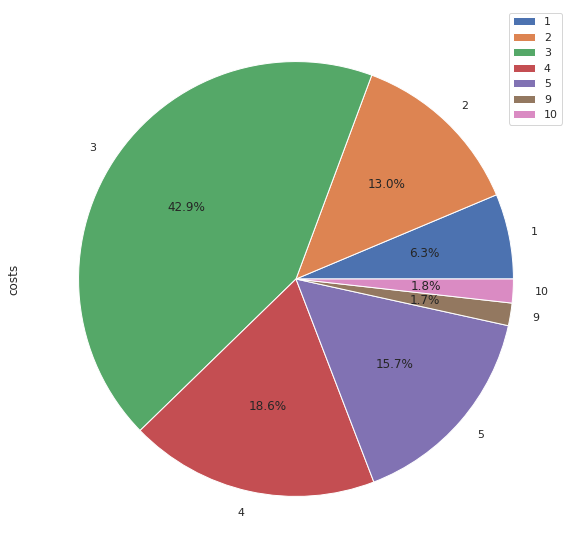

In [277]:
spend_total_sources.plot.pie(subplots=True, figsize=(10, 10), autopct='%1.1f%%');

Доходы по источникам см. ниже:

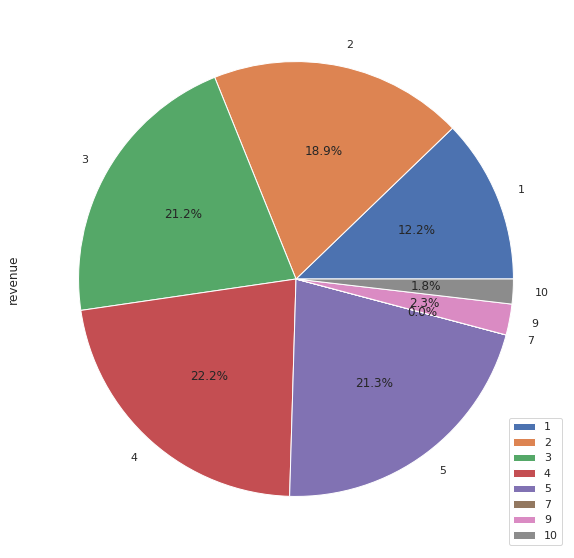

In [278]:
orders_total_sources.plot.pie(subplots=True, figsize=(10, 10), autopct='%1.1f%%');

Из всех источников привлечения стоит сконцентрироваться на увеличении численности\финансирования по cледующим направлениям: source_id: 1,2,5,9 наиболее прибыльны для инвестиций.
Рекламный источник 1 показывает свою эффективность. При инвестициях в него вложенное в среднем возвращается уже на 2 месяц. 5 и 9 источники идут на втором месте, окупая себя на 4 месяц. На третьем месте источник 2, он окупается на 5 месяц. Если взглянуть на источник 4, то увидим, что он окупается и приносит прибыль, однако срок его окупаемости больше чем у источников 1,2,5 и 9 и равен 10 месяцам. Думаю, что финансирование этого источника можно было бы сократить и направить сэкономленные деньги в более перспективные и быстроокупаемые каналы привлечения. 

ROI по когортам - рекламный источник 1
age
0     0.908490
1     1.060863
2     1.275696
3     1.352335
4     1.543212
5     1.729715
6     1.974708
7     2.262957
8     2.712351
9     3.171755
10    3.782918
11    4.691270
dtype: float64


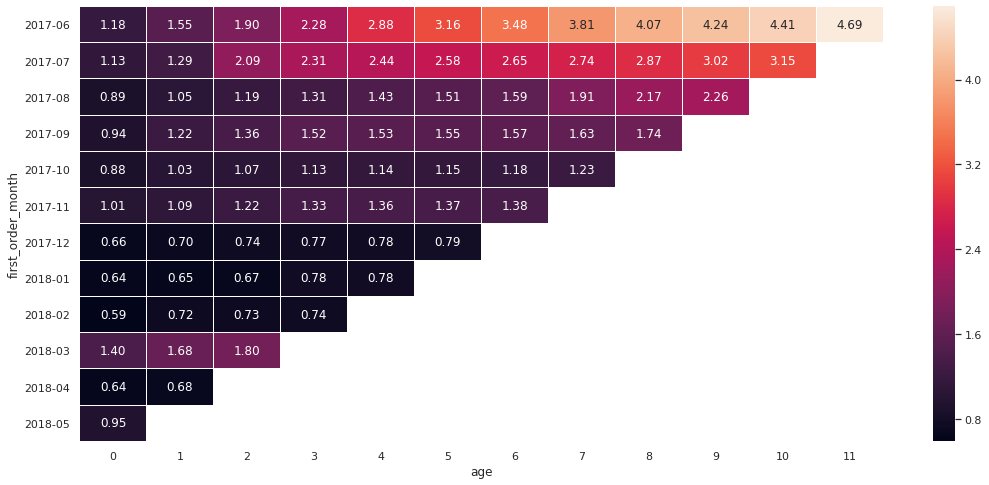

In [279]:
roi_source(1)

ROI по когортам - рекламный источник 2
age
0     0.557785
1     0.628428
2     0.777935
3     0.939890
4     1.085528
5     1.229073
6     1.028975
7     1.138242
8     1.217428
9     0.993856
10    1.293410
11    1.596268
dtype: float64


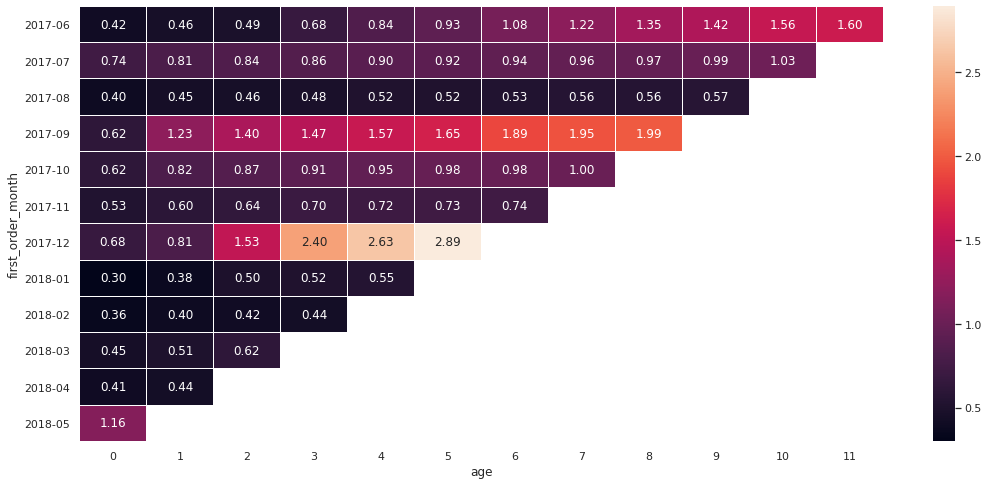

In [280]:
roi_source(2)

ROI по когортам - рекламный источник 4
age
0     0.739388
1     0.766972
2     0.779882
3     0.802998
4     0.832584
5     0.889613
6     0.972278
7     0.894904
8     0.894660
9     0.942544
10    1.158329
11    1.415702
dtype: float64


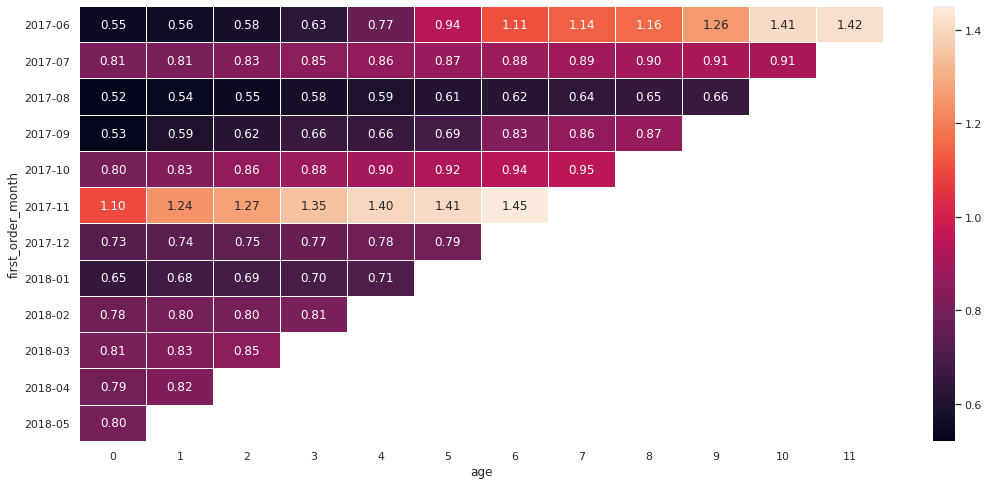

In [281]:
roi_source(4)

ROI по когортам - рекламный источник 5
age
0     0.660809
1     0.711727
2     0.768440
3     1.111803
4     1.239185
5     1.399898
6     1.570062
7     1.817152
8     2.068667
9     1.504991
10    1.466995
11    2.100271
dtype: float64


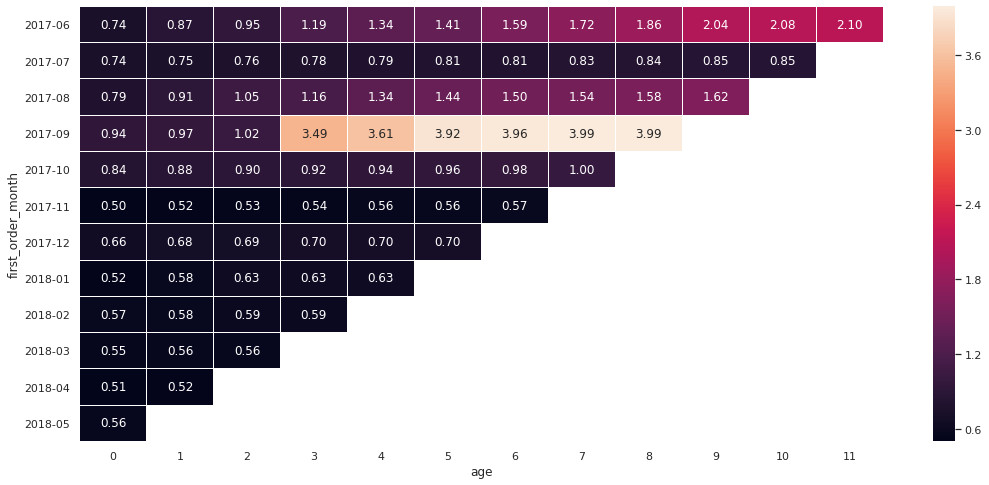

In [282]:
roi_source(5)

ROI по когортам - рекламный источник 9
age
0     0.768979
1     0.851536
2     0.954235
3     1.049840
4     1.093910
5     1.223630
6     1.336217
7     1.471618
8     1.578683
9     1.455783
10    1.473692
dtype: float64


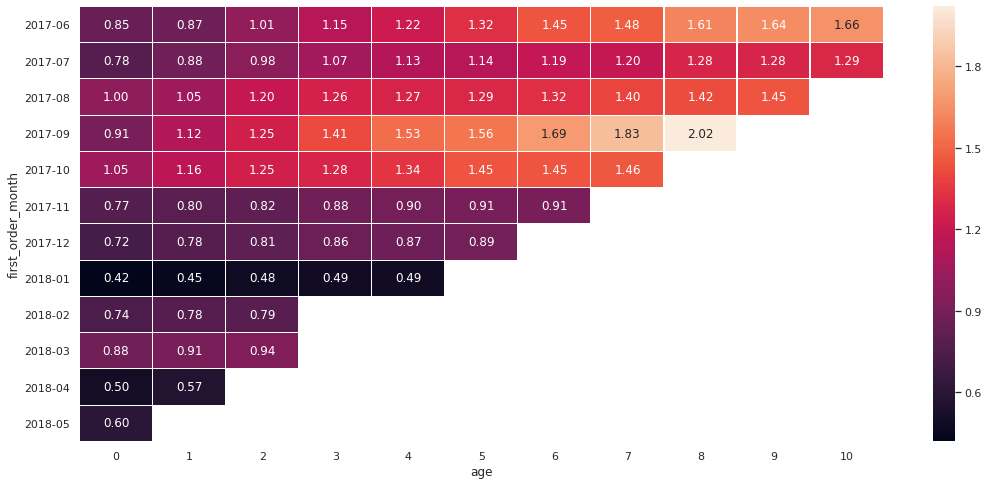

In [283]:
roi_source(9)

Перераспределив финансирование каналов привлечения, избавившись или сведя на минимум самые неэффективные, освободив некоторое количество денег и увеличив финанирование каналов с самым высоким ROI, мы:
- повысим показатели возрата инвестиций,
- снизим стоимость привлечения клиентов,
- увеличим поток платежеспособных клиентов

Если проанализировать распределение посетителей по платформам и покупателей по платформам, то можно сделать некотрые выводы.

Распределение **посетителей** по платформам:

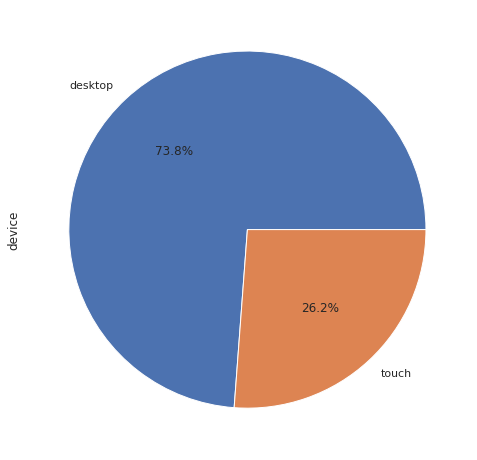

In [284]:
devices.plot.pie(subplots=True, figsize=(8, 10), autopct='%1.1f%%');

Распределение **покупателей** по платформам:

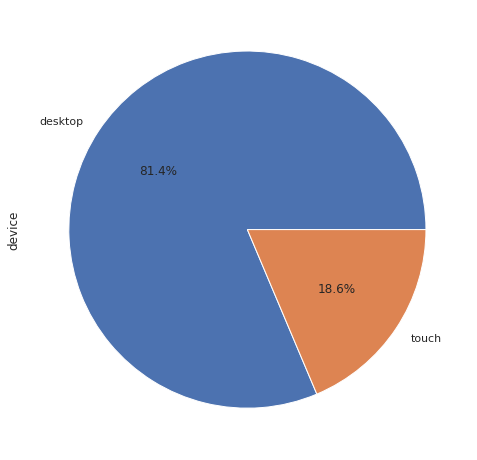

In [285]:
sources_devices.plot.pie(subplots=True, figsize=(8, 10), autopct='%1.1f%%');

Видно, что после посещения сайта с ПК посетитель конвертируется в покупателя, однако тоже самое нельзя сказать о посетителях заходящих с других устройств. Из графиков видно, что пользователи с десктопами более заинтересованы в покупке. Соотношение меняется с 73,8% / 26,2% в посетителях, на 81,4% / 18,6% в покупателях (в пользу пользователей десктопов). Думаю, что пользователь предпоситает покупать билеты с ПК не просто так. Вероятно, дизайн или логика веб сайта пользователю более понятна и привычна, чем дизайн и логика мобильного приложения. Если менеджемент пларирует развивать мобильную платформу и увеличивать конверсию с таких устройств, то есть необходимость в проведении дополнительных исследований и выявлении истинных причин маленькой конверсии пользователей.